## Machine Learning Models: DNN, Naive Bayes Classifier, and Random Forest Classifier

<h1><b><font color=blue>Results:</font></b></h1>

---

<center><img src="https://github.com/omidkj/IMAGES/blob/master/Screen%20Shot%202018-12-11%20at%205.55.55%20PM.png?raw=true" alt="Feature Eng" width="900" height="1200"/></center>

In [1]:
import pandas as pd
import numpy as np
import math as mt
import os.path
import copy
from sklearn.model_selection import train_test_split
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn import metrics
%matplotlib inline

<h1><b><font color=blue> Reading Data extracted from NLP algorithm and data preparation process</font></b></h1>

---

In [2]:
final_data_with_icd_codes = pd.read_csv('final_data_with_icd_codes.csv', header = 0)

In [3]:
final_data_with_icd_codes = final_data_with_icd_codes.drop('Unnamed: 0', axis = 1)

In [5]:
#final_data_with_icd_codes[(final_data_with_icd_codes['target'] == 1) & (final_data_with_icd_codes['cui_exist'] == 0)
                        # & (final_data_with_icd_codes['negation_exist'] == 0)]

In [5]:
final_data = pd.read_csv('final_data.csv', header = 0)

In [6]:
final_data=final_data.drop('Unnamed: 0', axis = 1)

In [7]:
final_data.head()

,cui_exist,negation_exist,uncertainty_exist,hadm_id,seq_number,target
0,0,0,0,111544,16,0
1,1,0,0,166737,2,1
2,0,0,0,137804,15,0
3,1,1,0,162201,2,0
4,1,1,0,168769,6,0


<h2><b><font color=blue> Split the data into training, evaluation, and test datasets:</font></b></h2>

---

In [8]:
X_data = final_data.drop('target', axis = 1)
labels = final_data['target']

In [9]:
train_x, test_x, train_y, test_y  = train_test_split(X_data, labels, test_size=0.4, stratify = labels, random_state=110)

In [10]:
train_x, eval_x, train_y, eval_y  = train_test_split(train_x, train_y, test_size=0.2, stratify = train_y, random_state=110)

<h2><b><font color=red> DNN with Negation and Uncertainty: </font></b></h2>

---

In [11]:
col_names = list(train_x.columns)
col_names.remove('hadm_id')
feature_columns = [tf.feature_column.numeric_column(key = key, shape=[1]) for key in col_names]

In [12]:
model_dir = os.path.join('.', 'model', 'dnn_classifier_2_layers_32_16_drop02')

In [13]:
model = tf.estimator.DNNClassifier(
    feature_columns=feature_columns,
    hidden_units=[32,16],
    dropout=0.2,
    model_dir=model_dir,
    n_classes=2,
    optimizer=tf.train.ProximalAdagradOptimizer(
      learning_rate=0.001,
      l1_regularization_strength=0.001))

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': './model/dnn_classifier_2_layers_32_16_drop02', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f75961c5160>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [14]:
train_input_fn = tf.estimator.inputs.pandas_input_fn(train_x, y=train_y, shuffle=True)
eval_input_fn = tf.estimator.inputs.pandas_input_fn(eval_x, y=eval_y, shuffle=True)

In [15]:
train_spec = tf.estimator.TrainSpec(input_fn=train_input_fn, max_steps=50000)

eval_spec = tf.estimator.EvalSpec(input_fn=eval_input_fn)


In [16]:
tf.estimator.train_and_evaluate(model, train_spec, eval_spec)

INFO:tensorflow:Running training and evaluation locally (non-distributed).
INFO:tensorflow:Start train and evaluate loop. The evaluate will happen after 600 secs (eval_spec.throttle_secs) or training is finished.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 72.46524, step = 1
INFO:tensorflow:Saving checkpoints for 18 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 59.611267.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:37:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:37:53
INFO:tensorflow:Saving dict for global step 90: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.70443827, auc_precision_recall = 0.17576182, average_loss = 0.42684326, global_step = 90, label/mean = 0.07665505, loss = 49.001606, precision = 0.0, prediction/mean = 0.31464702, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 90: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-90
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-90
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 90 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:38:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-180
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:38:02
INFO:tensorflow:Saving dict for global step 180: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.710506, auc_precision_recall = 0.17972295, average_loss = 0.37558237, global_step = 180, label/mean = 0.07665505, loss = 43.116856, precision = 0.0, prediction/mean = 0.2693677, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 180: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-180
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring paramete

INFO:tensorflow:Saving checkpoints for 252 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 50.957474, step = 253
INFO:tensorflow:Saving checkpoints for 270 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 37.396408.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:38:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-270
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:38:11
INFO:tensorflow:Saving dict for global step 270: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.7218482, auc_precision_recall = 0.18546881, average_loss = 0.3458586, global_step = 270, label/mean = 0.07665505, loss = 39.704567, precision = 0.0, prediction/mean = 0.240

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 342: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-342
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-342
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 342 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 45.953434, step = 343
INFO:tensorflow:Saving checkpoints for 360 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 44.363995.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:38:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_class

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:38:27
INFO:tensorflow:Saving dict for global step 432: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.7217839, auc_precision_recall = 0.18546085, average_loss = 0.31311208, global_step = 432, label/mean = 0.07665505, loss = 35.945267, precision = 0.0, prediction/mean = 0.2070363, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 432: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-432
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-432
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 432 into ./model/dnn_classifier_2_layers_32_16

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:38:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-522
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:38:36
INFO:tensorflow:Saving dict for global step 522: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.7406304, auc_precision_recall = 0.3637597, average_loss = 0.30058253, global_step = 522, label/mean = 0.07665505, loss = 34.506874, precision = 0.0, prediction/mean = 0.19316086, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 522: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-522
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring paramet

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 594 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 43.259407, step = 595
INFO:tensorflow:Saving checkpoints for 612 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 48.421665.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:38:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-612
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:38:45
INFO:tensorflow:Saving dict for global step 612: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.75958407, auc_precision_recall = 0.47369698, average_loss = 0.29069835, global_step = 612

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 684: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-684
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-684
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 684 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 45.815384, step = 685
INFO:tensorflow:Saving checkpoints for 702 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 30.498219.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:38:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_class

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:39:01
INFO:tensorflow:Saving dict for global step 774: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.780982, auc_precision_recall = 0.48756525, average_loss = 0.27710095, global_step = 774, label/mean = 0.07665505, loss = 31.811188, precision = 0.0, prediction/mean = 0.16499138, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 774: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-774
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-774
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 774 into ./model/dnn_classifier_2_layers_32_16

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:39:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-864
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:39:10
INFO:tensorflow:Saving dict for global step 864: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.77990997, auc_precision_recall = 0.48735318, average_loss = 0.27137575, global_step = 864, label/mean = 0.07665505, loss = 31.153936, precision = 0.0, prediction/mean = 0.15774886, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 864: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-864
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring param

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 936 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 34.04868, step = 937
INFO:tensorflow:Saving checkpoints for 954 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 48.48548.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:39:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-954
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:39:19
INFO:tensorflow:Saving dict for global step 954: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.7993996, auc_precision_recall = 0.502007, average_loss = 0.26635668, global_step = 954, lab

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1026: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1026
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1026
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1026 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 35.586037, step = 1027
INFO:tensorflow:Saving checkpoints for 1044 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 33.243767.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:39:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:39:35
INFO:tensorflow:Saving dict for global step 1116: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.7988851, auc_precision_recall = 0.50174147, average_loss = 0.25907886, global_step = 1116, label/mean = 0.07665505, loss = 29.742252, precision = 0.0, prediction/mean = 0.14149715, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1116: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1116
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1116
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1116 into ./model/dnn_classifier_2_layer

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:39:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1206
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:39:44
INFO:tensorflow:Saving dict for global step 1206: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8021012, auc_precision_recall = 0.5025618, average_loss = 0.25568932, global_step = 1206, label/mean = 0.07665505, loss = 29.353134, precision = 0.0, prediction/mean = 0.13702512, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1206: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1206
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was final

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1278
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1278 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 37.35765, step = 1279
INFO:tensorflow:Saving checkpoints for 1296 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 43.87757.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:39:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1296
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:39:54
INFO:tensorflow:Saving dict for global step 1296: accuracy 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1368: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1368
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1368
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1368 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 38.629646, step = 1369
INFO:tensorflow:Saving checkpoints for 1386 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 35.630672.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:40:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:40:10
INFO:tensorflow:Saving dict for global step 1458: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.81342196, auc_precision_recall = 0.53692365, average_loss = 0.24807228, global_step = 1458, label/mean = 0.07665505, loss = 28.478699, precision = 0.0, prediction/mean = 0.1266725, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1458: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1458
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1458
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1458 into ./model/dnn_classifier_2_layer

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:40:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1548
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:40:19
INFO:tensorflow:Saving dict for global step 1548: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.821934, auc_precision_recall = 0.54333615, average_loss = 0.24587232, global_step = 1548, label/mean = 0.07665505, loss = 28.226141, precision = 0.0, prediction/mean = 0.12359609, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1548: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1548
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was final

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1620
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1620 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 37.888428, step = 1621
INFO:tensorflow:Saving checkpoints for 1638 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 39.49744.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:40:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1638
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:40:27
INFO:tensorflow:Saving dict for global step 1638: accuracy

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1710: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1710
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1710
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1710 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.405653, step = 1711
INFO:tensorflow:Saving checkpoints for 1728 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 33.97385.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:40:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:40:43
INFO:tensorflow:Saving dict for global step 1800: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.82257724, auc_precision_recall = 0.5435436, average_loss = 0.24100928, global_step = 1800, label/mean = 0.07665505, loss = 27.667866, precision = 0.0, prediction/mean = 0.11688784, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1800: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1800
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1800
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1800 into ./model/dnn_classifier_2_layer

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:40:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1890
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:40:52
INFO:tensorflow:Saving dict for global step 1890: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8218911, auc_precision_recall = 0.5433315, average_loss = 0.23951785, global_step = 1890, label/mean = 0.07665505, loss = 27.496649, precision = 0.0, prediction/mean = 0.11488344, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1890: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1890
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was final

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1962
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1962 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 36.558018, step = 1963
INFO:tensorflow:Saving checkpoints for 1980 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.650772.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:41:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-1980
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:41:02
INFO:tensorflow:Saving dict for global step 1980: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2052: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2052
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2052
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2052 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 38.410797, step = 2053
INFO:tensorflow:Saving checkpoints for 2070 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 33.30169.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:41:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:41:18
INFO:tensorflow:Saving dict for global step 2142: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.82347775, auc_precision_recall = 0.54393315, average_loss = 0.23547746, global_step = 2142, label/mean = 0.07665505, loss = 27.032812, precision = 0.0, prediction/mean = 0.10955678, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2142: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2142
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2142
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2142 into ./model/dnn_classifier_2_laye

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:41:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2232
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:41:26
INFO:tensorflow:Saving dict for global step 2232: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.82585764, auc_precision_recall = 0.5445244, average_loss = 0.23400517, global_step = 2232, label/mean = 0.07665505, loss = 26.863794, precision = 0.0, prediction/mean = 0.107865565, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2232: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2232
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fin

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2304
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2304 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 33.56833, step = 2305
INFO:tensorflow:Saving checkpoints for 2322 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.675247.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:41:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2322
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:41:36
INFO:tensorflow:Saving dict for global step 2322: accuracy

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2394: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2394
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2394
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2394 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.823088, step = 2395
INFO:tensorflow:Saving checkpoints for 2412 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.53785.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:41:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:41:52
INFO:tensorflow:Saving dict for global step 2484: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8252144, auc_precision_recall = 0.5444503, average_loss = 0.23015523, global_step = 2484, label/mean = 0.07665505, loss = 26.42182, precision = 0.0, prediction/mean = 0.103477664, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2484: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2484
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2484
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2484 into ./model/dnn_classifier_2_layers

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:42:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2574
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:42:00
INFO:tensorflow:Saving dict for global step 2574: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8252144, auc_precision_recall = 0.5444503, average_loss = 0.2289182, global_step = 2574, label/mean = 0.07665505, loss = 26.27981, precision = 0.0, prediction/mean = 0.102246806, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2574: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2574
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finali

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2646
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2646 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 34.543945, step = 2647
INFO:tensorflow:Saving checkpoints for 2664 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 37.363388.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:42:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2664
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:42:10
INFO:tensorflow:Saving dict for global step 2664: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2736: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2736
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2736
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2736 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 38.481693, step = 2737
INFO:tensorflow:Saving checkpoints for 2754 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 32.71626.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:42:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:42:25
INFO:tensorflow:Saving dict for global step 2826: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8252144, auc_precision_recall = 0.54445857, average_loss = 0.22564729, global_step = 2826, label/mean = 0.07665505, loss = 25.904308, precision = 0.0, prediction/mean = 0.09894655, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2826: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2826
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2826
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2826 into ./model/dnn_classifier_2_layer

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:42:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2916
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:42:35
INFO:tensorflow:Saving dict for global step 2916: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8252144, auc_precision_recall = 0.54445857, average_loss = 0.22458649, global_step = 2916, label/mean = 0.07665505, loss = 25.782528, precision = 0.0, prediction/mean = 0.09789253, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2916: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2916
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fina

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-2988
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2988 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 36.83876, step = 2989
INFO:tensorflow:Saving checkpoints for 3006 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 32.323696.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:42:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3006
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:42:43
INFO:tensorflow:Saving dict for global step 3006: accuracy

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3078: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3078
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3078
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3078 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.218618, step = 3079
INFO:tensorflow:Saving checkpoints for 3096 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.157507.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:42:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3168
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:43:00
INFO:tensorflow:Saving dict for global step 3168: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.82564324, auc_precision_recall = 0.5451234, average_loss = 0.22137353, global_step = 3168, label/mean = 0.07665505, loss = 25.413681, precision = 0.0, prediction/mean = 0.095012404, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3168: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3168
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3168
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Don

INFO:tensorflow:Loss for final step: 33.810284.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:43:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3258
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:43:08
INFO:tensorflow:Saving dict for global step 3258: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.825729, auc_precision_recall = 0.5496689, average_loss = 0.22026753, global_step = 3258, label/mean = 0.07665505, loss = 25.286713, precision = 0.0, prediction/mean = 0.09416148, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3258: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3258
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create Check

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3330
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3330 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 40.8774, step = 3331
INFO:tensorflow:Saving checkpoints for 3348 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.234863.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:43:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3348
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:43:16
INFO:tensorflow

INFO:tensorflow:Saving dict for global step 3420: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.825729, auc_precision_recall = 0.54966885, average_loss = 0.21829687, global_step = 3420, label/mean = 0.07665505, loss = 25.060482, precision = 0.0, prediction/mean = 0.092584394, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3420: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3420
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3420
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3420 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.729908, step = 3421
INFO:tensorflow:Saving checkpoints for 3438 into ./model/dnn_classifi

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:43:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3510
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:43:33
INFO:tensorflow:Saving dict for global step 3510: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.825729, auc_precision_recall = 0.5496689, average_loss = 0.21728964, global_step = 3510, label/mean = 0.07665505, loss = 24.94485, precision = 0.0, prediction/mean = 0.09197572, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3510: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3510
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring para

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3582 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.908535, step = 3583
INFO:tensorflow:Saving checkpoints for 3600 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.610903.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:43:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3600
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:43:41
INFO:tensorflow:Saving dict for global step 3600: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.828259, auc_precision_recall = 0.564693, average_loss = 0.21623532, global_step = 3600, label/mean = 0.07665505, loss = 24.

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3672: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3672
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3672
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3672 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.09858, step = 3673
INFO:tensorflow:Saving checkpoints for 3690 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 32.43788.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:43:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_c

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:43:59
INFO:tensorflow:Saving dict for global step 3762: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83066034, auc_precision_recall = 0.5791155, average_loss = 0.21446581, global_step = 3762, label/mean = 0.07665505, loss = 24.620676, precision = 0.0, prediction/mean = 0.08989233, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3762: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3762
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3762
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3762 into ./model/dnn_classifier_2_layer

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:44:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3852
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:44:07
INFO:tensorflow:Saving dict for global step 3852: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8307461, auc_precision_recall = 0.58138824, average_loss = 0.21356827, global_step = 3852, label/mean = 0.07665505, loss = 24.517637, precision = 0.0, prediction/mean = 0.089249134, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3852: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3852
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fin

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3924
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3924 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 32.148026, step = 3925
INFO:tensorflow:Saving checkpoints for 3942 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 33.662964.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:44:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-3942
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:44:18
INFO:tensorflow:Saving dict for global step 3942: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4014: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4014
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4014
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4014 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.363262, step = 4015
INFO:tensorflow:Saving checkpoints for 4032 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.209929.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:44:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:44:32
INFO:tensorflow:Saving dict for global step 4104: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8392796, auc_precision_recall = 0.6320416, average_loss = 0.21116702, global_step = 4104, label/mean = 0.07665505, loss = 24.241974, precision = 0.0, prediction/mean = 0.08760076, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4104: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4104
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4104
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4104 into ./model/dnn_classifier_2_layers

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:44:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4194
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:44:40
INFO:tensorflow:Saving dict for global step 4194: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8471698, auc_precision_recall = 0.66119087, average_loss = 0.21036376, global_step = 4194, label/mean = 0.07665505, loss = 24.14976, precision = 0.0, prediction/mean = 0.08725396, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4194: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4194
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was final

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4266
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4266 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.138016, step = 4267
INFO:tensorflow:Saving checkpoints for 4284 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 42.16641.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:44:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4284
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:44:52
INFO:tensorflow:Saving dict for global step 4284: accuracy

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4356: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4356
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4356
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4356 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.214922, step = 4357
INFO:tensorflow:Saving checkpoints for 4374 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.941797.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:44:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:45:06
INFO:tensorflow:Saving dict for global step 4446: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8501501, auc_precision_recall = 0.66159254, average_loss = 0.20815715, global_step = 4446, label/mean = 0.07665505, loss = 23.896442, precision = 0.0, prediction/mean = 0.0861986, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4446: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4446
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4446
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4446 into ./model/dnn_classifier_2_layers

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:45:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4536
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:45:14
INFO:tensorflow:Saving dict for global step 4536: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8550815, auc_precision_recall = 0.6650078, average_loss = 0.20745674, global_step = 4536, label/mean = 0.07665505, loss = 23.816034, precision = 0.0, prediction/mean = 0.08589957, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4536: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4536
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was final

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4608
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4608 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 33.224144, step = 4609
INFO:tensorflow:Saving checkpoints for 4626 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.699226.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:45:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4626
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:45:26
INFO:tensorflow:Saving dict for global step 4626: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4698: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4698
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4698
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4698 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 37.170006, step = 4699
INFO:tensorflow:Saving checkpoints for 4716 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.390009.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:45:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:45:40
INFO:tensorflow:Saving dict for global step 4788: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8600128, auc_precision_recall = 0.6680645, average_loss = 0.20548621, global_step = 4788, label/mean = 0.07665505, loss = 23.589817, precision = 0.0, prediction/mean = 0.085263886, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4788: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4788
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4788
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4788 into ./model/dnn_classifier_2_layer

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:45:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4878
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:45:48
INFO:tensorflow:Saving dict for global step 4878: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8600128, auc_precision_recall = 0.6680644, average_loss = 0.20482694, global_step = 4878, label/mean = 0.07665505, loss = 23.514133, precision = 0.0, prediction/mean = 0.08507662, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4878: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4878
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was final

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4950
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4950 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 18.898735, step = 4951
INFO:tensorflow:Saving checkpoints for 4968 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 31.633766.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:46:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-4968
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:46:00
INFO:tensorflow:Saving dict for global step 4968: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5040: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5040
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5040
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5040 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.041552, step = 5041
INFO:tensorflow:Saving checkpoints for 5058 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 40.708485.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:46:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:46:14
INFO:tensorflow:Saving dict for global step 5130: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85997, auc_precision_recall = 0.6680521, average_loss = 0.2030166, global_step = 5130, label/mean = 0.07665505, loss = 23.306305, precision = 0.0, prediction/mean = 0.084449515, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5130: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5130
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5130
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5130 into ./model/dnn_classifier_2_layers_3

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:46:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5220
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:46:23
INFO:tensorflow:Saving dict for global step 5220: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85997, auc_precision_recall = 0.668052, average_loss = 0.20240253, global_step = 5220, label/mean = 0.07665505, loss = 23.235811, precision = 0.0, prediction/mean = 0.08430292, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5220: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5220
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalize

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5292
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5292 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.835838, step = 5293
INFO:tensorflow:Saving checkpoints for 5310 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.121391.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:46:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5310
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:46:34
INFO:tensorflow:Saving dict for global step 5310: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5382: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5382
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5382
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5382 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.975075, step = 5383
INFO:tensorflow:Saving checkpoints for 5400 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.8579.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:46:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_c

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:46:49
INFO:tensorflow:Saving dict for global step 5472: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85997, auc_precision_recall = 0.66805214, average_loss = 0.20070198, global_step = 5472, label/mean = 0.07665505, loss = 23.040586, precision = 0.0, prediction/mean = 0.08406384, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5472: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5472
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5472
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5472 into ./model/dnn_classifier_2_layers_

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:46:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5562
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:46:57
INFO:tensorflow:Saving dict for global step 5562: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85997, auc_precision_recall = 0.6680521, average_loss = 0.20010844, global_step = 5562, label/mean = 0.07665505, loss = 22.972448, precision = 0.0, prediction/mean = 0.08397336, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5562: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5562
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finaliz

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5634
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5634 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.651806, step = 5635
INFO:tensorflow:Saving checkpoints for 5652 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.94625.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:47:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5652
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:47:05
INFO:tensorflow:Saving dict for global step 5652: accuracy

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5724: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5724
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5724
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5724 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.509321, step = 5725
INFO:tensorflow:Saving checkpoints for 5742 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.650557.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:47:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:47:24
INFO:tensorflow:Saving dict for global step 5814: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8618567, auc_precision_recall = 0.6683626, average_loss = 0.19850954, global_step = 5814, label/mean = 0.07665505, loss = 22.788897, precision = 0.0, prediction/mean = 0.0838768, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5814: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5814
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5814
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5814 into ./model/dnn_classifier_2_layers_

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:47:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5904
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:47:32
INFO:tensorflow:Saving dict for global step 5904: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86185676, auc_precision_recall = 0.6683626, average_loss = 0.19795811, global_step = 5904, label/mean = 0.07665505, loss = 22.725592, precision = 0.0, prediction/mean = 0.08371546, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5904: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5904
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fina

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5976
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5976 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.938389, step = 5977
INFO:tensorflow:Saving checkpoints for 5994 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.0732.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:47:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-5994
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:47:40
INFO:tensorflow:Saving dict for global step 5994: accuracy 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6066: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6066
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6066
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6066 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.820412, step = 6067
INFO:tensorflow:Saving checkpoints for 6084 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.273838.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:47:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:47:55
INFO:tensorflow:Saving dict for global step 6156: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8618568, auc_precision_recall = 0.6683626, average_loss = 0.19650923, global_step = 6156, label/mean = 0.07665505, loss = 22.55926, precision = 0.0, prediction/mean = 0.083497725, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6156: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6156
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6156
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6156 into ./model/dnn_classifier_2_layers

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:48:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6246
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:48:08
INFO:tensorflow:Saving dict for global step 6246: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8618568, auc_precision_recall = 0.6683626, average_loss = 0.19601296, global_step = 6246, label/mean = 0.07665505, loss = 22.502287, precision = 0.0, prediction/mean = 0.083329156, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6246: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6246
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fina

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6318
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6318 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.462122, step = 6319
INFO:tensorflow:Saving checkpoints for 6336 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 30.726725.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:48:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6336
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:48:16
INFO:tensorflow:Saving dict for global step 6336: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6408: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6408
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6408
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6408 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 33.053146, step = 6409
INFO:tensorflow:Saving checkpoints for 6426 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 41.22551.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:48:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6498
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:48:30
INFO:tensorflow:Saving dict for global step 6498: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8625214, auc_precision_recall = 0.66845137, average_loss = 0.19470432, global_step = 6498, label/mean = 0.07665505, loss = 22.352057, precision = 0.0, prediction/mean = 0.08306402, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6498: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6498
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6498
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done

INFO:tensorflow:Loss for final step: 28.038101.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:48:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6588
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:48:38
INFO:tensorflow:Saving dict for global step 6588: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86247855, auc_precision_recall = 0.6684468, average_loss = 0.1942571, global_step = 6588, label/mean = 0.07665505, loss = 22.300714, precision = 0.0, prediction/mean = 0.08300218, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6588: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6588
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create Chec

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6660
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6660 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 33.61967, step = 6661
INFO:tensorflow:Saving checkpoints for 6678 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 42.41303.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:48:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6678
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:48:51
INFO:tensorflow

INFO:tensorflow:Saving dict for global step 6750: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86247855, auc_precision_recall = 0.6684468, average_loss = 0.19345269, global_step = 6750, label/mean = 0.07665505, loss = 22.208368, precision = 0.0, prediction/mean = 0.083030544, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6750: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6750
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6750
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6750 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 19.251991, step = 6751
INFO:tensorflow:Saving checkpoints for 6768 into ./model/dnn_classif

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:49:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6840
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:49:06
INFO:tensorflow:Saving dict for global step 6840: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86400086, auc_precision_recall = 0.6686354, average_loss = 0.19301839, global_step = 6840, label/mean = 0.07665505, loss = 22.158512, precision = 0.0, prediction/mean = 0.08290848, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6840: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6840
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring p

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6912 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.648838, step = 6913
INFO:tensorflow:Saving checkpoints for 6930 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 33.593113.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:49:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-6930
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:49:14
INFO:tensorflow:Saving dict for global step 6930: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86400086, auc_precision_recall = 0.66863537, average_loss = 0.19257088, global_step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7002: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7002
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7002
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7002 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 39.397324, step = 7003
INFO:tensorflow:Saving checkpoints for 7020 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.221045.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:49:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:49:29
INFO:tensorflow:Saving dict for global step 7092: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86400086, auc_precision_recall = 0.6686354, average_loss = 0.191816, global_step = 7092, label/mean = 0.07665505, loss = 22.020477, precision = 0.0, prediction/mean = 0.0828305, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7092: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7092
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7092
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7092 into ./model/dnn_classifier_2_layers_3

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:49:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7182
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:49:42
INFO:tensorflow:Saving dict for global step 7182: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86442965, auc_precision_recall = 0.6693456, average_loss = 0.19141713, global_step = 7182, label/mean = 0.07665505, loss = 21.974686, precision = 0.0, prediction/mean = 0.08276004, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7182: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7182
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fina

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7254
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7254 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.473919, step = 7255
INFO:tensorflow:Saving checkpoints for 7272 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.124012.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:49:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7272
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:49:51
INFO:tensorflow:Saving dict for global step 7272: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7344: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7344
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7344
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7344 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.877708, step = 7345
INFO:tensorflow:Saving checkpoints for 7362 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.241165.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:49:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:50:05
INFO:tensorflow:Saving dict for global step 7434: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8649442, auc_precision_recall = 0.6699676, average_loss = 0.19034794, global_step = 7434, label/mean = 0.07665505, loss = 21.851944, precision = 0.0, prediction/mean = 0.08271866, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7434: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7434
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7434
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7434 into ./model/dnn_classifier_2_layers

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:50:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7524
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:50:14
INFO:tensorflow:Saving dict for global step 7524: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86425817, auc_precision_recall = 0.66706055, average_loss = 0.18999505, global_step = 7524, label/mean = 0.07665505, loss = 21.811432, precision = 0.0, prediction/mean = 0.08266901, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7524: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7524
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fin

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7596
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7596 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 21.14009, step = 7597
INFO:tensorflow:Saving checkpoints for 7614 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.549946.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:50:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7614
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:50:22
INFO:tensorflow:Saving dict for global step 7614: accuracy

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7686: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7686
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7686
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7686 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 41.009037, step = 7687
INFO:tensorflow:Saving checkpoints for 7704 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.654688.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:50:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:50:42
INFO:tensorflow:Saving dict for global step 7776: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8647727, auc_precision_recall = 0.669943, average_loss = 0.18903582, global_step = 7776, label/mean = 0.07665505, loss = 21.701313, precision = 0.0, prediction/mean = 0.08254844, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7776: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7776
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7776
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7776 into ./model/dnn_classifier_2_layers_

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:50:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7866
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:50:50
INFO:tensorflow:Saving dict for global step 7866: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86468697, auc_precision_recall = 0.66767025, average_loss = 0.18870947, global_step = 7866, label/mean = 0.07665505, loss = 21.663847, precision = 0.0, prediction/mean = 0.08251981, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7866: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7866
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fin

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7938
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7938 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.53424, step = 7939
INFO:tensorflow:Saving checkpoints for 7956 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.95409.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:50:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-7956
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:50:58
INFO:tensorflow:Saving dict for global step 7956: accuracy 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8028: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8028
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8028
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8028 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 42.5998, step = 8029
INFO:tensorflow:Saving checkpoints for 8046 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.929338.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:51:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_c

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:51:13
INFO:tensorflow:Saving dict for global step 8118: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86374354, auc_precision_recall = 0.6696248, average_loss = 0.18783706, global_step = 8118, label/mean = 0.07665505, loss = 21.563694, precision = 0.0, prediction/mean = 0.08233173, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8118: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8118
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8118
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8118 into ./model/dnn_classifier_2_layer

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:51:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8208
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:51:21
INFO:tensorflow:Saving dict for global step 8208: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8637436, auc_precision_recall = 0.6696248, average_loss = 0.18753392, global_step = 8208, label/mean = 0.07665505, loss = 21.528894, precision = 0.0, prediction/mean = 0.082298756, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8208: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8208
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fina

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8280
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8280 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.964115, step = 8281
INFO:tensorflow:Saving checkpoints for 8298 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.209217.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:51:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8298
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:51:29
INFO:tensorflow:Saving dict for global step 8298: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8370: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8370
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8370
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8370 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 36.719524, step = 8371
INFO:tensorflow:Saving checkpoints for 8388 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.36691.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:51:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:51:50
INFO:tensorflow:Saving dict for global step 8460: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86365783, auc_precision_recall = 0.66735214, average_loss = 0.18668248, global_step = 8460, label/mean = 0.07665505, loss = 21.431149, precision = 0.0, prediction/mean = 0.08223604, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8460: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8460
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8460
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8460 into ./model/dnn_classifier_2_laye

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:51:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8550
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:51:58
INFO:tensorflow:Saving dict for global step 8550: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.865373, auc_precision_recall = 0.6771679, average_loss = 0.18638472, global_step = 8550, label/mean = 0.07665505, loss = 21.396967, precision = 0.0, prediction/mean = 0.08208991, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8550: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8550
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finali

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8622
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8622 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 43.03538, step = 8623
INFO:tensorflow:Saving checkpoints for 8640 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.006174.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:52:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8640
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:52:06
INFO:tensorflow:Saving dict for global step 8640: accuracy

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8712: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8712
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8712
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8712 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.29375, step = 8713
INFO:tensorflow:Saving checkpoints for 8730 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.70736.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:52:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_c

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:52:21
INFO:tensorflow:Saving dict for global step 8802: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8653731, auc_precision_recall = 0.6771679, average_loss = 0.18556379, global_step = 8802, label/mean = 0.07665505, loss = 21.302723, precision = 0.0, prediction/mean = 0.08194259, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8802: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8802
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8802
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8802 into ./model/dnn_classifier_2_layers

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:52:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8892
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:52:29
INFO:tensorflow:Saving dict for global step 8892: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86725986, auc_precision_recall = 0.6808045, average_loss = 0.18528078, global_step = 8892, label/mean = 0.07665505, loss = 21.270235, precision = 0.0, prediction/mean = 0.08183256, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8892: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8892
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fina

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8964
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8964 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.130096, step = 8965
INFO:tensorflow:Saving checkpoints for 8982 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.161383.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:52:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-8982
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:52:37
INFO:tensorflow:Saving dict for global step 8982: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9054: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9054
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9054
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9054 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.632345, step = 9055
INFO:tensorflow:Saving checkpoints for 9072 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.121681.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:52:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:52:59
INFO:tensorflow:Saving dict for global step 9144: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8672384, auc_precision_recall = 0.68080056, average_loss = 0.18452029, global_step = 9144, label/mean = 0.07665505, loss = 21.18293, precision = 0.0, prediction/mean = 0.08181897, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9144: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9144
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9144
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9144 into ./model/dnn_classifier_2_layers

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:53:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9234
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:53:07
INFO:tensorflow:Saving dict for global step 9234: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8671527, auc_precision_recall = 0.6762551, average_loss = 0.1842614, global_step = 9234, label/mean = 0.07665505, loss = 21.15321, precision = 0.0, prediction/mean = 0.08174037, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9234: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9234
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finaliz

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9306
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9306 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.981443, step = 9307
INFO:tensorflow:Saving checkpoints for 9324 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.353132.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:53:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9324
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:53:15
INFO:tensorflow:Saving dict for global step 9324: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9396: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9396
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9396
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9396 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 18.109114, step = 9397
INFO:tensorflow:Saving checkpoints for 9414 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.65374.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:53:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:53:30
INFO:tensorflow:Saving dict for global step 9486: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86927533, auc_precision_recall = 0.68028164, average_loss = 0.18352404, global_step = 9486, label/mean = 0.07665505, loss = 21.06856, precision = 0.0, prediction/mean = 0.08153318, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9486: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9486
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9486
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9486 into ./model/dnn_classifier_2_layer

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:53:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9576
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:53:38
INFO:tensorflow:Saving dict for global step 9576: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86914665, auc_precision_recall = 0.6801525, average_loss = 0.18326809, global_step = 9576, label/mean = 0.07665505, loss = 21.039177, precision = 0.0, prediction/mean = 0.08148047, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9576: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9576
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fina

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9648
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9648 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 19.206501, step = 9649
INFO:tensorflow:Saving checkpoints for 9666 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.422037.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:53:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9666
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:53:46
INFO:tensorflow:Saving dict for global step 9666: accurac

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9738: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9738
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9738
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9738 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 40.393192, step = 9739
INFO:tensorflow:Saving checkpoints for 9756 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.6786995.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:54:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dn

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:54:08
INFO:tensorflow:Saving dict for global step 9828: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8690609, auc_precision_recall = 0.675607, average_loss = 0.1825671, global_step = 9828, label/mean = 0.07665505, loss = 20.958704, precision = 0.0, prediction/mean = 0.08146327, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9828: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9828
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9828
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9828 into ./model/dnn_classifier_2_layers_3

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:54:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9918
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:54:16
INFO:tensorflow:Saving dict for global step 9918: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8690609, auc_precision_recall = 0.675607, average_loss = 0.18232216, global_step = 9918, label/mean = 0.07665505, loss = 20.930584, precision = 0.0, prediction/mean = 0.081522375, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9918: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9918
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was final

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-9990
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9990 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 15.6149845, step = 9991
INFO:tensorflow:Saving checkpoints for 10008 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.934664.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:54:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10008
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:54:24
INFO:tensorflow:Saving dict for global step 10008: acc

INFO:tensorflow:Saving dict for global step 10080: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8700686, auc_precision_recall = 0.67576736, average_loss = 0.18189158, global_step = 10080, label/mean = 0.07665505, loss = 20.881153, precision = 0.0, prediction/mean = 0.08151764, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10080: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10080
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10080
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10080 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.889645, step = 10081
INFO:tensorflow:Saving checkpoints for 10098 into ./model/dnn_

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:54:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10170
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:54:39
INFO:tensorflow:Saving dict for global step 10170: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8701544, auc_precision_recall = 0.6803129, average_loss = 0.18164882, global_step = 10170, label/mean = 0.07665505, loss = 20.853285, precision = 0.0, prediction/mean = 0.081422515, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10170: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10170
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restor

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10242 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 53.305134, step = 10243
INFO:tensorflow:Saving checkpoints for 10260 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.993176.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:54:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10260
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:54:47
INFO:tensorflow:Saving dict for global step 10260: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8700686, auc_precision_recall = 0.67576736, average_loss = 0.18141384, global_s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10332: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10332
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10332
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10332 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 36.18779, step = 10333
INFO:tensorflow:Saving checkpoints for 10350 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.776527.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:54:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10422
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:55:02
INFO:tensorflow:Saving dict for global step 10422: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86955404, auc_precision_recall = 0.6756247, average_loss = 0.18099725, global_step = 10422, label/mean = 0.07665505, loss = 20.778484, precision = 0.0, prediction/mean = 0.08136445, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10422: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10422
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10422
INFO:tensorflow:

INFO:tensorflow:loss = 25.172695, step = 10495
INFO:tensorflow:Saving checkpoints for 10512 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 31.099302.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:55:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10512
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:55:18
INFO:tensorflow:Saving dict for global step 10512: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8704331, auc_precision_recall = 0.6757666, average_loss = 0.18076827, global_step = 10512, label/mean = 0.07665505, loss = 20.752197, precision = 0.0, prediction/mean = 0.0813474, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10512: ./mo

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10584: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10584
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10584
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10584 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 19.39556, step = 10585
INFO:tensorflow:Saving checkpoints for 10602 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.253822.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:55:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10674
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:55:32
INFO:tensorflow:Saving dict for global step 10674: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87051886, auc_precision_recall = 0.67843556, average_loss = 0.18036114, global_step = 10674, label/mean = 0.07665505, loss = 20.705458, precision = 0.0, prediction/mean = 0.081338815, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10674: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10674
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10674
INFO:tensorflo

INFO:tensorflow:loss = 28.163212, step = 10747
INFO:tensorflow:Saving checkpoints for 10764 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.351164.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:55:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10764
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:55:41
INFO:tensorflow:Saving dict for global step 10764: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8736278, auc_precision_recall = 0.67650855, average_loss = 0.18013637, global_step = 10764, label/mean = 0.07665505, loss = 20.679655, precision = 0.0, prediction/mean = 0.081191175, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10764: .

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10836: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10836
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10836
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10836 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 38.68994, step = 10837
INFO:tensorflow:Saving checkpoints for 10854 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 34.936077.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:55:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10926
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:55:55
INFO:tensorflow:Saving dict for global step 10926: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87371355, auc_precision_recall = 0.68105406, average_loss = 0.17973273, global_step = 10926, label/mean = 0.07665505, loss = 20.633316, precision = 0.0, prediction/mean = 0.08108897, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10926: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10926
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-10926
INFO:tensorflow

INFO:tensorflow:loss = 23.017166, step = 10999
INFO:tensorflow:Saving checkpoints for 11016 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.132349.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:56:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11016
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:56:03
INFO:tensorflow:Saving dict for global step 11016: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8736278, auc_precision_recall = 0.67650855, average_loss = 0.17951903, global_step = 11016, label/mean = 0.07665505, loss = 20.608784, precision = 0.0, prediction/mean = 0.08098565, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11016: ./

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11088: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11088
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11088
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11088 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 32.966263, step = 11089
INFO:tensorflow:Saving checkpoints for 11106 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.42395.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:56:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11178
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:56:18
INFO:tensorflow:Saving dict for global step 11178: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8736278, auc_precision_recall = 0.6765086, average_loss = 0.17914245, global_step = 11178, label/mean = 0.07665505, loss = 20.565554, precision = 0.0, prediction/mean = 0.080912836, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11178: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11178
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11178
INFO:tensorflow:

INFO:tensorflow:loss = 31.941742, step = 11251
INFO:tensorflow:Saving checkpoints for 11268 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.310263.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:56:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11268
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:56:34
INFO:tensorflow:Saving dict for global step 11268: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8736278, auc_precision_recall = 0.6765086, average_loss = 0.17893682, global_step = 11268, label/mean = 0.07665505, loss = 20.541948, precision = 0.0, prediction/mean = 0.0809049, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11268: ./mo

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11340: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11340
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11340
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11340 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 34.85943, step = 11341
INFO:tensorflow:Saving checkpoints for 11358 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.331556.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:56:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11430
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:56:50
INFO:tensorflow:Saving dict for global step 11430: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87362784, auc_precision_recall = 0.67650855, average_loss = 0.17855318, global_step = 11430, label/mean = 0.07665505, loss = 20.497906, precision = 0.0, prediction/mean = 0.08085728, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11430: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11430
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11430
INFO:tensorflow

INFO:tensorflow:loss = 31.147703, step = 11503
INFO:tensorflow:Saving checkpoints for 11520 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.893202.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:56:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11520
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:56:58
INFO:tensorflow:Saving dict for global step 11520: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8737136, auc_precision_recall = 0.6791775, average_loss = 0.17833781, global_step = 11520, label/mean = 0.07665505, loss = 20.47318, precision = 0.0, prediction/mean = 0.080781646, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11520: ./m

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11592: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11592
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11592
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11592 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 18.68043, step = 11593
INFO:tensorflow:Saving checkpoints for 11610 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.70671.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:57:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11682
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:57:13
INFO:tensorflow:Saving dict for global step 11682: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8744426, auc_precision_recall = 0.6792756, average_loss = 0.17797795, global_step = 11682, label/mean = 0.07665505, loss = 20.431868, precision = 0.0, prediction/mean = 0.08082914, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11682: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11682
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11682
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Saving checkpoints for 11772 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.33936.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:57:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11772
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:57:21
INFO:tensorflow:Saving dict for global step 11772: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8744426, auc_precision_recall = 0.6792756, average_loss = 0.1777707, global_step = 11772, label/mean = 0.07665505, loss = 20.408077, precision = 0.0, prediction/mean = 0.08072527, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11772: ./model/dnn_classifier_2_layers_32_16_drop02/model.c

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11844
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11844 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.794197, step = 11845
INFO:tensorflow:Saving checkpoints for 11862 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.16736.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:57:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11862
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:57:35
INFO:tensorflow:Saving dict for global step 11934: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8744426, auc_precision_recall = 0.67927563, average_loss = 0.17741093, global_step = 11934, label/mean = 0.07665505, loss = 20.366776, precision = 0.0, prediction/mean = 0.08063093, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11934: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11934
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-11934
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11934 into ./model/dnn_classifier_2

INFO:tensorflow:Loss for final step: 17.492086.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:57:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12024
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:57:44
INFO:tensorflow:Saving dict for global step 12024: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8744211, auc_precision_recall = 0.6792717, average_loss = 0.17722264, global_step = 12024, label/mean = 0.07665505, loss = 20.345158, precision = 0.0, prediction/mean = 0.08059731, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12024: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12024
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12096
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12096 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.965351, step = 12097
INFO:tensorflow:Saving checkpoints for 12114 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.007978.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:57:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12114
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished eva

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:58:07
INFO:tensorflow:Saving dict for global step 12186: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87476414, auc_precision_recall = 0.6793697, average_loss = 0.17688462, global_step = 12186, label/mean = 0.07665505, loss = 20.306355, precision = 0.0, prediction/mean = 0.0805083, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12186: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12186
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12186
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12186 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:te

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:58:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12276
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:58:16
INFO:tensorflow:Saving dict for global step 12276: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87476414, auc_precision_recall = 0.6793697, average_loss = 0.17669925, global_step = 12276, label/mean = 0.07665505, loss = 20.285074, precision = 0.0, prediction/mean = 0.08042744, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12276: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12276
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12348
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12348 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 14.26604, step = 12349
INFO:tensorflow:Saving checkpoints for 12366 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.081537.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:58:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12366
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:58:24
INFO:tens

INFO:tensorflow:Finished evaluation at 2018-12-08-07:58:30
INFO:tensorflow:Saving dict for global step 12438: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8749142, auc_precision_recall = 0.68392694, average_loss = 0.17636503, global_step = 12438, label/mean = 0.07665505, loss = 20.246706, precision = 0.0, prediction/mean = 0.08025289, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12438: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12438
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12438
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12438 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.031672, step = 12439
INF

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:58:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12528
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:58:39
INFO:tensorflow:Saving dict for global step 12528: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87500006, auc_precision_recall = 0.6798736, average_loss = 0.1761852, global_step = 12528, label/mean = 0.07665505, loss = 20.226063, precision = 0.0, prediction/mean = 0.0802107, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12528: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12528
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restorin

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12600
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12600 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.313757, step = 12601
INFO:tensorflow:Saving checkpoints for 12618 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.218039.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:58:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12618
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:58:47
INFO:tensorflow:Saving dict for global step 12618: a

INFO:tensorflow:Saving dict for global step 12690: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87489283, auc_precision_recall = 0.6753222, average_loss = 0.17586772, global_step = 12690, label/mean = 0.07665505, loss = 20.189615, precision = 0.0, prediction/mean = 0.08014798, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12690: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12690
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12690
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12690 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.59482, step = 12691
INFO:tensorflow:Saving checkpoints for 12708 into ./model/dnn_c

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:59:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12780
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:59:01
INFO:tensorflow:Saving dict for global step 12780: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8748928, auc_precision_recall = 0.6753222, average_loss = 0.1756963, global_step = 12780, label/mean = 0.07665505, loss = 20.169935, precision = 0.0, prediction/mean = 0.0801843, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12780: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12780
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12852 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.599617, step = 12853
INFO:tensorflow:Saving checkpoints for 12870 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.021471.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:59:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12870
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:59:09
INFO:tensorflow:Saving dict for global step 12870: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8748928, auc_precision_recall = 0.6753222, average_loss = 0.17551214, global_st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12942: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12942
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-12942
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12942 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.077534, step = 12943
INFO:tensorflow:Saving checkpoints for 12960 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.007423.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:59:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13032
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:59:24
INFO:tensorflow:Saving dict for global step 13032: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87489283, auc_precision_recall = 0.6753222, average_loss = 0.17518848, global_step = 13032, label/mean = 0.07665505, loss = 20.111637, precision = 0.0, prediction/mean = 0.08003953, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13032: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13032
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13032
INFO:tensorflow:

INFO:tensorflow:loss = 22.263668, step = 13105
INFO:tensorflow:Saving checkpoints for 13122 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.905272.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:59:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13122
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:59:42
INFO:tensorflow:Saving dict for global step 13122: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87489283, auc_precision_recall = 0.6753222, average_loss = 0.17501767, global_step = 13122, label/mean = 0.07665505, loss = 20.09203, precision = 0.0, prediction/mean = 0.08007381, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13122: ./m

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13194: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13194
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13194
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13194 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 32.38256, step = 13195
INFO:tensorflow:Saving checkpoints for 13212 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.826514.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-07:59:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13284
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-07:59:57
INFO:tensorflow:Saving dict for global step 13284: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87497854, auc_precision_recall = 0.6798676, average_loss = 0.17468935, global_step = 13284, label/mean = 0.07665505, loss = 20.054338, precision = 0.0, prediction/mean = 0.080036744, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13284: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13284
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13284
INFO:tensorflow

INFO:tensorflow:loss = 33.670864, step = 13357
INFO:tensorflow:Saving checkpoints for 13374 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.758137.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:00:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13374
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:00:05
INFO:tensorflow:Saving dict for global step 13374: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87497854, auc_precision_recall = 0.6798677, average_loss = 0.17450982, global_step = 13374, label/mean = 0.07665505, loss = 20.033728, precision = 0.0, prediction/mean = 0.08000962, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13374: ./

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13446: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13446
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13446
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13446 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.077435, step = 13447
INFO:tensorflow:Saving checkpoints for 13464 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 30.538162.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:00:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13536
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:00:20
INFO:tensorflow:Saving dict for global step 13536: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8749143, auc_precision_recall = 0.6798583, average_loss = 0.17418733, global_step = 13536, label/mean = 0.07665505, loss = 19.996706, precision = 0.0, prediction/mean = 0.07992006, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13536: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13536
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13536
INFO:tensorflow:R

INFO:tensorflow:loss = 33.195484, step = 13609
INFO:tensorflow:Saving checkpoints for 13626 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.048042.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:00:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13626
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:00:28
INFO:tensorflow:Saving dict for global step 13626: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8749142, auc_precision_recall = 0.6798583, average_loss = 0.17402732, global_step = 13626, label/mean = 0.07665505, loss = 19.978336, precision = 0.0, prediction/mean = 0.08000399, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13626: ./m

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13698: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13698
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13698
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13698 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.552372, step = 13699
INFO:tensorflow:Saving checkpoints for 13716 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.517065.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:00:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13788
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:00:43
INFO:tensorflow:Saving dict for global step 13788: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87482846, auc_precision_recall = 0.6753129, average_loss = 0.17371999, global_step = 13788, label/mean = 0.07665505, loss = 19.943054, precision = 0.0, prediction/mean = 0.07996697, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13788: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13788
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13788
INFO:tensorflow:

INFO:tensorflow:loss = 18.87526, step = 13861
INFO:tensorflow:Saving checkpoints for 13878 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.963211.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:00:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13878
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:00:51
INFO:tensorflow:Saving dict for global step 13878: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87482846, auc_precision_recall = 0.6753129, average_loss = 0.17354758, global_step = 13878, label/mean = 0.07665505, loss = 19.923262, precision = 0.0, prediction/mean = 0.079924285, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13878: ./

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13950: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13950
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-13950
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13950 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.00253, step = 13951
INFO:tensorflow:Saving checkpoints for 13968 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.014816.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:00:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14040
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:01:05
INFO:tensorflow:Saving dict for global step 14040: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87482846, auc_precision_recall = 0.6753129, average_loss = 0.17323901, global_step = 14040, label/mean = 0.07665505, loss = 19.887838, precision = 0.0, prediction/mean = 0.07975157, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14040: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14040
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14040
INFO:tensorflow:

INFO:tensorflow:loss = 26.365524, step = 14113
INFO:tensorflow:Saving checkpoints for 14130 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.339165.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:01:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14130
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:01:24
INFO:tensorflow:Saving dict for global step 14130: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87482846, auc_precision_recall = 0.6753128, average_loss = 0.17308111, global_step = 14130, label/mean = 0.07665505, loss = 19.86971, precision = 0.0, prediction/mean = 0.07970824, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14130: ./m

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14202: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14202
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14202
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14202 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 31.117983, step = 14203
INFO:tensorflow:Saving checkpoints for 14220 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.215687.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:01:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14292
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:01:40
INFO:tensorflow:Saving dict for global step 14292: accuracy = 0.9477352, accuracy_baseline = 0.92334497, auc = 0.8749142, auc_precision_recall = 0.6798584, average_loss = 0.17278895, global_step = 14292, label/mean = 0.07665505, loss = 19.83617, precision = 0.8888889, prediction/mean = 0.07958252, recall = 0.36363637
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14292: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14292
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14292
INFO:t

INFO:tensorflow:loss = 16.493927, step = 14365
INFO:tensorflow:Saving checkpoints for 14382 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.016956.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:01:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14382
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:01:48
INFO:tensorflow:Saving dict for global step 14382: accuracy = 0.9477352, accuracy_baseline = 0.92334497, auc = 0.8749143, auc_precision_recall = 0.6798584, average_loss = 0.17262563, global_step = 14382, label/mean = 0.07665505, loss = 19.817423, precision = 0.8888889, prediction/mean = 0.079504326, recall = 0.36363637
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14454: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14454
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14454
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14454 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.716997, step = 14455
INFO:tensorflow:Saving checkpoints for 14472 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.138815.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:01:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14544
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:02:02
INFO:tensorflow:Saving dict for global step 14544: accuracy = 0.9477352, accuracy_baseline = 0.92334497, auc = 0.87489283, auc_precision_recall = 0.6798557, average_loss = 0.17234582, global_step = 14544, label/mean = 0.07665505, loss = 19.7853, precision = 0.8888889, prediction/mean = 0.0794785, recall = 0.36363637
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14544: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14544
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14544
INFO:te

INFO:tensorflow:loss = 22.987904, step = 14617
INFO:tensorflow:Saving checkpoints for 14634 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.218338.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:02:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14634
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:02:11
INFO:tensorflow:Saving dict for global step 14634: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.8748928, auc_precision_recall = 0.6798557, average_loss = 0.1721857, global_step = 14634, label/mean = 0.07665505, loss = 19.766918, precision = 0.9, prediction/mean = 0.079507716, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14634

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14706: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14706
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14706
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14706 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.358828, step = 14707
INFO:tensorflow:Saving checkpoints for 14724 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.112919.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:02:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14796
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:02:25
INFO:tensorflow:Saving dict for global step 14796: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.87463546, auc_precision_recall = 0.67508817, average_loss = 0.17190489, global_step = 14796, label/mean = 0.07665505, loss = 19.734682, precision = 0.9, prediction/mean = 0.079518825, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14796: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14796
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14796
INFO:tens

INFO:tensorflow:loss = 35.98945, step = 14869
INFO:tensorflow:Saving checkpoints for 14886 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.300185.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:02:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14886
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:02:33
INFO:tensorflow:Saving dict for global step 14886: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.874464, auc_precision_recall = 0.67427725, average_loss = 0.17175077, global_step = 14886, label/mean = 0.07665505, loss = 19.716988, precision = 0.9, prediction/mean = 0.07949311, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14886:

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14958: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14958
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-14958
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14958 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.732277, step = 14959
INFO:tensorflow:Saving checkpoints for 14976 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.177082.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:02:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15048
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:02:48
INFO:tensorflow:Saving dict for global step 15048: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.87446404, auc_precision_recall = 0.67427725, average_loss = 0.17147812, global_step = 15048, label/mean = 0.07665505, loss = 19.685688, precision = 0.9, prediction/mean = 0.07949453, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15048: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15048
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15048
INFO:tenso

INFO:tensorflow:loss = 22.51632, step = 15121
INFO:tensorflow:Saving checkpoints for 15138 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.740004.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:02:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15138
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:02:56
INFO:tensorflow:Saving dict for global step 15138: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.87454975, auc_precision_recall = 0.67882276, average_loss = 0.17132922, global_step = 15138, label/mean = 0.07665505, loss = 19.668594, precision = 0.9, prediction/mean = 0.07947598, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1513

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15210: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15210
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15210
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15210 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.482666, step = 15211
INFO:tensorflow:Saving checkpoints for 15228 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.161434.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:03:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15300
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:03:24
INFO:tensorflow:Saving dict for global step 15300: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.8808105, auc_precision_recall = 0.6817, average_loss = 0.17107052, global_step = 15300, label/mean = 0.07665505, loss = 19.638895, precision = 0.9, prediction/mean = 0.07948356, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15300: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15300
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15300
INFO:tensorflow

INFO:tensorflow:loss = 20.894938, step = 15373
INFO:tensorflow:Saving checkpoints for 15390 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.269611.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:03:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15390
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:03:32
INFO:tensorflow:Saving dict for global step 15390: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.88076764, auc_precision_recall = 0.68149734, average_loss = 0.1709203, global_step = 15390, label/mean = 0.07665505, loss = 19.62165, precision = 0.9, prediction/mean = 0.07946959, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15390

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15462: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15462
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15462
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15462 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.319403, step = 15463
INFO:tensorflow:Saving checkpoints for 15480 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.11319.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:03:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15552
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:03:47
INFO:tensorflow:Saving dict for global step 15552: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.8807676, auc_precision_recall = 0.6814973, average_loss = 0.17065236, global_step = 15552, label/mean = 0.07665505, loss = 19.59089, precision = 0.9, prediction/mean = 0.07937949, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15552: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15552
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15552
INFO:tensorfl

INFO:tensorflow:loss = 31.342226, step = 15625
INFO:tensorflow:Saving checkpoints for 15642 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.202557.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:03:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15642
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:03:55
INFO:tensorflow:Saving dict for global step 15642: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.8807676, auc_precision_recall = 0.6814973, average_loss = 0.17050831, global_step = 15642, label/mean = 0.07665505, loss = 19.574354, precision = 0.9, prediction/mean = 0.07933628, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15642

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15714: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15714
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15714
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15714 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.722603, step = 15715
INFO:tensorflow:Saving checkpoints for 15732 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.307165.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:04:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15804
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:04:10
INFO:tensorflow:Saving dict for global step 15804: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.8807676, auc_precision_recall = 0.6814973, average_loss = 0.1702543, global_step = 15804, label/mean = 0.07665505, loss = 19.545193, precision = 0.9, prediction/mean = 0.07936291, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15804: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15804
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15804
INFO:tensorfl

INFO:tensorflow:loss = 15.626359, step = 15877
INFO:tensorflow:Saving checkpoints for 15894 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.60234.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:04:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15894
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:04:18
INFO:tensorflow:Saving dict for global step 15894: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.8806819, auc_precision_recall = 0.67695177, average_loss = 0.17012325, global_step = 15894, label/mean = 0.07665505, loss = 19.530148, precision = 0.9, prediction/mean = 0.07934163, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15894

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15966: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15966
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-15966
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15966 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.370031, step = 15967
INFO:tensorflow:Saving checkpoints for 15984 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 33.1189.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:04:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16056
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:04:33
INFO:tensorflow:Saving dict for global step 16056: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.88063896, auc_precision_recall = 0.6766112, average_loss = 0.16988526, global_step = 16056, label/mean = 0.07665505, loss = 19.502827, precision = 0.9, prediction/mean = 0.079291046, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16056: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16056
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16056
INFO:tenso

INFO:tensorflow:loss = 30.70091, step = 16129
INFO:tensorflow:Saving checkpoints for 16146 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.333828.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:04:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16146
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:04:41
INFO:tensorflow:Saving dict for global step 16146: accuracy = 0.9512195, accuracy_baseline = 0.92334497, auc = 0.88072467, auc_precision_recall = 0.6811567, average_loss = 0.16975148, global_step = 16146, label/mean = 0.07665505, loss = 19.487469, precision = 0.9, prediction/mean = 0.07928388, recall = 0.4090909
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16146

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16218: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16218
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16218
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16218 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.158264, step = 16219
INFO:tensorflow:Saving checkpoints for 16236 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.642939.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:04:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16308
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:04:55
INFO:tensorflow:Saving dict for global step 16308: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.88597775, auc_precision_recall = 0.6840482, average_loss = 0.16952956, global_step = 16308, label/mean = 0.07665505, loss = 19.461994, precision = 0.90909094, prediction/mean = 0.0793503, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16308: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16308
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16308
INFO

INFO:tensorflow:loss = 21.979542, step = 16381
INFO:tensorflow:Saving checkpoints for 16398 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.306814.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:05:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16398
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:05:04
INFO:tensorflow:Saving dict for global step 16398: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8873928, auc_precision_recall = 0.68436193, average_loss = 0.1693987, global_step = 16398, label/mean = 0.07665505, loss = 19.44697, precision = 0.90909094, prediction/mean = 0.07931126, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16470: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16470
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16470
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16470 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 35.51098, step = 16471
INFO:tensorflow:Saving checkpoints for 16488 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.735554.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:05:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16560
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:05:31
INFO:tensorflow:Saving dict for global step 16560: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8873928, auc_precision_recall = 0.6843619, average_loss = 0.16916989, global_step = 16560, label/mean = 0.07665505, loss = 19.420704, precision = 0.90909094, prediction/mean = 0.07929079, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16560: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16560
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16560
INFO

INFO:tensorflow:loss = 27.673912, step = 16633
INFO:tensorflow:Saving checkpoints for 16650 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.862788.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:05:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16650
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:05:40
INFO:tensorflow:Saving dict for global step 16650: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.88739276, auc_precision_recall = 0.68436193, average_loss = 0.16903459, global_step = 16650, label/mean = 0.07665505, loss = 19.40517, precision = 0.90909094, prediction/mean = 0.07921491, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16722: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16722
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16722
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16722 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 22.707716, step = 16723
INFO:tensorflow:Saving checkpoints for 16740 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.983376.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:05:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16812
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:05:54
INFO:tensorflow:Saving dict for global step 16812: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8887436, auc_precision_recall = 0.684665, average_loss = 0.1688112, global_step = 16812, label/mean = 0.07665505, loss = 19.379526, precision = 0.90909094, prediction/mean = 0.0792522, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16812: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16812
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16812
INFO:te

INFO:tensorflow:loss = 23.410118, step = 16885
INFO:tensorflow:Saving checkpoints for 16902 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.631165.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:06:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16902
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:06:03
INFO:tensorflow:Saving dict for global step 16902: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.88874364, auc_precision_recall = 0.684665, average_loss = 0.1686877, global_step = 16902, label/mean = 0.07665505, loss = 19.365347, precision = 0.90909094, prediction/mean = 0.079235606, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16974: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16974
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-16974
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16974 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 17.681078, step = 16975
INFO:tensorflow:Saving checkpoints for 16992 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.40739.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:06:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17064
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:06:17
INFO:tensorflow:Saving dict for global step 17064: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.88874364, auc_precision_recall = 0.684665, average_loss = 0.16845937, global_step = 17064, label/mean = 0.07665505, loss = 19.339136, precision = 0.90909094, prediction/mean = 0.07917407, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17064: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17064
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17064
INFO

INFO:tensorflow:loss = 26.959705, step = 17137
INFO:tensorflow:Saving checkpoints for 17154 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.950327.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:06:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17154
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:06:25
INFO:tensorflow:Saving dict for global step 17154: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8888294, auc_precision_recall = 0.6887972, average_loss = 0.16834745, global_step = 17154, label/mean = 0.07665505, loss = 19.326286, precision = 0.90909094, prediction/mean = 0.07922022, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17226: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17226
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17226
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17226 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.381773, step = 17227
INFO:tensorflow:Saving checkpoints for 17244 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.801628.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:06:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17316
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:06:40
INFO:tensorflow:Saving dict for global step 17316: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.88874364, auc_precision_recall = 0.68466496, average_loss = 0.1681331, global_step = 17316, label/mean = 0.07665505, loss = 19.30168, precision = 0.90909094, prediction/mean = 0.079158545, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17316: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17316
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17316
INF

INFO:tensorflow:loss = 28.381424, step = 17389
INFO:tensorflow:Saving checkpoints for 17406 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.659876.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:06:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17406
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:06:48
INFO:tensorflow:Saving dict for global step 17406: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8887436, auc_precision_recall = 0.68466496, average_loss = 0.16801684, global_step = 17406, label/mean = 0.07665505, loss = 19.288334, precision = 0.90909094, prediction/mean = 0.079182215, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17478: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17478
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17478
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17478 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.12442, step = 17479
INFO:tensorflow:Saving checkpoints for 17496 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.340977.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:06:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17568
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:07:03
INFO:tensorflow:Saving dict for global step 17568: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8886793, auc_precision_recall = 0.684601, average_loss = 0.16781652, global_step = 17568, label/mean = 0.07665505, loss = 19.265337, precision = 0.90909094, prediction/mean = 0.07924777, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17568: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17568
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17568
INFO:

INFO:tensorflow:loss = 24.682898, step = 17641
INFO:tensorflow:Saving checkpoints for 17658 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.479353.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:07:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17658
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:07:11
INFO:tensorflow:Saving dict for global step 17658: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.88867927, auc_precision_recall = 0.684601, average_loss = 0.16769612, global_step = 17658, label/mean = 0.07665505, loss = 19.251514, precision = 0.90909094, prediction/mean = 0.0792164, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17730: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17730
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17730
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17730 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.593674, step = 17731
INFO:tensorflow:Saving checkpoints for 17748 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.086826.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:07:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17820
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:07:41
INFO:tensorflow:Saving dict for global step 17820: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8886578, auc_precision_recall = 0.6845987, average_loss = 0.16748154, global_step = 17820, label/mean = 0.07665505, loss = 19.226881, precision = 0.90909094, prediction/mean = 0.079198435, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17820: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17820
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17820
INF

INFO:tensorflow:loss = 28.248184, step = 17893
INFO:tensorflow:Saving checkpoints for 17910 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.318817.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:07:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17910
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:07:49
INFO:tensorflow:Saving dict for global step 17910: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8886578, auc_precision_recall = 0.6845987, average_loss = 0.16736321, global_step = 17910, label/mean = 0.07665505, loss = 19.213297, precision = 0.90909094, prediction/mean = 0.07911061, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17982: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17982
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-17982
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17982 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 32.02828, step = 17983
INFO:tensorflow:Saving checkpoints for 18000 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 33.327793.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:07:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18072
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:08:04
INFO:tensorflow:Saving dict for global step 18072: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8897728, auc_precision_recall = 0.6909524, average_loss = 0.16715199, global_step = 18072, label/mean = 0.07665505, loss = 19.189049, precision = 0.90909094, prediction/mean = 0.07909375, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18072: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18072
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18072
INFO

INFO:tensorflow:loss = 27.572327, step = 18145
INFO:tensorflow:Saving checkpoints for 18162 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.56176.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:08:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18162
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:08:12
INFO:tensorflow:Saving dict for global step 18162: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8897727, auc_precision_recall = 0.6909524, average_loss = 0.16702968, global_step = 18162, label/mean = 0.07665505, loss = 19.175007, precision = 0.90909094, prediction/mean = 0.07903814, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18234: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18234
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18234
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18234 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.786587, step = 18235
INFO:tensorflow:Saving checkpoints for 18252 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.02806.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:08:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18324
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:08:27
INFO:tensorflow:Saving dict for global step 18324: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8897727, auc_precision_recall = 0.6909524, average_loss = 0.16681652, global_step = 18324, label/mean = 0.07665505, loss = 19.150536, precision = 0.90909094, prediction/mean = 0.07894722, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18324: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18324
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18324
INFO

INFO:tensorflow:loss = 26.25281, step = 18397
INFO:tensorflow:Saving checkpoints for 18414 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 33.7882.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:08:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18414
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:08:35
INFO:tensorflow:Saving dict for global step 18414: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8897727, auc_precision_recall = 0.6909524, average_loss = 0.16669333, global_step = 18414, label/mean = 0.07665505, loss = 19.136395, precision = 0.90909094, prediction/mean = 0.07885832, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18486: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18486
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18486
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18486 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 31.092144, step = 18487
INFO:tensorflow:Saving checkpoints for 18504 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.98398.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:08:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18576
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:08:50
INFO:tensorflow:Saving dict for global step 18576: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8897728, auc_precision_recall = 0.6909524, average_loss = 0.16650102, global_step = 18576, label/mean = 0.07665505, loss = 19.114317, precision = 0.90909094, prediction/mean = 0.07888638, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18576: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18576
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18576
INFO

INFO:tensorflow:loss = 23.77937, step = 18649
INFO:tensorflow:Saving checkpoints for 18666 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.354012.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:08:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18666
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:08:58
INFO:tensorflow:Saving dict for global step 18666: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8897728, auc_precision_recall = 0.6909524, average_loss = 0.16638403, global_step = 18666, label/mean = 0.07665505, loss = 19.100887, precision = 0.90909094, prediction/mean = 0.07881378, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18738: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18738
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18738
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18738 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.474506, step = 18739
INFO:tensorflow:Saving checkpoints for 18756 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.71665.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:09:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18828
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:09:13
INFO:tensorflow:Saving dict for global step 18828: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.89054453, auc_precision_recall = 0.6937881, average_loss = 0.16619392, global_step = 18828, label/mean = 0.07665505, loss = 19.079062, precision = 0.90909094, prediction/mean = 0.078810245, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18828: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18828
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18828
IN

INFO:tensorflow:loss = 27.5379, step = 18901
INFO:tensorflow:Saving checkpoints for 18918 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.70989.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:09:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18918
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:09:21
INFO:tensorflow:Saving dict for global step 18918: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8904588, auc_precision_recall = 0.69172204, average_loss = 0.1661013, global_step = 18918, label/mean = 0.07665505, loss = 19.06843, precision = 0.90909094, prediction/mean = 0.07883991, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18990: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18990
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-18990
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18990 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.014471, step = 18991
INFO:tensorflow:Saving checkpoints for 19008 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.969463.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:09:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19080
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:09:50
INFO:tensorflow:Saving dict for global step 19080: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8904588, auc_precision_recall = 0.69172204, average_loss = 0.16590504, global_step = 19080, label/mean = 0.07665505, loss = 19.045898, precision = 0.90909094, prediction/mean = 0.07879175, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19080: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19080
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19080
INF

INFO:tensorflow:loss = 22.222702, step = 19153
INFO:tensorflow:Saving checkpoints for 19170 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.364359.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:09:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19170
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:10:00
INFO:tensorflow:Saving dict for global step 19170: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8904588, auc_precision_recall = 0.69172204, average_loss = 0.16579475, global_step = 19170, label/mean = 0.07665505, loss = 19.033237, precision = 0.90909094, prediction/mean = 0.0787199, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19242: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19242
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19242
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19242 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.051725, step = 19243
INFO:tensorflow:Saving checkpoints for 19260 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.718431.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:10:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19332
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:10:15
INFO:tensorflow:Saving dict for global step 19332: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8904588, auc_precision_recall = 0.6917221, average_loss = 0.16560516, global_step = 19332, label/mean = 0.07665505, loss = 19.01147, precision = 0.90909094, prediction/mean = 0.07861184, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19332: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19332
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19332
INFO:

INFO:tensorflow:loss = 19.766417, step = 19405
INFO:tensorflow:Saving checkpoints for 19422 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.669575.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:10:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19422
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:10:23
INFO:tensorflow:Saving dict for global step 19422: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8904588, auc_precision_recall = 0.69172204, average_loss = 0.16551276, global_step = 19422, label/mean = 0.07665505, loss = 19.000866, precision = 0.90909094, prediction/mean = 0.0786192, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19494: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19494
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19494
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19494 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 17.319265, step = 19495
INFO:tensorflow:Saving checkpoints for 19512 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.213211.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:10:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19584
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:10:38
INFO:tensorflow:Saving dict for global step 19584: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8911449, auc_precision_recall = 0.6924996, average_loss = 0.16534254, global_step = 19584, label/mean = 0.07665505, loss = 18.981323, precision = 0.90909094, prediction/mean = 0.07863852, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19584: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19584
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19584
INFO

INFO:tensorflow:loss = 20.900257, step = 19657
INFO:tensorflow:Saving checkpoints for 19674 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.374067.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:10:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19674
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:10:46
INFO:tensorflow:Saving dict for global step 19674: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.89114493, auc_precision_recall = 0.69249964, average_loss = 0.16524097, global_step = 19674, label/mean = 0.07665505, loss = 18.969664, precision = 0.90909094, prediction/mean = 0.078579135, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19746: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19746
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19746
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19746 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.467037, step = 19747
INFO:tensorflow:Saving checkpoints for 19764 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.89618.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:10:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19836
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:11:01
INFO:tensorflow:Saving dict for global step 19836: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.89140224, auc_precision_recall = 0.6946143, average_loss = 0.16508198, global_step = 19836, label/mean = 0.07665505, loss = 18.951412, precision = 0.90909094, prediction/mean = 0.07862034, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19836: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19836
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19836
INF

INFO:tensorflow:loss = 24.043978, step = 19909
INFO:tensorflow:Saving checkpoints for 19926 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.635674.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:11:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19926
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:11:09
INFO:tensorflow:Saving dict for global step 19926: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8912307, auc_precision_recall = 0.6945657, average_loss = 0.16498806, global_step = 19926, label/mean = 0.07665505, loss = 18.94063, precision = 0.90909094, prediction/mean = 0.07862718, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19998: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19998
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-19998
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19998 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 18.193722, step = 19999
INFO:tensorflow:Saving checkpoints for 20016 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 13.958581.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:11:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20088
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:11:23
INFO:tensorflow:Saving dict for global step 20088: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8912307, auc_precision_recall = 0.69456565, average_loss = 0.16483384, global_step = 20088, label/mean = 0.07665505, loss = 18.922924, precision = 0.90909094, prediction/mean = 0.07867767, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20088: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20088
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20088
INF

INFO:tensorflow:loss = 31.791985, step = 20161
INFO:tensorflow:Saving checkpoints for 20178 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.655828.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:11:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20178
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:11:31
INFO:tensorflow:Saving dict for global step 20178: accuracy = 0.9547038, accuracy_baseline = 0.92334497, auc = 0.8912307, auc_precision_recall = 0.69456565, average_loss = 0.1647303, global_step = 20178, label/mean = 0.07665505, loss = 18.911037, precision = 0.90909094, prediction/mean = 0.07860529, recall = 0.45454547
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20250: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20250
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20250
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20250 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 21.888733, step = 20251
INFO:tensorflow:Saving checkpoints for 20268 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.912989.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:11:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20340
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:11:46
INFO:tensorflow:Saving dict for global step 20340: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8912307, auc_precision_recall = 0.69456565, average_loss = 0.16456245, global_step = 20340, label/mean = 0.07665505, loss = 18.89177, precision = 0.7714286, prediction/mean = 0.07855908, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20340: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20340
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20340
INFO:te

INFO:tensorflow:loss = 19.620392, step = 20413
INFO:tensorflow:Saving checkpoints for 20430 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 14.632034.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:11:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20430
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:11:54
INFO:tensorflow:Saving dict for global step 20430: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8912307, auc_precision_recall = 0.69456565, average_loss = 0.16447604, global_step = 20430, label/mean = 0.07665505, loss = 18.88185, precision = 0.7714286, prediction/mean = 0.07856057, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20502: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20502
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20502
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20502 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.782867, step = 20503
INFO:tensorflow:Saving checkpoints for 20520 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.542414.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:12:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20592
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:12:25
INFO:tensorflow:Saving dict for global step 20592: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.89123076, auc_precision_recall = 0.69456565, average_loss = 0.1643062, global_step = 20592, label/mean = 0.07665505, loss = 18.86235, precision = 0.7714286, prediction/mean = 0.0784553, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20592: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20592
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20592
INFO:ten

INFO:tensorflow:loss = 18.943527, step = 20665
INFO:tensorflow:Saving checkpoints for 20682 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 35.199203.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:12:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20682
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:12:34
INFO:tensorflow:Saving dict for global step 20682: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8912951, auc_precision_recall = 0.6945774, average_loss = 0.16422656, global_step = 20682, label/mean = 0.07665505, loss = 18.853209, precision = 0.7714286, prediction/mean = 0.07848507, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20754: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20754
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20754
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20754 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 29.6404, step = 20755
INFO:tensorflow:Saving checkpoints for 20772 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.329966.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:12:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20844
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:12:49
INFO:tensorflow:Saving dict for global step 20844: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8912093, auc_precision_recall = 0.6925113, average_loss = 0.16407308, global_step = 20844, label/mean = 0.07665505, loss = 18.83559, precision = 0.7714286, prediction/mean = 0.07847718, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20844: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20844
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20844
INFO:ten

INFO:tensorflow:loss = 23.555096, step = 20917
INFO:tensorflow:Saving checkpoints for 20934 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.441973.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:12:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-20934
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:12:57
INFO:tensorflow:Saving dict for global step 20934: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.891295, auc_precision_recall = 0.6945774, average_loss = 0.16398123, global_step = 20934, label/mean = 0.07665505, loss = 18.825045, precision = 0.7714286, prediction/mean = 0.07844091, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21006: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21006
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21006
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21006 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.92123, step = 21007
INFO:tensorflow:Saving checkpoints for 21024 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 12.238557.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:13:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21096
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:13:12
INFO:tensorflow:Saving dict for global step 21096: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8912951, auc_precision_recall = 0.6945774, average_loss = 0.1638231, global_step = 21096, label/mean = 0.07665505, loss = 18.80689, precision = 0.7714286, prediction/mean = 0.07840295, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21096: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21096
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21096
INFO:tens

INFO:tensorflow:loss = 19.953096, step = 21169
INFO:tensorflow:Saving checkpoints for 21186 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.324393.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:13:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21186
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:13:20
INFO:tensorflow:Saving dict for global step 21186: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8912951, auc_precision_recall = 0.6945774, average_loss = 0.1637264, global_step = 21186, label/mean = 0.07665505, loss = 18.795792, precision = 0.7714286, prediction/mean = 0.07831662, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21258: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21258
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21258
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21258 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 17.967564, step = 21259
INFO:tensorflow:Saving checkpoints for 21276 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.57625.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:13:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21348
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:13:35
INFO:tensorflow:Saving dict for global step 21348: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.89146656, auc_precision_recall = 0.69462603, average_loss = 0.16357552, global_step = 21348, label/mean = 0.07665505, loss = 18.77847, precision = 0.7714286, prediction/mean = 0.07829967, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21348: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21348
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21348
INFO:t

INFO:tensorflow:loss = 18.045284, step = 21421
INFO:tensorflow:Saving checkpoints for 21438 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.37032.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:13:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21438
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:13:43
INFO:tensorflow:Saving dict for global step 21438: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.89146656, auc_precision_recall = 0.69462603, average_loss = 0.16349103, global_step = 21438, label/mean = 0.07665505, loss = 18.76877, precision = 0.7714286, prediction/mean = 0.078275874, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21510: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21510
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21510
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21510 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.66403, step = 21511
INFO:tensorflow:Saving checkpoints for 21528 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 12.827102.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:13:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21600
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:13:57
INFO:tensorflow:Saving dict for global step 21600: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8914665, auc_precision_recall = 0.69462603, average_loss = 0.16333638, global_step = 21600, label/mean = 0.07665505, loss = 18.751017, precision = 0.7714286, prediction/mean = 0.0782124, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21600: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21600
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21600
INFO:te

INFO:tensorflow:loss = 25.10976, step = 21673
INFO:tensorflow:Saving checkpoints for 21690 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 32.17132.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:14:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21690
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:14:05
INFO:tensorflow:Saving dict for global step 21690: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8913379, auc_precision_recall = 0.69456106, average_loss = 0.16326223, global_step = 21690, label/mean = 0.07665505, loss = 18.742504, precision = 0.7714286, prediction/mean = 0.078232676, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21762: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21762
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21762
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21762 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 36.26124, step = 21763
INFO:tensorflow:Saving checkpoints for 21780 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.957735.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:14:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21852
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:14:20
INFO:tensorflow:Saving dict for global step 21852: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8936964, auc_precision_recall = 0.7001041, average_loss = 0.16312379, global_step = 21852, label/mean = 0.07665505, loss = 18.726612, precision = 0.7714286, prediction/mean = 0.078250505, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21852: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21852
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21852
INFO:t

INFO:tensorflow:loss = 21.38416, step = 21925
INFO:tensorflow:Saving checkpoints for 21942 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.859352.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:14:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-21942
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:14:28
INFO:tensorflow:Saving dict for global step 21942: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8936964, auc_precision_recall = 0.7001041, average_loss = 0.16304176, global_step = 21942, label/mean = 0.07665505, loss = 18.717194, precision = 0.7714286, prediction/mean = 0.07823513, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22014: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22014
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22014
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22014 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.426392, step = 22015
INFO:tensorflow:Saving checkpoints for 22032 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.687243.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:14:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22104
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:14:43
INFO:tensorflow:Saving dict for global step 22104: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.89592624, auc_precision_recall = 0.7053668, average_loss = 0.16289498, global_step = 22104, label/mean = 0.07665505, loss = 18.700344, precision = 0.7714286, prediction/mean = 0.078232855, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22104: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22104
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22104
INFO:

INFO:tensorflow:loss = 29.226881, step = 22177
INFO:tensorflow:Saving checkpoints for 22194 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 14.853581.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:15:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22194
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:15:08
INFO:tensorflow:Saving dict for global step 22194: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8959263, auc_precision_recall = 0.7053668, average_loss = 0.1628093, global_step = 22194, label/mean = 0.07665505, loss = 18.690508, precision = 0.7714286, prediction/mean = 0.078291096, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22266: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22266
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22266
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22266 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.953756, step = 22267
INFO:tensorflow:Saving checkpoints for 22284 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.936813.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:15:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22356
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:15:24
INFO:tensorflow:Saving dict for global step 22356: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8957976, auc_precision_recall = 0.70480824, average_loss = 0.16263701, global_step = 22356, label/mean = 0.07665505, loss = 18.670729, precision = 0.7714286, prediction/mean = 0.07826974, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22356: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22356
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22356
INFO:t

INFO:tensorflow:loss = 18.602962, step = 22429
INFO:tensorflow:Saving checkpoints for 22446 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 42.769676.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:15:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22446
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:15:32
INFO:tensorflow:Saving dict for global step 22446: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8957976, auc_precision_recall = 0.70480824, average_loss = 0.16253433, global_step = 22446, label/mean = 0.07665505, loss = 18.65894, precision = 0.7714286, prediction/mean = 0.07824574, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22518: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22518
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22518
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22518 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 31.07394, step = 22519
INFO:tensorflow:Saving checkpoints for 22536 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.25501.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:15:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22608
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:15:47
INFO:tensorflow:Saving dict for global step 22608: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.89584047, auc_precision_recall = 0.7049944, average_loss = 0.16235684, global_step = 22608, label/mean = 0.07665505, loss = 18.638565, precision = 0.7714286, prediction/mean = 0.07819724, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22608: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22608
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22608
INFO:t

INFO:tensorflow:loss = 25.551739, step = 22681
INFO:tensorflow:Saving checkpoints for 22698 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 14.949555.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:15:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22698
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:15:56
INFO:tensorflow:Saving dict for global step 22698: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.89860636, auc_precision_recall = 0.70641047, average_loss = 0.1622633, global_step = 22698, label/mean = 0.07665505, loss = 18.627827, precision = 0.7714286, prediction/mean = 0.07822111, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22770: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22770
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22770
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22770 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 32.673626, step = 22771
INFO:tensorflow:Saving checkpoints for 22788 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.145704.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:16:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22860
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:16:10
INFO:tensorflow:Saving dict for global step 22860: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.8985635, auc_precision_recall = 0.7062243, average_loss = 0.16210216, global_step = 22860, label/mean = 0.07665505, loss = 18.609327, precision = 0.7714286, prediction/mean = 0.07824661, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22860: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22860
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22860
INFO:te

INFO:tensorflow:loss = 27.195063, step = 22933
INFO:tensorflow:Saving checkpoints for 22950 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 30.279083.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:16:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-22950
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:16:18
INFO:tensorflow:Saving dict for global step 22950: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90002143, auc_precision_recall = 0.70655054, average_loss = 0.16201743, global_step = 22950, label/mean = 0.07665505, loss = 18.599602, precision = 0.7714286, prediction/mean = 0.07830772, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23022: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23022
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23022
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23022 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 22.032204, step = 23023
INFO:tensorflow:Saving checkpoints for 23040 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.344812.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:16:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23112
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:16:33
INFO:tensorflow:Saving dict for global step 23112: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90006435, auc_precision_recall = 0.70673674, average_loss = 0.16185562, global_step = 23112, label/mean = 0.07665505, loss = 18.581026, precision = 0.7714286, prediction/mean = 0.078283876, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23112: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23112
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23112
INFO

INFO:tensorflow:loss = 24.624691, step = 23185
INFO:tensorflow:Saving checkpoints for 23202 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.160635.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:16:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23202
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:16:41
INFO:tensorflow:Saving dict for global step 23202: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90006435, auc_precision_recall = 0.70673674, average_loss = 0.1617687, global_step = 23202, label/mean = 0.07665505, loss = 18.571049, precision = 0.7714286, prediction/mean = 0.078292504, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23274: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23274
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23274
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23274 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 17.789684, step = 23275
INFO:tensorflow:Saving checkpoints for 23292 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.388954.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:16:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23364
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:16:56
INFO:tensorflow:Saving dict for global step 23364: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90006435, auc_precision_recall = 0.7067367, average_loss = 0.16160712, global_step = 23364, label/mean = 0.07665505, loss = 18.552496, precision = 0.7714286, prediction/mean = 0.07830309, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23364: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23364
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23364
INFO:t

INFO:tensorflow:loss = 23.977806, step = 23437
INFO:tensorflow:Saving checkpoints for 23454 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.058947.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:17:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23454
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:17:04
INFO:tensorflow:Saving dict for global step 23454: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90002143, auc_precision_recall = 0.7065505, average_loss = 0.16152303, global_step = 23454, label/mean = 0.07665505, loss = 18.542843, precision = 0.7714286, prediction/mean = 0.07834354, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23526: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23526
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23526
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23526 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.236858, step = 23527
INFO:tensorflow:Saving checkpoints for 23544 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.145025.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:17:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23616
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:17:19
INFO:tensorflow:Saving dict for global step 23616: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90002143, auc_precision_recall = 0.70655054, average_loss = 0.16135192, global_step = 23616, label/mean = 0.07665505, loss = 18.523201, precision = 0.7714286, prediction/mean = 0.078313105, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23616: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23616
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23616
INFO

INFO:tensorflow:loss = 24.984314, step = 23689
INFO:tensorflow:Saving checkpoints for 23706 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.244944.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:17:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23706
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:17:27
INFO:tensorflow:Saving dict for global step 23706: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90319467, auc_precision_recall = 0.71131635, average_loss = 0.16127655, global_step = 23706, label/mean = 0.07665505, loss = 18.514547, precision = 0.7714286, prediction/mean = 0.07838707, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23778: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23778
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23778
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23778 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 16.32313, step = 23779
INFO:tensorflow:Saving checkpoints for 23796 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.8043.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:17:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23868
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:17:59
INFO:tensorflow:Saving dict for global step 23868: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9045455, auc_precision_recall = 0.71163005, average_loss = 0.16110678, global_step = 23868, label/mean = 0.07665505, loss = 18.49506, precision = 0.7714286, prediction/mean = 0.07834509, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23868: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23868
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23868
INFO:te

INFO:tensorflow:loss = 15.928682, step = 23941
INFO:tensorflow:Saving checkpoints for 23958 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.66726.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:18:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-23958
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:18:09
INFO:tensorflow:Saving dict for global step 23958: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9044812, auc_precision_recall = 0.71135074, average_loss = 0.16101721, global_step = 23958, label/mean = 0.07665505, loss = 18.484776, precision = 0.7714286, prediction/mean = 0.07831003, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24030: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24030
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24030
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24030 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.412212, step = 24031
INFO:tensorflow:Saving checkpoints for 24048 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.113644.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:18:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24120
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:18:25
INFO:tensorflow:Saving dict for global step 24120: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90396655, auc_precision_recall = 0.7112033, average_loss = 0.16087183, global_step = 24120, label/mean = 0.07665505, loss = 18.468086, precision = 0.7714286, prediction/mean = 0.078357466, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24120: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24120
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24120
INFO:

INFO:tensorflow:loss = 25.137566, step = 24193
INFO:tensorflow:Saving checkpoints for 24210 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.96668.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:18:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24210
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:18:33
INFO:tensorflow:Saving dict for global step 24210: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90388083, auc_precision_recall = 0.7111901, average_loss = 0.16077669, global_step = 24210, label/mean = 0.07665505, loss = 18.457165, precision = 0.7714286, prediction/mean = 0.07833003, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24282: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24282
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24282
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24282 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 21.870668, step = 24283
INFO:tensorflow:Saving checkpoints for 24300 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.432056.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:18:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24372
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:18:48
INFO:tensorflow:Saving dict for global step 24372: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9044597, auc_precision_recall = 0.71433985, average_loss = 0.16063417, global_step = 24372, label/mean = 0.07665505, loss = 18.440804, precision = 0.7714286, prediction/mean = 0.07838898, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24372: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24372
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24372
INFO:t

INFO:tensorflow:loss = 13.6742525, step = 24445
INFO:tensorflow:Saving checkpoints for 24462 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.64645.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:18:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24462
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:18:56
INFO:tensorflow:Saving dict for global step 24462: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9044597, auc_precision_recall = 0.71433985, average_loss = 0.16054355, global_step = 24462, label/mean = 0.07665505, loss = 18.430399, precision = 0.7714286, prediction/mean = 0.07836493, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24534: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24534
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24534
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24534 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.222767, step = 24535
INFO:tensorflow:Saving checkpoints for 24552 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.752682.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:19:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24624
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:19:11
INFO:tensorflow:Saving dict for global step 24624: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90439534, auc_precision_recall = 0.7138906, average_loss = 0.1603898, global_step = 24624, label/mean = 0.07665505, loss = 18.412748, precision = 0.7714286, prediction/mean = 0.07834041, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24624: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24624
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24624
INFO:te

INFO:tensorflow:loss = 17.187302, step = 24697
INFO:tensorflow:Saving checkpoints for 24714 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.1121.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:19:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24714
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:19:19
INFO:tensorflow:Saving dict for global step 24714: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.71389055, average_loss = 0.16030356, global_step = 24714, label/mean = 0.07665505, loss = 18.40285, precision = 0.7714286, prediction/mean = 0.07835212, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24786: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24786
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24786
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24786 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.50059, step = 24787
INFO:tensorflow:Saving checkpoints for 24804 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.210695.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:19:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24876
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:19:33
INFO:tensorflow:Saving dict for global step 24876: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90439546, auc_precision_recall = 0.71389055, average_loss = 0.16014141, global_step = 24876, label/mean = 0.07665505, loss = 18.384233, precision = 0.7714286, prediction/mean = 0.07833668, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24876: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24876
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24876
INFO:

INFO:tensorflow:loss = 29.399426, step = 24949
INFO:tensorflow:Saving checkpoints for 24966 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.261032.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:19:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-24966
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:19:42
INFO:tensorflow:Saving dict for global step 24966: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90439534, auc_precision_recall = 0.71389055, average_loss = 0.16005714, global_step = 24966, label/mean = 0.07665505, loss = 18.374561, precision = 0.7714286, prediction/mean = 0.078353584, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25038: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25038
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25038
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25038 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.898327, step = 25039
INFO:tensorflow:Saving checkpoints for 25056 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.505997.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:19:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25128
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:19:56
INFO:tensorflow:Saving dict for global step 25128: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.71389055, average_loss = 0.15991692, global_step = 25128, label/mean = 0.07665505, loss = 18.358463, precision = 0.7714286, prediction/mean = 0.078405626, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25128: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25128
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25128
INFO:

INFO:tensorflow:loss = 28.802069, step = 25201
INFO:tensorflow:Saving checkpoints for 25218 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.621918.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:20:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25218
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:20:04
INFO:tensorflow:Saving dict for global step 25218: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.71389055, average_loss = 0.15982983, global_step = 25218, label/mean = 0.07665505, loss = 18.348463, precision = 0.7714286, prediction/mean = 0.07837631, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25290: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25290
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25290
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25290 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 36.98308, step = 25291
INFO:tensorflow:Saving checkpoints for 25308 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 30.109402.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:20:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25380
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:20:19
INFO:tensorflow:Saving dict for global step 25380: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90439534, auc_precision_recall = 0.71389055, average_loss = 0.15967765, global_step = 25380, label/mean = 0.07665505, loss = 18.330996, precision = 0.7714286, prediction/mean = 0.07837173, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25380: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25380
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25380
INFO:

INFO:tensorflow:loss = 30.924995, step = 25453
INFO:tensorflow:Saving checkpoints for 25470 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.054977.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:20:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25470
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:20:27
INFO:tensorflow:Saving dict for global step 25470: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.71389055, average_loss = 0.15959609, global_step = 25470, label/mean = 0.07665505, loss = 18.32163, precision = 0.7714286, prediction/mean = 0.07840136, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25542: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25542
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25542
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25542 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 31.408623, step = 25543
INFO:tensorflow:Saving checkpoints for 25560 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.46916.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:20:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25632
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:20:42
INFO:tensorflow:Saving dict for global step 25632: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90435255, auc_precision_recall = 0.7135722, average_loss = 0.15944247, global_step = 25632, label/mean = 0.07665505, loss = 18.303995, precision = 0.7714286, prediction/mean = 0.07838712, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25632: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25632
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25632
INFO:t

INFO:tensorflow:loss = 29.709904, step = 25705
INFO:tensorflow:Saving checkpoints for 25722 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.245018.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:20:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25722
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:20:50
INFO:tensorflow:Saving dict for global step 25722: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.71389055, average_loss = 0.15936266, global_step = 25722, label/mean = 0.07665505, loss = 18.294834, precision = 0.7714286, prediction/mean = 0.07838265, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25794: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25794
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25794
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25794 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.929218, step = 25795
INFO:tensorflow:Saving checkpoints for 25812 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.732624.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:21:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25884
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:21:27
INFO:tensorflow:Saving dict for global step 25884: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.7138906, average_loss = 0.15922524, global_step = 25884, label/mean = 0.07665505, loss = 18.279057, precision = 0.7714286, prediction/mean = 0.078420065, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25884: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25884
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25884
INFO:t

INFO:tensorflow:loss = 18.961437, step = 25957
INFO:tensorflow:Saving checkpoints for 25974 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.629559.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:21:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-25974
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:21:36
INFO:tensorflow:Saving dict for global step 25974: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.7138906, average_loss = 0.1591464, global_step = 25974, label/mean = 0.07665505, loss = 18.270008, precision = 0.7714286, prediction/mean = 0.078447506, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26046: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26046
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26046
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26046 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.148293, step = 26047
INFO:tensorflow:Saving checkpoints for 26064 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.334505.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:21:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26136
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:21:51
INFO:tensorflow:Saving dict for global step 26136: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90435255, auc_precision_recall = 0.71357226, average_loss = 0.15901078, global_step = 26136, label/mean = 0.07665505, loss = 18.254436, precision = 0.7714286, prediction/mean = 0.078517325, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26136: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26136
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26136
INFO

INFO:tensorflow:loss = 17.907999, step = 26209
INFO:tensorflow:Saving checkpoints for 26226 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.872347.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:21:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26226
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:21:59
INFO:tensorflow:Saving dict for global step 26226: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043525, auc_precision_recall = 0.7135722, average_loss = 0.15892844, global_step = 26226, label/mean = 0.07665505, loss = 18.244984, precision = 0.7714286, prediction/mean = 0.078494444, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26298: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26298
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26298
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26298 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.171093, step = 26299
INFO:tensorflow:Saving checkpoints for 26316 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.118574.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:22:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26388
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:22:14
INFO:tensorflow:Saving dict for global step 26388: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.7138906, average_loss = 0.15878054, global_step = 26388, label/mean = 0.07665505, loss = 18.228006, precision = 0.7714286, prediction/mean = 0.07854516, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26388: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26388
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26388
INFO:te

INFO:tensorflow:loss = 23.155373, step = 26461
INFO:tensorflow:Saving checkpoints for 26478 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.365137.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:22:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26478
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:22:22
INFO:tensorflow:Saving dict for global step 26478: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.7138906, average_loss = 0.15869866, global_step = 26478, label/mean = 0.07665505, loss = 18.218607, precision = 0.7714286, prediction/mean = 0.07855138, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26550: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26550
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26550
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26550 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 31.201643, step = 26551
INFO:tensorflow:Saving checkpoints for 26568 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 37.03663.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:22:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26640
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:22:37
INFO:tensorflow:Saving dict for global step 26640: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043954, auc_precision_recall = 0.71389055, average_loss = 0.15855204, global_step = 26640, label/mean = 0.07665505, loss = 18.201773, precision = 0.7714286, prediction/mean = 0.07852619, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26640: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26640
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26640
INFO:t

INFO:tensorflow:loss = 18.297733, step = 26713
INFO:tensorflow:Saving checkpoints for 26730 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.076374.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:22:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26730
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:22:45
INFO:tensorflow:Saving dict for global step 26730: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9043525, auc_precision_recall = 0.7135722, average_loss = 0.15847796, global_step = 26730, label/mean = 0.07665505, loss = 18.193272, precision = 0.7714286, prediction/mean = 0.07851918, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26802: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26802
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26802
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26802 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 18.694466, step = 26803
INFO:tensorflow:Saving checkpoints for 26820 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.855482.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:22:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26892
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:22:59
INFO:tensorflow:Saving dict for global step 26892: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.904331, auc_precision_recall = 0.713879, average_loss = 0.15834226, global_step = 26892, label/mean = 0.07665505, loss = 18.177692, precision = 0.7714286, prediction/mean = 0.07857522, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26892: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26892
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26892
INFO:tens

INFO:tensorflow:loss = 23.443382, step = 26965
INFO:tensorflow:Saving checkpoints for 26982 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.858217.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:23:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-26982
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:23:07
INFO:tensorflow:Saving dict for global step 26982: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.904331, auc_precision_recall = 0.713879, average_loss = 0.15826349, global_step = 26982, label/mean = 0.07665505, loss = 18.168648, precision = 0.7714286, prediction/mean = 0.07858166, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27054: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27054
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27054
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27054 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 14.283438, step = 27055
INFO:tensorflow:Saving checkpoints for 27072 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.345186.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:23:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27144
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:23:22
INFO:tensorflow:Saving dict for global step 27144: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.904331, auc_precision_recall = 0.713879, average_loss = 0.15813518, global_step = 27144, label/mean = 0.07665505, loss = 18.15392, precision = 0.7714286, prediction/mean = 0.07861448, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27144: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27144
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27144
INFO:tenso

INFO:tensorflow:loss = 23.393417, step = 27217
INFO:tensorflow:Saving checkpoints for 27234 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 9.989571.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:23:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27234
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:23:30
INFO:tensorflow:Saving dict for global step 27234: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.904331, auc_precision_recall = 0.713879, average_loss = 0.15805395, global_step = 27234, label/mean = 0.07665505, loss = 18.144594, precision = 0.7714286, prediction/mean = 0.078602694, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27306: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27306
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27306
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27306 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 16.815252, step = 27307
INFO:tensorflow:Saving checkpoints for 27324 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.222684.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:23:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27396
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:23:45
INFO:tensorflow:Saving dict for global step 27396: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9042882, auc_precision_recall = 0.7135606, average_loss = 0.15792905, global_step = 27396, label/mean = 0.07665505, loss = 18.130255, precision = 0.7714286, prediction/mean = 0.07858301, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27396: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27396
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27396
INFO:te

INFO:tensorflow:loss = 31.163534, step = 27469
INFO:tensorflow:Saving checkpoints for 27486 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.578419.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:23:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27486
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:23:53
INFO:tensorflow:Saving dict for global step 27486: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9042882, auc_precision_recall = 0.7135606, average_loss = 0.15785557, global_step = 27486, label/mean = 0.07665505, loss = 18.12182, precision = 0.7714286, prediction/mean = 0.07856815, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27558: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27558
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27558
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27558 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 38.052185, step = 27559
INFO:tensorflow:Saving checkpoints for 27576 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.857311.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:24:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27648
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:24:07
INFO:tensorflow:Saving dict for global step 27648: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.904331, auc_precision_recall = 0.713879, average_loss = 0.15772949, global_step = 27648, label/mean = 0.07665505, loss = 18.107346, precision = 0.7714286, prediction/mean = 0.078621864, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27648: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27648
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27648
INFO:ten

INFO:tensorflow:loss = 27.499619, step = 27721
INFO:tensorflow:Saving checkpoints for 27738 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.047983.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:24:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27738
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:24:36
INFO:tensorflow:Saving dict for global step 27738: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.904331, auc_precision_recall = 0.713879, average_loss = 0.15766363, global_step = 27738, label/mean = 0.07665505, loss = 18.099785, precision = 0.7714286, prediction/mean = 0.07863696, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27810: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27810
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27810
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27810 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.358027, step = 27811
INFO:tensorflow:Saving checkpoints for 27828 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.681372.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:24:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27900
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:24:54
INFO:tensorflow:Saving dict for global step 27900: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9042882, auc_precision_recall = 0.7135606, average_loss = 0.15754597, global_step = 27900, label/mean = 0.07665505, loss = 18.086277, precision = 0.7714286, prediction/mean = 0.07863848, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27900: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27900
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27900
INFO:te

INFO:tensorflow:loss = 32.58526, step = 27973
INFO:tensorflow:Saving checkpoints for 27990 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.974373.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:25:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-27990
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:25:03
INFO:tensorflow:Saving dict for global step 27990: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9042881, auc_precision_recall = 0.7135606, average_loss = 0.15747276, global_step = 27990, label/mean = 0.07665505, loss = 18.077873, precision = 0.7714286, prediction/mean = 0.078630246, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28062: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28062
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28062
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28062 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 22.321884, step = 28063
INFO:tensorflow:Saving checkpoints for 28080 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.994337.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:25:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28152
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:25:18
INFO:tensorflow:Saving dict for global step 28152: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90377355, auc_precision_recall = 0.7130803, average_loss = 0.15735693, global_step = 28152, label/mean = 0.07665505, loss = 18.064575, precision = 0.7714286, prediction/mean = 0.07863965, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28152: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28152
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28152
INFO:t

INFO:tensorflow:loss = 19.21745, step = 28225
INFO:tensorflow:Saving checkpoints for 28242 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.318691.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:25:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28242
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:25:26
INFO:tensorflow:Saving dict for global step 28242: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9037736, auc_precision_recall = 0.7130803, average_loss = 0.15728952, global_step = 28242, label/mean = 0.07665505, loss = 18.056837, precision = 0.7714286, prediction/mean = 0.07859841, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28314: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28314
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28314
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28314 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 13.777992, step = 28315
INFO:tensorflow:Saving checkpoints for 28332 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 11.1846695.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:25:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mo

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28404
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:25:41
INFO:tensorflow:Saving dict for global step 28404: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9024013, auc_precision_recall = 0.71154886, average_loss = 0.15718934, global_step = 28404, label/mean = 0.07665505, loss = 18.045338, precision = 0.7714286, prediction/mean = 0.07865872, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28404: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28404
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28404
INFO:t

INFO:tensorflow:loss = 25.261208, step = 28477
INFO:tensorflow:Saving checkpoints for 28494 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.647419.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:25:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28494
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:25:49
INFO:tensorflow:Saving dict for global step 28494: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9024014, auc_precision_recall = 0.7115489, average_loss = 0.15712994, global_step = 28494, label/mean = 0.07665505, loss = 18.038517, precision = 0.7714286, prediction/mean = 0.078665994, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28566: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28566
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28566
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28566 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.989391, step = 28567
INFO:tensorflow:Saving checkpoints for 28584 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.528769.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:25:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28656
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:26:04
INFO:tensorflow:Saving dict for global step 28656: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9024014, auc_precision_recall = 0.7115489, average_loss = 0.15702754, global_step = 28656, label/mean = 0.07665505, loss = 18.026762, precision = 0.7714286, prediction/mean = 0.078694865, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28656: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28656
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28656
INFO:t

INFO:tensorflow:loss = 25.168804, step = 28729
INFO:tensorflow:Saving checkpoints for 28746 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.05516.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:26:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28746
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:26:12
INFO:tensorflow:Saving dict for global step 28746: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9024014, auc_precision_recall = 0.7115489, average_loss = 0.15697677, global_step = 28746, label/mean = 0.07665505, loss = 18.020933, precision = 0.7714286, prediction/mean = 0.07873035, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28818: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28818
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28818
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28818 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.53881, step = 28819
INFO:tensorflow:Saving checkpoints for 28836 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 12.936573.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:26:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28908
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:26:27
INFO:tensorflow:Saving dict for global step 28908: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9024013, auc_precision_recall = 0.7115489, average_loss = 0.1568597, global_step = 28908, label/mean = 0.07665505, loss = 18.007494, precision = 0.7714286, prediction/mean = 0.078698754, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28908: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28908
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28908
INFO:te

INFO:tensorflow:loss = 16.036894, step = 28981
INFO:tensorflow:Saving checkpoints for 28998 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.640034.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:26:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-28998
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:26:35
INFO:tensorflow:Saving dict for global step 28998: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9024013, auc_precision_recall = 0.7115489, average_loss = 0.15680423, global_step = 28998, label/mean = 0.07665505, loss = 18.001125, precision = 0.7714286, prediction/mean = 0.07870982, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29070: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29070
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29070
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29070 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 22.303726, step = 29071
INFO:tensorflow:Saving checkpoints for 29088 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.272203.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:26:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29160
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:26:49
INFO:tensorflow:Saving dict for global step 29160: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90385926, auc_precision_recall = 0.7145332, average_loss = 0.15671284, global_step = 29160, label/mean = 0.07665505, loss = 17.990635, precision = 0.7714286, prediction/mean = 0.07879109, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29160: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29160
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29160
INFO:t

INFO:tensorflow:loss = 25.367542, step = 29233
INFO:tensorflow:Saving checkpoints for 29250 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.92141.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:26:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29250
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:26:57
INFO:tensorflow:Saving dict for global step 29250: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9064536, auc_precision_recall = 0.7157952, average_loss = 0.15666035, global_step = 29250, label/mean = 0.07665505, loss = 17.984608, precision = 0.7714286, prediction/mean = 0.07879185, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29322: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29322
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29322
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29322 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.136272, step = 29323
INFO:tensorflow:Saving checkpoints for 29340 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.009354.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:27:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29412
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:27:12
INFO:tensorflow:Saving dict for global step 29412: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9063679, auc_precision_recall = 0.7157734, average_loss = 0.15658101, global_step = 29412, label/mean = 0.07665505, loss = 17.9755, precision = 0.7714286, prediction/mean = 0.07892292, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29412: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29412
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29412
INFO:tens

INFO:tensorflow:loss = 22.937885, step = 29485
INFO:tensorflow:Saving checkpoints for 29502 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.841494.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:27:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29502
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:27:20
INFO:tensorflow:Saving dict for global step 29502: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9063679, auc_precision_recall = 0.71577346, average_loss = 0.15652767, global_step = 29502, label/mean = 0.07665505, loss = 17.969376, precision = 0.7714286, prediction/mean = 0.07895015, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29574: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29574
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29574
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29574 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.514538, step = 29575
INFO:tensorflow:Saving checkpoints for 29592 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.982496.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:27:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29664
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:27:35
INFO:tensorflow:Saving dict for global step 29664: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90636784, auc_precision_recall = 0.71577346, average_loss = 0.15640937, global_step = 29664, label/mean = 0.07665505, loss = 17.955795, precision = 0.7714286, prediction/mean = 0.07895921, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29664: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29664
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29664
INFO:

INFO:tensorflow:loss = 28.49563, step = 29737
INFO:tensorflow:Saving checkpoints for 29754 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.504034.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:27:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29754
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:27:43
INFO:tensorflow:Saving dict for global step 29754: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9063679, auc_precision_recall = 0.7157734, average_loss = 0.15634787, global_step = 29754, label/mean = 0.07665505, loss = 17.948734, precision = 0.7714286, prediction/mean = 0.078962326, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29826: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29826
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29826
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29826 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.413912, step = 29827
INFO:tensorflow:Saving checkpoints for 29844 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.31759.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:27:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29916
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:28:20
INFO:tensorflow:Saving dict for global step 29916: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9063679, auc_precision_recall = 0.71577346, average_loss = 0.15624575, global_step = 29916, label/mean = 0.07665505, loss = 17.937014, precision = 0.7714286, prediction/mean = 0.07903453, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29916: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29916
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-29916
INFO:t

INFO:tensorflow:loss = 26.934502, step = 29989
INFO:tensorflow:Saving checkpoints for 30006 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 13.644347.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:28:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30006
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:28:31
INFO:tensorflow:Saving dict for global step 30006: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9078258, auc_precision_recall = 0.7185496, average_loss = 0.15619071, global_step = 30006, label/mean = 0.07665505, loss = 17.930693, precision = 0.7714286, prediction/mean = 0.07902199, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30078: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30078
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30078
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30078 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.04225, step = 30079
INFO:tensorflow:Saving checkpoints for 30096 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.163406.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:28:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30168
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:28:47
INFO:tensorflow:Saving dict for global step 30168: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90782595, auc_precision_recall = 0.7185496, average_loss = 0.15608013, global_step = 30168, label/mean = 0.07665505, loss = 17.917997, precision = 0.7714286, prediction/mean = 0.079023965, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30168: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30168
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30168
INFO:

INFO:tensorflow:loss = 18.863033, step = 30241
INFO:tensorflow:Saving checkpoints for 30258 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.062981.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:28:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30258
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:28:55
INFO:tensorflow:Saving dict for global step 30258: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9078258, auc_precision_recall = 0.7185496, average_loss = 0.15602253, global_step = 30258, label/mean = 0.07665505, loss = 17.911386, precision = 0.7714286, prediction/mean = 0.07907551, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30330: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30330
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30330
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30330 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 13.703047, step = 30331
INFO:tensorflow:Saving checkpoints for 30348 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.289988.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:29:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30420
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:29:10
INFO:tensorflow:Saving dict for global step 30420: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9078258, auc_precision_recall = 0.7185496, average_loss = 0.15591705, global_step = 30420, label/mean = 0.07665505, loss = 17.899277, precision = 0.7714286, prediction/mean = 0.079099074, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30420: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30420
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30420
INFO:t

INFO:tensorflow:loss = 18.916073, step = 30493
INFO:tensorflow:Saving checkpoints for 30510 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.173244.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:29:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30510
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:29:18
INFO:tensorflow:Saving dict for global step 30510: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9078259, auc_precision_recall = 0.7185496, average_loss = 0.1558665, global_step = 30510, label/mean = 0.07665505, loss = 17.893475, precision = 0.7714286, prediction/mean = 0.07919252, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30582: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30582
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30582
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30582 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.56065, step = 30583
INFO:tensorflow:Saving checkpoints for 30600 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.702269.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:29:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30672
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:29:33
INFO:tensorflow:Saving dict for global step 30672: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9078259, auc_precision_recall = 0.7185496, average_loss = 0.15576145, global_step = 30672, label/mean = 0.07665505, loss = 17.881414, precision = 0.7714286, prediction/mean = 0.079173476, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30672: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30672
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30672
INFO:t

INFO:tensorflow:loss = 19.758017, step = 30745
INFO:tensorflow:Saving checkpoints for 30762 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.680935.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:29:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30762
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:29:41
INFO:tensorflow:Saving dict for global step 30762: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9078259, auc_precision_recall = 0.7185496, average_loss = 0.1556948, global_step = 30762, label/mean = 0.07665505, loss = 17.873762, precision = 0.7714286, prediction/mean = 0.07911733, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30834: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30834
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30834
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30834 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 36.504623, step = 30835
INFO:tensorflow:Saving checkpoints for 30852 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.3117.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:29:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30924
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:29:56
INFO:tensorflow:Saving dict for global step 30924: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90782595, auc_precision_recall = 0.7185496, average_loss = 0.15559779, global_step = 30924, label/mean = 0.07665505, loss = 17.862627, precision = 0.7714286, prediction/mean = 0.0791777, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30924: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30924
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-30924
INFO:te

INFO:tensorflow:loss = 24.865702, step = 30997
INFO:tensorflow:Saving checkpoints for 31014 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.910282.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:30:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31014
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:30:04
INFO:tensorflow:Saving dict for global step 31014: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9078258, auc_precision_recall = 0.7185496, average_loss = 0.15554455, global_step = 31014, label/mean = 0.07665505, loss = 17.856514, precision = 0.7714286, prediction/mean = 0.07924662, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31086: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31086
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31086
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31086 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 22.063164, step = 31087
INFO:tensorflow:Saving checkpoints for 31104 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.328386.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:30:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31176
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:30:19
INFO:tensorflow:Saving dict for global step 31176: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9092196, auc_precision_recall = 0.71544874, average_loss = 0.15544203, global_step = 31176, label/mean = 0.07665505, loss = 17.844746, precision = 0.7714286, prediction/mean = 0.07927725, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31176: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31176
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31176
INFO:t

INFO:tensorflow:loss = 23.33442, step = 31249
INFO:tensorflow:Saving checkpoints for 31266 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.551731.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:30:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31266
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:30:27
INFO:tensorflow:Saving dict for global step 31266: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9092195, auc_precision_recall = 0.71544874, average_loss = 0.15538162, global_step = 31266, label/mean = 0.07665505, loss = 17.83781, precision = 0.7714286, prediction/mean = 0.07925954, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31338: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31338
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31338
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31338 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 19.916908, step = 31339
INFO:tensorflow:Saving checkpoints for 31356 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.035688.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:30:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31428
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:30:42
INFO:tensorflow:Saving dict for global step 31428: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9092196, auc_precision_recall = 0.71544874, average_loss = 0.15528318, global_step = 31428, label/mean = 0.07665505, loss = 17.82651, precision = 0.7714286, prediction/mean = 0.07930166, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31428: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31428
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31428
INFO:te

INFO:tensorflow:loss = 16.60677, step = 31501
INFO:tensorflow:Saving checkpoints for 31518 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.861008.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:30:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31518
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:30:50
INFO:tensorflow:Saving dict for global step 31518: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90921956, auc_precision_recall = 0.71544874, average_loss = 0.15521383, global_step = 31518, label/mean = 0.07665505, loss = 17.818548, precision = 0.7714286, prediction/mean = 0.07925554, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31590: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31590
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31590
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31590 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 31.910004, step = 31591
INFO:tensorflow:Saving checkpoints for 31608 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.942013.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:30:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31680
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:31:04
INFO:tensorflow:Saving dict for global step 31680: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9092196, auc_precision_recall = 0.71544874, average_loss = 0.15511243, global_step = 31680, label/mean = 0.07665505, loss = 17.806908, precision = 0.7714286, prediction/mean = 0.07924586, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31680: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31680
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31680
INFO:t

INFO:tensorflow:loss = 30.384205, step = 31753
INFO:tensorflow:Saving checkpoints for 31770 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.532928.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:31:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31770
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:31:13
INFO:tensorflow:Saving dict for global step 31770: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9092196, auc_precision_recall = 0.71544874, average_loss = 0.15504758, global_step = 31770, label/mean = 0.07665505, loss = 17.799463, precision = 0.7714286, prediction/mean = 0.07926355, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31842: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31842
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31842
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31842 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 36.032745, step = 31843
INFO:tensorflow:Saving checkpoints for 31860 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 12.431318.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:31:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31932
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:31:27
INFO:tensorflow:Saving dict for global step 31932: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90921956, auc_precision_recall = 0.71544874, average_loss = 0.15494637, global_step = 31932, label/mean = 0.07665505, loss = 17.787844, precision = 0.7714286, prediction/mean = 0.07929631, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31932: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31932
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-31932
INFO:

INFO:tensorflow:loss = 21.248718, step = 32005
INFO:tensorflow:Saving checkpoints for 32022 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.278044.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:31:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32022
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:31:35
INFO:tensorflow:Saving dict for global step 32022: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9092196, auc_precision_recall = 0.71544874, average_loss = 0.15489116, global_step = 32022, label/mean = 0.07665505, loss = 17.781506, precision = 0.7714286, prediction/mean = 0.079308, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32094: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32094
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32094
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32094 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 40.53969, step = 32095
INFO:tensorflow:Saving checkpoints for 32112 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.219593.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:31:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32184
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:31:50
INFO:tensorflow:Saving dict for global step 32184: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90769726, auc_precision_recall = 0.6990591, average_loss = 0.15478463, global_step = 32184, label/mean = 0.07665505, loss = 17.769276, precision = 0.7714286, prediction/mean = 0.0793269, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32184: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32184
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32184
INFO:te

INFO:tensorflow:loss = 17.428158, step = 32257
INFO:tensorflow:Saving checkpoints for 32274 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.11752.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:32:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32274
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:32:23
INFO:tensorflow:Saving dict for global step 32274: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9076973, auc_precision_recall = 0.6990591, average_loss = 0.15473296, global_step = 32274, label/mean = 0.07665505, loss = 17.763344, precision = 0.7714286, prediction/mean = 0.07931976, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32346: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32346
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32346
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32346 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.028479, step = 32347
INFO:tensorflow:Saving checkpoints for 32364 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.182795.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:32:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32436
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:32:40
INFO:tensorflow:Saving dict for global step 32436: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90962696, auc_precision_recall = 0.7170173, average_loss = 0.15463424, global_step = 32436, label/mean = 0.07665505, loss = 17.75201, precision = 0.7714286, prediction/mean = 0.079383746, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32436: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32436
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32436
INFO:t

INFO:tensorflow:loss = 14.752338, step = 32509
INFO:tensorflow:Saving checkpoints for 32526 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 40.692394.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:32:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32526
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:32:49
INFO:tensorflow:Saving dict for global step 32526: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.90962696, auc_precision_recall = 0.7170173, average_loss = 0.15457985, global_step = 32526, label/mean = 0.07665505, loss = 17.745768, precision = 0.7714286, prediction/mean = 0.079376064, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32598: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32598
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32598
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32598 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.677994, step = 32599
INFO:tensorflow:Saving checkpoints for 32616 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.728258.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:32:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32688
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:33:04
INFO:tensorflow:Saving dict for global step 32688: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9096269, auc_precision_recall = 0.7170173, average_loss = 0.1544943, global_step = 32688, label/mean = 0.07665505, loss = 17.735945, precision = 0.7714286, prediction/mean = 0.07941352, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32688: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32688
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32688
INFO:ten

INFO:tensorflow:loss = 24.977354, step = 32761
INFO:tensorflow:Saving checkpoints for 32778 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.458805.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:33:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32778
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:33:12
INFO:tensorflow:Saving dict for global step 32778: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9096269, auc_precision_recall = 0.7170173, average_loss = 0.1544335, global_step = 32778, label/mean = 0.07665505, loss = 17.728966, precision = 0.7714286, prediction/mean = 0.0793933, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32850: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32850
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32850
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32850 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 14.731611, step = 32851
INFO:tensorflow:Saving checkpoints for 32868 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 13.406713.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:33:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32940
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:33:27
INFO:tensorflow:Saving dict for global step 32940: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9098842, auc_precision_recall = 0.71831906, average_loss = 0.15433252, global_step = 32940, label/mean = 0.07665505, loss = 17.717373, precision = 0.7714286, prediction/mean = 0.079373, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32940: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32940
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-32940
INFO:ten

INFO:tensorflow:loss = 10.15509, step = 33013
INFO:tensorflow:Saving checkpoints for 33030 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.373632.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:33:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33030
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:33:35
INFO:tensorflow:Saving dict for global step 33030: accuracy = 0.956446, accuracy_baseline = 0.92334497, auc = 0.9098842, auc_precision_recall = 0.71831906, average_loss = 0.15427987, global_step = 33030, label/mean = 0.07665505, loss = 17.71133, precision = 0.7714286, prediction/mean = 0.07936033, recall = 0.6136364
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33102: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33102
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33102
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33102 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 21.035467, step = 33103
INFO:tensorflow:Saving checkpoints for 33120 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.595877.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:33:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33192
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:33:50
INFO:tensorflow:Saving dict for global step 33192: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90812606, auc_precision_recall = 0.70052093, average_loss = 0.15417306, global_step = 33192, label/mean = 0.07665505, loss = 17.699068, precision = 0.6744186, prediction/mean = 0.07938409, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33192: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33192
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33192
INF

INFO:tensorflow:loss = 37.341125, step = 33265
INFO:tensorflow:Saving checkpoints for 33282 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.610935.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:33:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33282
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:33:58
INFO:tensorflow:Saving dict for global step 33282: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90812606, auc_precision_recall = 0.70052093, average_loss = 0.15413384, global_step = 33282, label/mean = 0.07665505, loss = 17.694565, precision = 0.6744186, prediction/mean = 0.07941504, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33354: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33354
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33354
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33354 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.49443, step = 33355
INFO:tensorflow:Saving checkpoints for 33372 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 34.183895.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:34:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33444
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:34:12
INFO:tensorflow:Saving dict for global step 33444: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9098842, auc_precision_recall = 0.71831906, average_loss = 0.15404509, global_step = 33444, label/mean = 0.07665505, loss = 17.684376, precision = 0.6744186, prediction/mean = 0.07944819, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33444: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33444
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33444
INFO

INFO:tensorflow:loss = 29.42598, step = 33517
INFO:tensorflow:Saving checkpoints for 33534 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 9.858154.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:34:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33534
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:34:21
INFO:tensorflow:Saving dict for global step 33534: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9098842, auc_precision_recall = 0.71831906, average_loss = 0.15399136, global_step = 33534, label/mean = 0.07665505, loss = 17.678207, precision = 0.6744186, prediction/mean = 0.079404965, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33606: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33606
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33606
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33606 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.467278, step = 33607
INFO:tensorflow:Saving checkpoints for 33624 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.2039.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:34:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33696
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:34:35
INFO:tensorflow:Saving dict for global step 33696: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90988415, auc_precision_recall = 0.71831906, average_loss = 0.15389846, global_step = 33696, label/mean = 0.07665505, loss = 17.667543, precision = 0.6744186, prediction/mean = 0.07941121, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33696: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33696
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33696
INF

INFO:tensorflow:loss = 17.88055, step = 33769
INFO:tensorflow:Saving checkpoints for 33786 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.754562.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:34:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33786
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:34:43
INFO:tensorflow:Saving dict for global step 33786: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90988415, auc_precision_recall = 0.71831906, average_loss = 0.15386194, global_step = 33786, label/mean = 0.07665505, loss = 17.663351, precision = 0.6744186, prediction/mean = 0.07947327, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33858: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33858
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33858
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33858 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.045122, step = 33859
INFO:tensorflow:Saving checkpoints for 33876 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.50081.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:34:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33948
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:34:58
INFO:tensorflow:Saving dict for global step 33948: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90988415, auc_precision_recall = 0.71831906, average_loss = 0.15378593, global_step = 33948, label/mean = 0.07665505, loss = 17.654625, precision = 0.6744186, prediction/mean = 0.07950447, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33948: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33948
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-33948
INF

INFO:tensorflow:loss = 14.082935, step = 34021
INFO:tensorflow:Saving checkpoints for 34038 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.632708.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:35:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34038
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:35:06
INFO:tensorflow:Saving dict for global step 34038: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90988415, auc_precision_recall = 0.71831906, average_loss = 0.153737, global_step = 34038, label/mean = 0.07665505, loss = 17.649006, precision = 0.6744186, prediction/mean = 0.07952324, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34110: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34110
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34110
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34110 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.120903, step = 34111
INFO:tensorflow:Saving checkpoints for 34128 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 13.868139.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:35:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34200
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:35:20
INFO:tensorflow:Saving dict for global step 34200: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90812606, auc_precision_recall = 0.70052093, average_loss = 0.15365629, global_step = 34200, label/mean = 0.07665505, loss = 17.639742, precision = 0.6744186, prediction/mean = 0.07951009, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34200: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34200
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34200
INF

INFO:tensorflow:loss = 22.407425, step = 34273
INFO:tensorflow:Saving checkpoints for 34290 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 13.697927.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:35:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34290
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:35:29
INFO:tensorflow:Saving dict for global step 34290: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90812606, auc_precision_recall = 0.7005209, average_loss = 0.15361089, global_step = 34290, label/mean = 0.07665505, loss = 17.63453, precision = 0.6744186, prediction/mean = 0.07953567, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34362: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34362
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34362
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34362 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.097073, step = 34363
INFO:tensorflow:Saving checkpoints for 34380 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.901415.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:35:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34452
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:35:43
INFO:tensorflow:Saving dict for global step 34452: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.908126, auc_precision_recall = 0.7005209, average_loss = 0.15352736, global_step = 34452, label/mean = 0.07665505, loss = 17.624943, precision = 0.6744186, prediction/mean = 0.07958008, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34452: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34452
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34452
INFO:t

INFO:tensorflow:loss = 23.268936, step = 34525
INFO:tensorflow:Saving checkpoints for 34542 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.964571.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:35:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34542
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:35:51
INFO:tensorflow:Saving dict for global step 34542: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90812606, auc_precision_recall = 0.70052093, average_loss = 0.15347709, global_step = 34542, label/mean = 0.07665505, loss = 17.61917, precision = 0.6744186, prediction/mean = 0.07958043, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34614: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34614
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34614
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34614 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.507027, step = 34615
INFO:tensorflow:Saving checkpoints for 34632 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.822989.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:35:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34704
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:36:06
INFO:tensorflow:Saving dict for global step 34704: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9098842, auc_precision_recall = 0.71831906, average_loss = 0.15338305, global_step = 34704, label/mean = 0.07665505, loss = 17.608374, precision = 0.6744186, prediction/mean = 0.07955408, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34704: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34704
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34704
INFO

INFO:tensorflow:loss = 22.79693, step = 34777
INFO:tensorflow:Saving checkpoints for 34794 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 14.662078.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:36:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34794
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:36:42
INFO:tensorflow:Saving dict for global step 34794: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9098842, auc_precision_recall = 0.71831906, average_loss = 0.15333673, global_step = 34794, label/mean = 0.07665505, loss = 17.603058, precision = 0.6744186, prediction/mean = 0.07953702, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34866: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34866
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34866
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34866 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 18.047413, step = 34867
INFO:tensorflow:Saving checkpoints for 34884 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.329834.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:36:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34956
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:36:59
INFO:tensorflow:Saving dict for global step 34956: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9098842, auc_precision_recall = 0.71831906, average_loss = 0.15326959, global_step = 34956, label/mean = 0.07665505, loss = 17.595348, precision = 0.6744186, prediction/mean = 0.079576656, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34956: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34956
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-34956
INF

INFO:tensorflow:loss = 14.563278, step = 35029
INFO:tensorflow:Saving checkpoints for 35046 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.262598.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:37:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35046
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:37:07
INFO:tensorflow:Saving dict for global step 35046: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9098842, auc_precision_recall = 0.71831906, average_loss = 0.15323722, global_step = 35046, label/mean = 0.07665505, loss = 17.591633, precision = 0.6744186, prediction/mean = 0.079609625, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35118: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35118
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35118
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35118 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 21.861912, step = 35119
INFO:tensorflow:Saving checkpoints for 35136 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.657715.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:37:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35208
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:37:22
INFO:tensorflow:Saving dict for global step 35208: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9081261, auc_precision_recall = 0.70052093, average_loss = 0.15317757, global_step = 35208, label/mean = 0.07665505, loss = 17.584785, precision = 0.6744186, prediction/mean = 0.07963839, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35208: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35208
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35208
INFO

INFO:tensorflow:loss = 22.975084, step = 35281
INFO:tensorflow:Saving checkpoints for 35298 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.90114.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:37:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35298
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:37:31
INFO:tensorflow:Saving dict for global step 35298: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90812606, auc_precision_recall = 0.70052093, average_loss = 0.15314552, global_step = 35298, label/mean = 0.07665505, loss = 17.581106, precision = 0.6744186, prediction/mean = 0.079643175, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35370: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35370
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35370
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35370 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 14.132507, step = 35371
INFO:tensorflow:Saving checkpoints for 35388 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.672829.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:37:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35460
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:37:45
INFO:tensorflow:Saving dict for global step 35460: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90812606, auc_precision_recall = 0.70052093, average_loss = 0.1530705, global_step = 35460, label/mean = 0.07665505, loss = 17.572493, precision = 0.6744186, prediction/mean = 0.07963142, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35460: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35460
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35460
INFO

INFO:tensorflow:loss = 19.83715, step = 35533
INFO:tensorflow:Saving checkpoints for 35550 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.171041.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:37:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35550
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:37:54
INFO:tensorflow:Saving dict for global step 35550: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90812606, auc_precision_recall = 0.70052093, average_loss = 0.15304856, global_step = 35550, label/mean = 0.07665505, loss = 17.569975, precision = 0.6744186, prediction/mean = 0.079709135, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35622: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35622
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35622
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35622 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 38.873825, step = 35623
INFO:tensorflow:Saving checkpoints for 35640 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.269472.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:38:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35712
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:38:08
INFO:tensorflow:Saving dict for global step 35712: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90806174, auc_precision_recall = 0.70050293, average_loss = 0.1529751, global_step = 35712, label/mean = 0.07665505, loss = 17.561543, precision = 0.6744186, prediction/mean = 0.079717174, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35712: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35712
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35712
INF

INFO:tensorflow:loss = 24.218943, step = 35785
INFO:tensorflow:Saving checkpoints for 35802 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 36.204178.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:38:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35802
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:38:16
INFO:tensorflow:Saving dict for global step 35802: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90806174, auc_precision_recall = 0.70050293, average_loss = 0.15294527, global_step = 35802, label/mean = 0.07665505, loss = 17.558117, precision = 0.6744186, prediction/mean = 0.07972887, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35874: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35874
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35874
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35874 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 33.07418, step = 35875
INFO:tensorflow:Saving checkpoints for 35892 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.775633.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:38:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35964
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:38:31
INFO:tensorflow:Saving dict for global step 35964: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90981984, auc_precision_recall = 0.71830106, average_loss = 0.15288898, global_step = 35964, label/mean = 0.07665505, loss = 17.551655, precision = 0.6744186, prediction/mean = 0.07976839, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35964: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35964
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-35964
INF

INFO:tensorflow:loss = 22.97118, step = 36037
INFO:tensorflow:Saving checkpoints for 36054 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.402824.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:38:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36054
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:38:39
INFO:tensorflow:Saving dict for global step 36054: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9098199, auc_precision_recall = 0.71830106, average_loss = 0.15286706, global_step = 36054, label/mean = 0.07665505, loss = 17.549139, precision = 0.6744186, prediction/mean = 0.07984109, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36126: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36126
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36126
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36126 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 18.774685, step = 36127
INFO:tensorflow:Saving checkpoints for 36144 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.06996.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:38:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36216
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:38:54
INFO:tensorflow:Saving dict for global step 36216: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9098199, auc_precision_recall = 0.71830106, average_loss = 0.15281138, global_step = 36216, label/mean = 0.07665505, loss = 17.542746, precision = 0.6744186, prediction/mean = 0.07989389, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36216: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36216
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36216
INFO

INFO:tensorflow:loss = 32.2856, step = 36289
INFO:tensorflow:Saving checkpoints for 36306 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.489393.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:39:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36306
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:39:02
INFO:tensorflow:Saving dict for global step 36306: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90806174, auc_precision_recall = 0.700503, average_loss = 0.15276706, global_step = 36306, label/mean = 0.07665505, loss = 17.537659, precision = 0.6744186, prediction/mean = 0.079828314, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36378: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36378
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36378
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36378 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 31.219757, step = 36379
INFO:tensorflow:Saving checkpoints for 36396 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.00213.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:39:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36468
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:39:16
INFO:tensorflow:Saving dict for global step 36468: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90917665, auc_precision_recall = 0.7023017, average_loss = 0.15270068, global_step = 36468, label/mean = 0.07665505, loss = 17.530037, precision = 0.6744186, prediction/mean = 0.07978348, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36468: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36468
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36468
INFO

INFO:tensorflow:loss = 26.620481, step = 36541
INFO:tensorflow:Saving checkpoints for 36558 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 10.090354.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:39:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36558
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:39:24
INFO:tensorflow:Saving dict for global step 36558: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90917665, auc_precision_recall = 0.7023016, average_loss = 0.15267386, global_step = 36558, label/mean = 0.07665505, loss = 17.526958, precision = 0.6744186, prediction/mean = 0.079783335, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36630: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36630
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36630
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36630 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.460682, step = 36631
INFO:tensorflow:Saving checkpoints for 36648 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.507673.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:39:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36720
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:39:39
INFO:tensorflow:Saving dict for global step 36720: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90917665, auc_precision_recall = 0.7023017, average_loss = 0.15263294, global_step = 36720, label/mean = 0.07665505, loss = 17.52226, precision = 0.6744186, prediction/mean = 0.079834074, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36720: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36720
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36720
INFO

INFO:tensorflow:loss = 21.064827, step = 36793
INFO:tensorflow:Saving checkpoints for 36810 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.201344.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:39:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36810
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:39:47
INFO:tensorflow:Saving dict for global step 36810: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9091766, auc_precision_recall = 0.7023017, average_loss = 0.15260167, global_step = 36810, label/mean = 0.07665505, loss = 17.518673, precision = 0.6744186, prediction/mean = 0.079832986, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36882: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36882
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36882
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36882 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 17.866238, step = 36883
INFO:tensorflow:Saving checkpoints for 36900 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 12.476149.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:39:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36972
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:40:02
INFO:tensorflow:Saving dict for global step 36972: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9091766, auc_precision_recall = 0.7023017, average_loss = 0.15253098, global_step = 36972, label/mean = 0.07665505, loss = 17.510555, precision = 0.6744186, prediction/mean = 0.07977253, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36972: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36972
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-36972
INFO:

INFO:tensorflow:loss = 19.808098, step = 37045
INFO:tensorflow:Saving checkpoints for 37062 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.778313.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:40:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37062
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:40:10
INFO:tensorflow:Saving dict for global step 37062: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90917665, auc_precision_recall = 0.7023016, average_loss = 0.15250596, global_step = 37062, label/mean = 0.07665505, loss = 17.507685, precision = 0.6744186, prediction/mean = 0.0798062, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37134: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37134
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37134
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37134 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 16.94843, step = 37135
INFO:tensorflow:Saving checkpoints for 37152 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.331314.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:40:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37224
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:40:24
INFO:tensorflow:Saving dict for global step 37224: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90917665, auc_precision_recall = 0.7023016, average_loss = 0.15245439, global_step = 37224, label/mean = 0.07665505, loss = 17.501764, precision = 0.6744186, prediction/mean = 0.07982496, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37224: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37224
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37224
INFO

INFO:tensorflow:loss = 24.494083, step = 37297
INFO:tensorflow:Saving checkpoints for 37314 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.73301.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:40:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37314
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:40:33
INFO:tensorflow:Saving dict for global step 37314: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90917665, auc_precision_recall = 0.7023016, average_loss = 0.15242305, global_step = 37314, label/mean = 0.07665505, loss = 17.498165, precision = 0.6744186, prediction/mean = 0.07984824, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37386: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37386
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37386
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37386 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 22.420189, step = 37387
INFO:tensorflow:Saving checkpoints for 37404 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 34.39668.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:40:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37476
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:41:17
INFO:tensorflow:Saving dict for global step 37476: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9109348, auc_precision_recall = 0.7200998, average_loss = 0.15236807, global_step = 37476, label/mean = 0.07665505, loss = 17.491856, precision = 0.6744186, prediction/mean = 0.079844415, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37476: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37476
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37476
INFO

INFO:tensorflow:loss = 26.85338, step = 37549
INFO:tensorflow:Saving checkpoints for 37566 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.01229.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:41:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37566
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:41:28
INFO:tensorflow:Saving dict for global step 37566: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9123928, auc_precision_recall = 0.7229761, average_loss = 0.15233739, global_step = 37566, label/mean = 0.07665505, loss = 17.48833, precision = 0.6744186, prediction/mean = 0.07982429, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37638: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37638
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37638
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37638 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 22.715206, step = 37639
INFO:tensorflow:Saving checkpoints for 37656 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.371452.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:41:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37728
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:41:43
INFO:tensorflow:Saving dict for global step 37728: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9105703, auc_precision_recall = 0.7051215, average_loss = 0.15229326, global_step = 37728, label/mean = 0.07665505, loss = 17.483267, precision = 0.6744186, prediction/mean = 0.07979768, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37728: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37728
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37728
INFO:

INFO:tensorflow:loss = 27.285109, step = 37801
INFO:tensorflow:Saving checkpoints for 37818 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.770872.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:41:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37818
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:41:52
INFO:tensorflow:Saving dict for global step 37818: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9105703, auc_precision_recall = 0.7051215, average_loss = 0.1522603, global_step = 37818, label/mean = 0.07665505, loss = 17.479483, precision = 0.6744186, prediction/mean = 0.079772, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37890: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37890
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37890
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37890 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 22.553226, step = 37891
INFO:tensorflow:Saving checkpoints for 37908 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.339155.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:42:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37980
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:42:07
INFO:tensorflow:Saving dict for global step 37980: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9105703, auc_precision_recall = 0.7051215, average_loss = 0.15221019, global_step = 37980, label/mean = 0.07665505, loss = 17.47373, precision = 0.6744186, prediction/mean = 0.07975446, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37980: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37980
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-37980
INFO:t

INFO:tensorflow:loss = 29.999897, step = 38053
INFO:tensorflow:Saving checkpoints for 38070 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.363808.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:42:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38070
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:42:15
INFO:tensorflow:Saving dict for global step 38070: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9105703, auc_precision_recall = 0.7051215, average_loss = 0.15217863, global_step = 38070, label/mean = 0.07665505, loss = 17.470106, precision = 0.6744186, prediction/mean = 0.079741806, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38142: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38142
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38142
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38142 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 17.742077, step = 38143
INFO:tensorflow:Saving checkpoints for 38160 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 12.892188.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:42:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38232
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:42:30
INFO:tensorflow:Saving dict for global step 38232: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9105703, auc_precision_recall = 0.70512146, average_loss = 0.15213192, global_step = 38232, label/mean = 0.07665505, loss = 17.464743, precision = 0.6744186, prediction/mean = 0.07977836, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38232: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38232
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38232
INFO

INFO:tensorflow:loss = 14.285797, step = 38305
INFO:tensorflow:Saving checkpoints for 38322 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.562044.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:42:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38322
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:42:38
INFO:tensorflow:Saving dict for global step 38322: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9105703, auc_precision_recall = 0.70512146, average_loss = 0.1520998, global_step = 38322, label/mean = 0.07665505, loss = 17.461058, precision = 0.6744186, prediction/mean = 0.07972437, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38394: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38394
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38394
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38394 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 21.206934, step = 38395
INFO:tensorflow:Saving checkpoints for 38412 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.341.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:42:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38484
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:42:53
INFO:tensorflow:Saving dict for global step 38484: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91057026, auc_precision_recall = 0.70512146, average_loss = 0.15206122, global_step = 38484, label/mean = 0.07665505, loss = 17.456629, precision = 0.6744186, prediction/mean = 0.07979285, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38484: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38484
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38484
INF

INFO:tensorflow:loss = 21.707777, step = 38557
INFO:tensorflow:Saving checkpoints for 38574 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.80904.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:43:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38574
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:43:01
INFO:tensorflow:Saving dict for global step 38574: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9105703, auc_precision_recall = 0.70512146, average_loss = 0.15204199, global_step = 38574, label/mean = 0.07665505, loss = 17.45442, precision = 0.6744186, prediction/mean = 0.07981938, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38646: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38646
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38646
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38646 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.797344, step = 38647
INFO:tensorflow:Saving checkpoints for 38664 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 28.010765.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:43:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38736
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:43:16
INFO:tensorflow:Saving dict for global step 38736: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9091552, auc_precision_recall = 0.63216895, average_loss = 0.15201715, global_step = 38736, label/mean = 0.07665505, loss = 17.451569, precision = 0.6744186, prediction/mean = 0.079934016, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38736: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38736
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38736
INF

INFO:tensorflow:loss = 30.017052, step = 38809
INFO:tensorflow:Saving checkpoints for 38826 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.130373.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:43:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38826
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:43:24
INFO:tensorflow:Saving dict for global step 38826: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9091552, auc_precision_recall = 0.63216895, average_loss = 0.15199101, global_step = 38826, label/mean = 0.07665505, loss = 17.448566, precision = 0.6744186, prediction/mean = 0.07993573, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38898: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38898
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38898
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38898 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.550701, step = 38899
INFO:tensorflow:Saving checkpoints for 38916 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.783325.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:43:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38988
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:43:39
INFO:tensorflow:Saving dict for global step 38988: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9091552, auc_precision_recall = 0.6321689, average_loss = 0.1519444, global_step = 38988, label/mean = 0.07665505, loss = 17.443218, precision = 0.6744186, prediction/mean = 0.07991925, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38988: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38988
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-38988
INFO:t

INFO:tensorflow:loss = 16.520594, step = 39061
INFO:tensorflow:Saving checkpoints for 39078 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.387604.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:43:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39078
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:43:47
INFO:tensorflow:Saving dict for global step 39078: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90915525, auc_precision_recall = 0.6321689, average_loss = 0.15192151, global_step = 39078, label/mean = 0.07665505, loss = 17.44059, precision = 0.6744186, prediction/mean = 0.07992712, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39150: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39150
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39150
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39150 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 19.864704, step = 39151
INFO:tensorflow:Saving checkpoints for 39168 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.518505.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:43:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39240
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:44:01
INFO:tensorflow:Saving dict for global step 39240: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91091335, auc_precision_recall = 0.70623314, average_loss = 0.15188721, global_step = 39240, label/mean = 0.07665505, loss = 17.436651, precision = 0.6744186, prediction/mean = 0.07993588, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39240: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39240
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39240
INF

INFO:tensorflow:loss = 20.03724, step = 39313
INFO:tensorflow:Saving checkpoints for 39330 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.3282.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:44:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39330
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:44:10
INFO:tensorflow:Saving dict for global step 39330: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91091335, auc_precision_recall = 0.70623314, average_loss = 0.15187031, global_step = 39330, label/mean = 0.07665505, loss = 17.434711, precision = 0.6744186, prediction/mean = 0.07998394, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39402: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39402
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39402
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39402 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 17.28595, step = 39403
INFO:tensorflow:Saving checkpoints for 39420 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.558464.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:44:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39492
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:44:24
INFO:tensorflow:Saving dict for global step 39492: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91089195, auc_precision_recall = 0.7062309, average_loss = 0.15183252, global_step = 39492, label/mean = 0.07665505, loss = 17.430372, precision = 0.6744186, prediction/mean = 0.07999132, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39492: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39492
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39492
INFO

INFO:tensorflow:loss = 20.208466, step = 39565
INFO:tensorflow:Saving checkpoints for 39582 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.316765.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:44:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39582
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:44:32
INFO:tensorflow:Saving dict for global step 39582: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9108919, auc_precision_recall = 0.7062309, average_loss = 0.15181051, global_step = 39582, label/mean = 0.07665505, loss = 17.427847, precision = 0.6744186, prediction/mean = 0.080015585, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39654: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39654
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39654
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39654 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.395405, step = 39655
INFO:tensorflow:Saving checkpoints for 39672 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.79073.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:44:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39744
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:44:47
INFO:tensorflow:Saving dict for global step 39744: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9111492, auc_precision_recall = 0.7075891, average_loss = 0.15178198, global_step = 39744, label/mean = 0.07665505, loss = 17.424572, precision = 0.6744186, prediction/mean = 0.0800304, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39744: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39744
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39744
INFO:t

INFO:tensorflow:loss = 12.36084, step = 39817
INFO:tensorflow:Saving checkpoints for 39834 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.762245.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:44:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39834
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:44:55
INFO:tensorflow:Saving dict for global step 39834: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9111492, auc_precision_recall = 0.7075891, average_loss = 0.15176591, global_step = 39834, label/mean = 0.07665505, loss = 17.422726, precision = 0.6744186, prediction/mean = 0.08006675, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39906: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39906
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39906
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39906 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.99225, step = 39907
INFO:tensorflow:Saving checkpoints for 39924 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.693298.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:45:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39996
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:45:10
INFO:tensorflow:Saving dict for global step 39996: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90939105, auc_precision_recall = 0.63352495, average_loss = 0.15173383, global_step = 39996, label/mean = 0.07665505, loss = 17.419043, precision = 0.6744186, prediction/mean = 0.08012828, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39996: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39996
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-39996
INF

INFO:tensorflow:loss = 24.526237, step = 40069
INFO:tensorflow:Saving checkpoints for 40086 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.360643.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:45:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40086
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:45:18
INFO:tensorflow:Saving dict for global step 40086: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90939105, auc_precision_recall = 0.63352495, average_loss = 0.15171336, global_step = 40086, label/mean = 0.07665505, loss = 17.416693, precision = 0.6744186, prediction/mean = 0.08011924, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40158: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40158
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40158
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40158 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 26.7109, step = 40159
INFO:tensorflow:Saving checkpoints for 40176 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.256769.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:45:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40248
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:45:32
INFO:tensorflow:Saving dict for global step 40248: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90939105, auc_precision_recall = 0.63352495, average_loss = 0.151667, global_step = 40248, label/mean = 0.07665505, loss = 17.411371, precision = 0.6744186, prediction/mean = 0.080111645, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40248: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40248
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40248
INFO

INFO:tensorflow:loss = 19.85578, step = 40321
INFO:tensorflow:Saving checkpoints for 40338 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.23096.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:46:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40338
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:46:11
INFO:tensorflow:Saving dict for global step 40338: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90939105, auc_precision_recall = 0.63352495, average_loss = 0.15164836, global_step = 40338, label/mean = 0.07665505, loss = 17.409231, precision = 0.6744186, prediction/mean = 0.08014086, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40410: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40410
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40410
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40410 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.829311, step = 40411
INFO:tensorflow:Saving checkpoints for 40428 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 11.840753.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:46:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40500
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:46:30
INFO:tensorflow:Saving dict for global step 40500: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9093911, auc_precision_recall = 0.63352495, average_loss = 0.15161534, global_step = 40500, label/mean = 0.07665505, loss = 17.405441, precision = 0.6744186, prediction/mean = 0.08016283, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40500: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40500
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40500
INFO

INFO:tensorflow:loss = 31.68778, step = 40573
INFO:tensorflow:Saving checkpoints for 40590 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.999774.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:46:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40590
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:46:39
INFO:tensorflow:Saving dict for global step 40590: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9096483, auc_precision_recall = 0.63477916, average_loss = 0.15159974, global_step = 40590, label/mean = 0.07665505, loss = 17.40365, precision = 0.6744186, prediction/mean = 0.08021734, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40662: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40662
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40662
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40662 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 24.367672, step = 40663
INFO:tensorflow:Saving checkpoints for 40680 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.640709.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:46:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40752
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:46:54
INFO:tensorflow:Saving dict for global step 40752: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9114065, auc_precision_recall = 0.70884335, average_loss = 0.15155226, global_step = 40752, label/mean = 0.07665505, loss = 17.3982, precision = 0.6744186, prediction/mean = 0.080208264, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40752: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40752
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40752
INFO:

INFO:tensorflow:loss = 18.116594, step = 40825
INFO:tensorflow:Saving checkpoints for 40842 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.663305.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:47:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40842
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:47:02
INFO:tensorflow:Saving dict for global step 40842: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9114065, auc_precision_recall = 0.70884335, average_loss = 0.15152968, global_step = 40842, label/mean = 0.07665505, loss = 17.395609, precision = 0.6744186, prediction/mean = 0.08017624, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40914: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40914
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-40914
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40914 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 18.862513, step = 40915
INFO:tensorflow:Saving checkpoints for 40932 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 32.459908.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:47:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41004
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:47:17
INFO:tensorflow:Saving dict for global step 41004: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9114065, auc_precision_recall = 0.70884335, average_loss = 0.15148003, global_step = 41004, label/mean = 0.07665505, loss = 17.389908, precision = 0.6744186, prediction/mean = 0.08010337, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41004: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41004
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41004
INFO

INFO:tensorflow:loss = 25.753412, step = 41077
INFO:tensorflow:Saving checkpoints for 41094 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.426796.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:47:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41094
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:47:26
INFO:tensorflow:Saving dict for global step 41094: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91140646, auc_precision_recall = 0.70884335, average_loss = 0.15146318, global_step = 41094, label/mean = 0.07665505, loss = 17.387974, precision = 0.6744186, prediction/mean = 0.08014545, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41166: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41166
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41166
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41166 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.923578, step = 41167
INFO:tensorflow:Saving checkpoints for 41184 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.49764.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:47:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41256
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:47:41
INFO:tensorflow:Saving dict for global step 41256: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90964836, auc_precision_recall = 0.63477916, average_loss = 0.1514214, global_step = 41256, label/mean = 0.07665505, loss = 17.383175, precision = 0.6744186, prediction/mean = 0.08013358, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41256: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41256
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41256
INFO

INFO:tensorflow:loss = 17.528822, step = 41329
INFO:tensorflow:Saving checkpoints for 41346 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.280893.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:47:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41346
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:47:49
INFO:tensorflow:Saving dict for global step 41346: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90964836, auc_precision_recall = 0.63477916, average_loss = 0.15139875, global_step = 41346, label/mean = 0.07665505, loss = 17.380577, precision = 0.6744186, prediction/mean = 0.08012688, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41418: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41418
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41418
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41418 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.442097, step = 41419
INFO:tensorflow:Saving checkpoints for 41436 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 30.726341.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:47:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41508
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:48:03
INFO:tensorflow:Saving dict for global step 41508: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90964836, auc_precision_recall = 0.63477916, average_loss = 0.15137202, global_step = 41508, label/mean = 0.07665505, loss = 17.377506, precision = 0.6744186, prediction/mean = 0.080167405, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41508: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41508
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41508
IN

INFO:tensorflow:loss = 24.888983, step = 41581
INFO:tensorflow:Saving checkpoints for 41598 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.868749.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:48:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41598
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:48:12
INFO:tensorflow:Saving dict for global step 41598: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90964836, auc_precision_recall = 0.63477916, average_loss = 0.15135412, global_step = 41598, label/mean = 0.07665505, loss = 17.375454, precision = 0.6744186, prediction/mean = 0.08018678, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41670: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41670
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41670
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41670 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 14.756656, step = 41671
INFO:tensorflow:Saving checkpoints for 41688 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.420738.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:48:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41760
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:48:26
INFO:tensorflow:Saving dict for global step 41760: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9096483, auc_precision_recall = 0.63477916, average_loss = 0.15132487, global_step = 41760, label/mean = 0.07665505, loss = 17.372095, precision = 0.6744186, prediction/mean = 0.08020659, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41760: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41760
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41760
INFO

INFO:tensorflow:loss = 20.101433, step = 41833
INFO:tensorflow:Saving checkpoints for 41850 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.025443.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:48:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41850
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:48:34
INFO:tensorflow:Saving dict for global step 41850: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90964836, auc_precision_recall = 0.6347792, average_loss = 0.1513147, global_step = 41850, label/mean = 0.07665505, loss = 17.37093, precision = 0.6744186, prediction/mean = 0.08024781, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41922: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41922
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-41922
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41922 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 15.260529, step = 41923
INFO:tensorflow:Saving checkpoints for 41940 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.12035.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:48:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42012
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:48:49
INFO:tensorflow:Saving dict for global step 42012: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9096483, auc_precision_recall = 0.63477916, average_loss = 0.15128458, global_step = 42012, label/mean = 0.07665505, loss = 17.36747, precision = 0.6744186, prediction/mean = 0.08025506, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42012: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42012
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42012
INFO:

INFO:tensorflow:loss = 35.409203, step = 42085
INFO:tensorflow:Saving checkpoints for 42102 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.358732.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:48:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42102
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:48:57
INFO:tensorflow:Saving dict for global step 42102: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15125264, global_step = 42102, label/mean = 0.07665505, loss = 17.363804, precision = 0.6744186, prediction/mean = 0.08020226, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42174: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42174
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42174
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42174 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.818052, step = 42175
INFO:tensorflow:Saving checkpoints for 42192 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.966761.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:49:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42264
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:49:12
INFO:tensorflow:Saving dict for global step 42264: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15121736, global_step = 42264, label/mean = 0.07665505, loss = 17.359753, precision = 0.6744186, prediction/mean = 0.08022316, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42264: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42264
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42264
INFO:

INFO:tensorflow:loss = 19.664394, step = 42337
INFO:tensorflow:Saving checkpoints for 42354 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 30.205868.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:49:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42354
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:49:20
INFO:tensorflow:Saving dict for global step 42354: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91140646, auc_precision_recall = 0.7088434, average_loss = 0.15121095, global_step = 42354, label/mean = 0.07665505, loss = 17.359016, precision = 0.6744186, prediction/mean = 0.08026325, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42426: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42426
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42426
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42426 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 34.781002, step = 42427
INFO:tensorflow:Saving checkpoints for 42444 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.08462.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:49:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42516
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:49:35
INFO:tensorflow:Saving dict for global step 42516: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9114065, auc_precision_recall = 0.7088434, average_loss = 0.1511845, global_step = 42516, label/mean = 0.07665505, loss = 17.35598, precision = 0.6744186, prediction/mean = 0.080311514, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42516: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42516
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42516
INFO:t

INFO:tensorflow:loss = 21.62866, step = 42589
INFO:tensorflow:Saving checkpoints for 42606 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.610098.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:49:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42606
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:49:43
INFO:tensorflow:Saving dict for global step 42606: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91207117, auc_precision_recall = 0.70893, average_loss = 0.15115301, global_step = 42606, label/mean = 0.07665505, loss = 17.352365, precision = 0.6744186, prediction/mean = 0.08026095, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42678: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42678
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42678
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42678 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 17.134026, step = 42679
INFO:tensorflow:Saving checkpoints for 42696 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 13.457068.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:49:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42768
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:49:57
INFO:tensorflow:Saving dict for global step 42768: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91031307, auc_precision_recall = 0.63486576, average_loss = 0.15113796, global_step = 42768, label/mean = 0.07665505, loss = 17.350637, precision = 0.6744186, prediction/mean = 0.08034877, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42768: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42768
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42768
INF

INFO:tensorflow:loss = 24.582254, step = 42841
INFO:tensorflow:Saving checkpoints for 42858 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.965698.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:50:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42858
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:50:05
INFO:tensorflow:Saving dict for global step 42858: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15112883, global_step = 42858, label/mean = 0.07665505, loss = 17.34959, precision = 0.6744186, prediction/mean = 0.08036285, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42930: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42930
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-42930
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42930 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.117313, step = 42931
INFO:tensorflow:Saving checkpoints for 42948 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.962051.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:50:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43020
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:50:20
INFO:tensorflow:Saving dict for global step 43020: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15109746, global_step = 43020, label/mean = 0.07665505, loss = 17.34599, precision = 0.6744186, prediction/mean = 0.08036415, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43020: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43020
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43020
INFO:t

INFO:tensorflow:loss = 26.198496, step = 43093
INFO:tensorflow:Saving checkpoints for 43110 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.117859.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:50:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43110
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:50:28
INFO:tensorflow:Saving dict for global step 43110: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15108617, global_step = 43110, label/mean = 0.07665505, loss = 17.344692, precision = 0.6744186, prediction/mean = 0.08037767, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43182: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43182
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43182
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43182 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 33.2405, step = 43183
INFO:tensorflow:Saving checkpoints for 43200 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.740881.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:50:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43272
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:50:43
INFO:tensorflow:Saving dict for global step 43272: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15106459, global_step = 43272, label/mean = 0.07665505, loss = 17.342215, precision = 0.6744186, prediction/mean = 0.08039343, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43272: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43272
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43272
INFO:

INFO:tensorflow:loss = 23.457203, step = 43345
INFO:tensorflow:Saving checkpoints for 43362 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.015932.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:50:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43362
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:50:51
INFO:tensorflow:Saving dict for global step 43362: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15105565, global_step = 43362, label/mean = 0.07665505, loss = 17.341188, precision = 0.6744186, prediction/mean = 0.08043477, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43434: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43434
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43434
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43434 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 28.887724, step = 43435
INFO:tensorflow:Saving checkpoints for 43452 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.257696.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:50:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43524
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:51:40
INFO:tensorflow:Saving dict for global step 43524: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15103173, global_step = 43524, label/mean = 0.07665505, loss = 17.338444, precision = 0.6744186, prediction/mean = 0.080466025, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43524: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43524
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43524
INFO

INFO:tensorflow:loss = 21.648022, step = 43597
INFO:tensorflow:Saving checkpoints for 43614 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 39.941216.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:51:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43614
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:51:50
INFO:tensorflow:Saving dict for global step 43614: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.1510222, global_step = 43614, label/mean = 0.07665505, loss = 17.337347, precision = 0.6744186, prediction/mean = 0.08050333, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43686: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43686
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43686
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43686 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 19.589306, step = 43687
INFO:tensorflow:Saving checkpoints for 43704 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.643679.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:51:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43776
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:52:06
INFO:tensorflow:Saving dict for global step 43776: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15099046, global_step = 43776, label/mean = 0.07665505, loss = 17.333704, precision = 0.6744186, prediction/mean = 0.08048619, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43776: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43776
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43776
INFO:

INFO:tensorflow:loss = 26.174875, step = 43849
INFO:tensorflow:Saving checkpoints for 43866 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.398668.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:52:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43866
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:52:14
INFO:tensorflow:Saving dict for global step 43866: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15097408, global_step = 43866, label/mean = 0.07665505, loss = 17.331823, precision = 0.6744186, prediction/mean = 0.08049537, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43938: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43938
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-43938
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43938 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 16.084621, step = 43939
INFO:tensorflow:Saving checkpoints for 43956 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.681206.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:52:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44028
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:52:30
INFO:tensorflow:Saving dict for global step 44028: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15093954, global_step = 44028, label/mean = 0.07665505, loss = 17.32786, precision = 0.6744186, prediction/mean = 0.08043706, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44028: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44028
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44028
INFO:t

INFO:tensorflow:loss = 14.64975, step = 44101
INFO:tensorflow:Saving checkpoints for 44118 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.691484.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:52:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44118
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:52:38
INFO:tensorflow:Saving dict for global step 44118: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9120712, auc_precision_recall = 0.70892996, average_loss = 0.1509294, global_step = 44118, label/mean = 0.07665505, loss = 17.326694, precision = 0.6744186, prediction/mean = 0.08043951, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44190: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44190
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44190
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44190 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 12.841842, step = 44191
INFO:tensorflow:Saving checkpoints for 44208 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.433298.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:52:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44280
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:52:53
INFO:tensorflow:Saving dict for global step 44280: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9120711, auc_precision_recall = 0.70892996, average_loss = 0.15091969, global_step = 44280, label/mean = 0.07665505, loss = 17.32558, precision = 0.6744186, prediction/mean = 0.0805209, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44280: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44280
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44280
INFO:t

INFO:tensorflow:loss = 30.26481, step = 44353
INFO:tensorflow:Saving checkpoints for 44370 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.825909.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:53:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44370
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:53:01
INFO:tensorflow:Saving dict for global step 44370: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9120712, auc_precision_recall = 0.70892996, average_loss = 0.15089998, global_step = 44370, label/mean = 0.07665505, loss = 17.323317, precision = 0.6744186, prediction/mean = 0.080507815, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44442: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44442
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44442
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44442 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.06691, step = 44443
INFO:tensorflow:Saving checkpoints for 44460 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.776747.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:53:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44532
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:53:16
INFO:tensorflow:Saving dict for global step 44532: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15087233, global_step = 44532, label/mean = 0.07665505, loss = 17.320145, precision = 0.6744186, prediction/mean = 0.080477245, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44532: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44532
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44532
INFO

INFO:tensorflow:loss = 15.672483, step = 44605
INFO:tensorflow:Saving checkpoints for 44622 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.075426.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:53:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44622
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:53:24
INFO:tensorflow:Saving dict for global step 44622: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.1508543, global_step = 44622, label/mean = 0.07665505, loss = 17.318073, precision = 0.6744186, prediction/mean = 0.08046551, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44694: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44694
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44694
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44694 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.305622, step = 44695
INFO:tensorflow:Saving checkpoints for 44712 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 12.411068.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:53:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44784
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:53:39
INFO:tensorflow:Saving dict for global step 44784: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15083177, global_step = 44784, label/mean = 0.07665505, loss = 17.315487, precision = 0.6744186, prediction/mean = 0.08047519, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44784: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44784
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44784
INFO:

INFO:tensorflow:loss = 33.88208, step = 44857
INFO:tensorflow:Saving checkpoints for 44874 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.39981.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:53:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44874
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:53:47
INFO:tensorflow:Saving dict for global step 44874: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91031307, auc_precision_recall = 0.63486576, average_loss = 0.15081829, global_step = 44874, label/mean = 0.07665505, loss = 17.313938, precision = 0.6744186, prediction/mean = 0.080500565, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44946: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44946
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-44946
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44946 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.024246, step = 44947
INFO:tensorflow:Saving checkpoints for 44964 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.161827.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:53:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45036
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:54:01
INFO:tensorflow:Saving dict for global step 45036: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91031307, auc_precision_recall = 0.63486576, average_loss = 0.15078616, global_step = 45036, label/mean = 0.07665505, loss = 17.310251, precision = 0.6744186, prediction/mean = 0.080449976, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45036: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45036
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45036
IN

INFO:tensorflow:loss = 30.021229, step = 45109
INFO:tensorflow:Saving checkpoints for 45126 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.873991.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:54:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45126
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:54:09
INFO:tensorflow:Saving dict for global step 45126: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91031307, auc_precision_recall = 0.63486576, average_loss = 0.15078294, global_step = 45126, label/mean = 0.07665505, loss = 17.309881, precision = 0.6744186, prediction/mean = 0.080499075, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45198: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45198
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45198
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45198 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.687874, step = 45199
INFO:tensorflow:Saving checkpoints for 45216 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.853075.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:54:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45288
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:54:24
INFO:tensorflow:Saving dict for global step 45288: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15074915, global_step = 45288, label/mean = 0.07665505, loss = 17.306004, precision = 0.6744186, prediction/mean = 0.08046492, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45288: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45288
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45288
INFO:

INFO:tensorflow:loss = 18.308807, step = 45361
INFO:tensorflow:Saving checkpoints for 45378 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 32.427925.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:54:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45378
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:54:32
INFO:tensorflow:Saving dict for global step 45378: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15073763, global_step = 45378, label/mean = 0.07665505, loss = 17.30468, precision = 0.6744186, prediction/mean = 0.08049456, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45450: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45450
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45450
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45450 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.551836, step = 45451
INFO:tensorflow:Saving checkpoints for 45468 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.57982.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:54:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45540
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:54:47
INFO:tensorflow:Saving dict for global step 45540: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15071756, global_step = 45540, label/mean = 0.07665505, loss = 17.302376, precision = 0.6744186, prediction/mean = 0.08051756, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45540: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45540
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45540
INFO:

INFO:tensorflow:loss = 27.430222, step = 45613
INFO:tensorflow:Saving checkpoints for 45630 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.712198.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:54:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45630
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:54:55
INFO:tensorflow:Saving dict for global step 45630: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15071294, global_step = 45630, label/mean = 0.07665505, loss = 17.301846, precision = 0.6744186, prediction/mean = 0.08056296, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45702: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45702
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45702
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45702 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 19.237816, step = 45703
INFO:tensorflow:Saving checkpoints for 45720 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.660385.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:55:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45792
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:55:10
INFO:tensorflow:Saving dict for global step 45792: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.15070029, global_step = 45792, label/mean = 0.07665505, loss = 17.300394, precision = 0.6744186, prediction/mean = 0.0806162, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45792: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45792
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45792
INFO:t

INFO:tensorflow:loss = 19.73967, step = 45865
INFO:tensorflow:Saving checkpoints for 45882 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.35854.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:55:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45882
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:55:18
INFO:tensorflow:Saving dict for global step 45882: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.910313, auc_precision_recall = 0.63486576, average_loss = 0.1506826, global_step = 45882, label/mean = 0.07665505, loss = 17.298363, precision = 0.6744186, prediction/mean = 0.08058508, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45954: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45954
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-45954
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45954 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 25.500004, step = 45955
INFO:tensorflow:Saving checkpoints for 45972 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 27.574139.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:55:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46044
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:55:32
INFO:tensorflow:Saving dict for global step 46044: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9119854, auc_precision_recall = 0.7088461, average_loss = 0.15066607, global_step = 46044, label/mean = 0.07665505, loss = 17.296465, precision = 0.6744186, prediction/mean = 0.08060991, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46044: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46044
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46044
INFO:

INFO:tensorflow:loss = 21.09388, step = 46117
INFO:tensorflow:Saving checkpoints for 46134 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 22.678072.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:55:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46134
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:55:40
INFO:tensorflow:Saving dict for global step 46134: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9119854, auc_precision_recall = 0.7088461, average_loss = 0.15065579, global_step = 46134, label/mean = 0.07665505, loss = 17.295284, precision = 0.6744186, prediction/mean = 0.08062066, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46206: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46206
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46206
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46206 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 15.269885, step = 46207
INFO:tensorflow:Saving checkpoints for 46224 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.508108.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:55:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46296
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:55:55
INFO:tensorflow:Saving dict for global step 46296: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9119854, auc_precision_recall = 0.7088461, average_loss = 0.15064156, global_step = 46296, label/mean = 0.07665505, loss = 17.293652, precision = 0.6744186, prediction/mean = 0.08063772, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46296: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46296
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46296
INFO:

INFO:tensorflow:loss = 15.748635, step = 46369
INFO:tensorflow:Saving checkpoints for 46386 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.445168.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:56:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46386
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:56:03
INFO:tensorflow:Saving dict for global step 46386: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9119854, auc_precision_recall = 0.7088461, average_loss = 0.1506281, global_step = 46386, label/mean = 0.07665505, loss = 17.292107, precision = 0.6744186, prediction/mean = 0.080630936, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46458: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46458
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46458
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46458 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.820951, step = 46459
INFO:tensorflow:Saving checkpoints for 46476 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.24847.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:56:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46548
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:56:18
INFO:tensorflow:Saving dict for global step 46548: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91022724, auc_precision_recall = 0.6347819, average_loss = 0.15060687, global_step = 46548, label/mean = 0.07665505, loss = 17.289669, precision = 0.6744186, prediction/mean = 0.08064017, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46548: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46548
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46548
INFO

INFO:tensorflow:loss = 20.237206, step = 46621
INFO:tensorflow:Saving checkpoints for 46638 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 30.601843.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:56:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46638
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:56:26
INFO:tensorflow:Saving dict for global step 46638: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91022724, auc_precision_recall = 0.6347819, average_loss = 0.1506011, global_step = 46638, label/mean = 0.07665505, loss = 17.289005, precision = 0.6744186, prediction/mean = 0.080661215, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46710: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46710
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46710
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46710 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.404459, step = 46711
INFO:tensorflow:Saving checkpoints for 46728 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.598654.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:56:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46800
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:56:40
INFO:tensorflow:Saving dict for global step 46800: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.15059374, global_step = 46800, label/mean = 0.07665505, loss = 17.288162, precision = 0.6744186, prediction/mean = 0.08072965, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46800: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46800
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46800
INFO:

INFO:tensorflow:loss = 19.466686, step = 46873
INFO:tensorflow:Saving checkpoints for 46890 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.603352.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:57:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46890
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:57:25
INFO:tensorflow:Saving dict for global step 46890: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.15058659, global_step = 46890, label/mean = 0.07665505, loss = 17.28734, precision = 0.6744186, prediction/mean = 0.08074392, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46962: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46962
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-46962
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46962 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 12.218967, step = 46963
INFO:tensorflow:Saving checkpoints for 46980 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.97942.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:57:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47052
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:57:45
INFO:tensorflow:Saving dict for global step 47052: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.15056477, global_step = 47052, label/mean = 0.07665505, loss = 17.284836, precision = 0.6744186, prediction/mean = 0.08070648, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47052: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47052
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47052
INFO:

INFO:tensorflow:loss = 24.226887, step = 47125
INFO:tensorflow:Saving checkpoints for 47142 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.136694.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:57:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47142
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:57:54
INFO:tensorflow:Saving dict for global step 47142: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.15055445, global_step = 47142, label/mean = 0.07665505, loss = 17.28365, precision = 0.6744186, prediction/mean = 0.08071126, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47214: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47214
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47214
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47214 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 30.654842, step = 47215
INFO:tensorflow:Saving checkpoints for 47232 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.66267.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:58:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47304
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:58:09
INFO:tensorflow:Saving dict for global step 47304: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.150528, global_step = 47304, label/mean = 0.07665505, loss = 17.280613, precision = 0.6744186, prediction/mean = 0.080670096, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47304: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47304
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47304
INFO:t

INFO:tensorflow:loss = 16.356659, step = 47377
INFO:tensorflow:Saving checkpoints for 47394 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.013393.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:58:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47394
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:58:17
INFO:tensorflow:Saving dict for global step 47394: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.15052186, global_step = 47394, label/mean = 0.07665505, loss = 17.279911, precision = 0.6744186, prediction/mean = 0.080687344, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47466: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47466
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47466
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47466 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.550022, step = 47467
INFO:tensorflow:Saving checkpoints for 47484 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 29.774263.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:58:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47556
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:58:32
INFO:tensorflow:Saving dict for global step 47556: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.91022724, auc_precision_recall = 0.6347819, average_loss = 0.15051644, global_step = 47556, label/mean = 0.07665505, loss = 17.279285, precision = 0.6744186, prediction/mean = 0.08076835, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47556: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47556
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47556
INFO

INFO:tensorflow:loss = 14.602096, step = 47629
INFO:tensorflow:Saving checkpoints for 47646 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.866228.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:58:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47646
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:58:41
INFO:tensorflow:Saving dict for global step 47646: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.15052044, global_step = 47646, label/mean = 0.07665505, loss = 17.279747, precision = 0.6744186, prediction/mean = 0.080843724, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47718: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47718
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47718
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47718 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.324856, step = 47719
INFO:tensorflow:Saving checkpoints for 47736 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 14.519468.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:58:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47808
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:58:56
INFO:tensorflow:Saving dict for global step 47808: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.15051566, global_step = 47808, label/mean = 0.07665505, loss = 17.279198, precision = 0.6744186, prediction/mean = 0.08088426, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47808: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47808
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47808
INFO:

INFO:tensorflow:loss = 19.29462, step = 47881
INFO:tensorflow:Saving checkpoints for 47898 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 16.49054.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:59:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47898
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:59:04
INFO:tensorflow:Saving dict for global step 47898: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.15049769, global_step = 47898, label/mean = 0.07665505, loss = 17.277134, precision = 0.6744186, prediction/mean = 0.08085057, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47970: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47970
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-47970
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47970 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 13.936178, step = 47971
INFO:tensorflow:Saving checkpoints for 47988 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 23.655834.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:59:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48060
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:59:18
INFO:tensorflow:Saving dict for global step 48060: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.1504863, global_step = 48060, label/mean = 0.07665505, loss = 17.275827, precision = 0.6744186, prediction/mean = 0.0808597, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48060: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48060
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48060
INFO:te

INFO:tensorflow:loss = 20.348211, step = 48133
INFO:tensorflow:Saving checkpoints for 48150 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.160723.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:59:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48150
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:59:27
INFO:tensorflow:Saving dict for global step 48150: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9102273, auc_precision_recall = 0.6347819, average_loss = 0.150466, global_step = 48150, label/mean = 0.07665505, loss = 17.273495, precision = 0.6744186, prediction/mean = 0.08080615, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48222: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48222
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48222
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48222 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.608385, step = 48223
INFO:tensorflow:Saving checkpoints for 48240 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 37.84513.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:59:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48312
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:59:41
INFO:tensorflow:Saving dict for global step 48312: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9118997, auc_precision_recall = 0.70862436, average_loss = 0.15045469, global_step = 48312, label/mean = 0.07665505, loss = 17.272198, precision = 0.6744186, prediction/mean = 0.080861524, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48312: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48312
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48312
INF

INFO:tensorflow:loss = 19.559544, step = 48385
INFO:tensorflow:Saving checkpoints for 48402 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 21.448591.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:59:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48402
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-08:59:50
INFO:tensorflow:Saving dict for global step 48402: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9118997, auc_precision_recall = 0.70862436, average_loss = 0.15044262, global_step = 48402, label/mean = 0.07665505, loss = 17.270811, precision = 0.6744186, prediction/mean = 0.080856375, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48474: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48474
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48474
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48474 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 40.503094, step = 48475
INFO:tensorflow:Saving checkpoints for 48492 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 11.569707.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-08:59:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48564
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:00:04
INFO:tensorflow:Saving dict for global step 48564: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9118997, auc_precision_recall = 0.7086244, average_loss = 0.15042129, global_step = 48564, label/mean = 0.07665505, loss = 17.268364, precision = 0.6744186, prediction/mean = 0.08084746, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48564: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48564
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48564
INFO:

INFO:tensorflow:loss = 17.593983, step = 48637
INFO:tensorflow:Saving checkpoints for 48654 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.549515.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:00:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48654
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:00:12
INFO:tensorflow:Saving dict for global step 48654: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9118997, auc_precision_recall = 0.70862436, average_loss = 0.15041296, global_step = 48654, label/mean = 0.07665505, loss = 17.267408, precision = 0.6744186, prediction/mean = 0.08085242, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48726: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48726
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48726
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48726 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 20.21857, step = 48727
INFO:tensorflow:Saving checkpoints for 48744 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.815592.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:00:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48816
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:00:27
INFO:tensorflow:Saving dict for global step 48816: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9101416, auc_precision_recall = 0.6345602, average_loss = 0.15040416, global_step = 48816, label/mean = 0.07665505, loss = 17.266397, precision = 0.6744186, prediction/mean = 0.080890015, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48816: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48816
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48816
INFO

INFO:tensorflow:loss = 30.704437, step = 48889
INFO:tensorflow:Saving checkpoints for 48906 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 20.39809.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:00:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48906
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:00:35
INFO:tensorflow:Saving dict for global step 48906: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9100772, auc_precision_recall = 0.63454866, average_loss = 0.15038441, global_step = 48906, label/mean = 0.07665505, loss = 17.26413, precision = 0.6744186, prediction/mean = 0.08085202, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48978: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48978
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-48978
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48978 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.763666, step = 48979
INFO:tensorflow:Saving checkpoints for 48996 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 24.384077.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:00:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49068
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:00:49
INFO:tensorflow:Saving dict for global step 49068: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9100772, auc_precision_recall = 0.63454866, average_loss = 0.1503805, global_step = 49068, label/mean = 0.07665505, loss = 17.263683, precision = 0.6744186, prediction/mean = 0.08089519, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49068: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49068
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49068
INFO:

INFO:tensorflow:loss = 21.644478, step = 49141
INFO:tensorflow:Saving checkpoints for 49158 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 12.281424.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:00:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49158
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:00:57
INFO:tensorflow:Saving dict for global step 49158: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90999144, auc_precision_recall = 0.6345365, average_loss = 0.1503851, global_step = 49158, label/mean = 0.07665505, loss = 17.26421, precision = 0.6744186, prediction/mean = 0.08096443, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49230: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49230
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49230
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49230 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 27.891941, step = 49231
INFO:tensorflow:Saving checkpoints for 49248 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 17.638235.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:01:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49320
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:01:12
INFO:tensorflow:Saving dict for global step 49320: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.90999144, auc_precision_recall = 0.6345365, average_loss = 0.15036888, global_step = 49320, label/mean = 0.07665505, loss = 17.262348, precision = 0.6744186, prediction/mean = 0.0809396, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49320: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49320
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49320
INFO:

INFO:tensorflow:loss = 20.031935, step = 49393
INFO:tensorflow:Saving checkpoints for 49410 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 26.383204.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:01:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49410
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:01:20
INFO:tensorflow:Saving dict for global step 49410: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9099915, auc_precision_recall = 0.6345365, average_loss = 0.15036532, global_step = 49410, label/mean = 0.07665505, loss = 17.261938, precision = 0.6744186, prediction/mean = 0.08096432, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global ste

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49482: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49482
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49482
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49482 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 23.541727, step = 49483
INFO:tensorflow:Saving checkpoints for 49500 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.20033.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:01:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mode

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49572
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:01:35
INFO:tensorflow:Saving dict for global step 49572: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9099915, auc_precision_recall = 0.6345365, average_loss = 0.15034707, global_step = 49572, label/mean = 0.07665505, loss = 17.259844, precision = 0.6744186, prediction/mean = 0.080928124, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49572: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49572
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49572
INFO

INFO:tensorflow:loss = 17.475817, step = 49645
INFO:tensorflow:Saving checkpoints for 49662 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 15.153.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:01:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49662
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:01:43
INFO:tensorflow:Saving dict for global step 49662: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9099915, auc_precision_recall = 0.63453645, average_loss = 0.15033838, global_step = 49662, label/mean = 0.07665505, loss = 17.258846, precision = 0.6744186, prediction/mean = 0.080932036, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49734: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49734
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49734
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49734 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 16.264887, step = 49735
INFO:tensorflow:Saving checkpoints for 49752 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 18.950268.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:01:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49824
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:01:57
INFO:tensorflow:Saving dict for global step 49824: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9099915, auc_precision_recall = 0.63453645, average_loss = 0.15033618, global_step = 49824, label/mean = 0.07665505, loss = 17.258593, precision = 0.6744186, prediction/mean = 0.08098761, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49824: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49824
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49824
INFO

INFO:tensorflow:loss = 14.843546, step = 49897
INFO:tensorflow:Saving checkpoints for 49914 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 25.124638.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:02:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49914
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-08-09:02:06
INFO:tensorflow:Saving dict for global step 49914: accuracy = 0.9494774, accuracy_baseline = 0.92334497, auc = 0.9099915, auc_precision_recall = 0.63453645, average_loss = 0.15033096, global_step = 49914, label/mean = 0.07665505, loss = 17.257994, precision = 0.6744186, prediction/mean = 0.08099457, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global st

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49986: ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49986
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt-49986
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49986 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:loss = 11.408484, step = 49987
INFO:tensorflow:Saving checkpoints for 50000 into ./model/dnn_classifier_2_layers_32_16_drop02/model.ckpt.
INFO:tensorflow:Loss for final step: 19.890568.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-08-09:02:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./mod

({'accuracy': 0.9494774,
  'accuracy_baseline': 0.92334497,
  'auc': 0.9099915,
  'auc_precision_recall': 0.63453645,
  'average_loss': 0.15032353,
  'label/mean': 0.07665505,
  'loss': 17.257141,
  'precision': 0.6744186,
  'prediction/mean': 0.08098587,
  'recall': 0.65909094,
  'global_step': 50000},
 [])

In [17]:
test_input_fn = tf.estimator.inputs.pandas_input_fn(test_x, shuffle=False)

<h2><b><font color=red> DNN  without Negation and Uncertainty </font></b></h2>

---

In [63]:
col_names_no_neg = list(train_x.columns)
col_names_no_neg.remove('hadm_id')
col_names_no_neg.remove('negation_exist')
col_names_no_neg.remove('uncertainty_exist')

feature_columns_no_neg = [tf.feature_column.numeric_column(key = key, shape=[1]) for key in col_names_no_neg]

In [64]:
model_dir = os.path.join('.', 'model', 'dnn_classifier_2_layers_32_16_drop02_no_neg')

In [65]:
model_no_neg = tf.estimator.DNNClassifier(
    feature_columns=feature_columns_no_neg,
    hidden_units=[32,16],
    dropout=0.2,
    model_dir=model_dir,
    n_classes=2,
    optimizer=tf.train.ProximalAdagradOptimizer(
      learning_rate=0.001,
      l1_regularization_strength=0.001))

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': './model/dnn_classifier_2_layers_32_16_drop02_no_neg', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f66c9a81860>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [66]:
train_input_fn_no_neg = tf.estimator.inputs.pandas_input_fn(train_x, y=train_y, shuffle=True)
eval_input_fn_no_neg = tf.estimator.inputs.pandas_input_fn(eval_x, y=eval_y, shuffle=True)

In [67]:
train_spec_no_neg = tf.estimator.TrainSpec(input_fn=train_input_fn_no_neg, max_steps=50000)

eval_spec_no_neg = tf.estimator.EvalSpec(input_fn=eval_input_fn_no_neg)


In [68]:
tf.estimator.train_and_evaluate(model_no_neg, train_spec_no_neg, eval_spec_no_neg)

INFO:tensorflow:Running training and evaluation locally (non-distributed).
INFO:tensorflow:Start train and evaluate loop. The evaluate will happen after 600 secs (eval_spec.throttle_secs) or training is finished.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 64.58655, step = 1
INFO:tensorflow:Saving checkpoints for 18 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 47.367485.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:49:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_lay

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-90
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:49:49
INFO:tensorflow:Saving dict for global step 90: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8083191, auc_precision_recall = 0.46046004, average_loss = 0.29191503, global_step = 90, label/mean = 0.07665505, loss = 33.51185, precision = 0.0, prediction/mean = 0.19786637, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 90: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-90
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-90
INFO:tensorflo

INFO:tensorflow:loss = 43.368176, step = 163
INFO:tensorflow:Saving checkpoints for 180 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 35.363136.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:49:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-180
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:49:57
INFO:tensorflow:Saving dict for global step 180: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8083191, auc_precision_recall = 0.46046004, average_loss = 0.2697756, global_step = 180, label/mean = 0.07665505, loss = 30.97024, precision = 0.0, prediction/mean = 0.17084768, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 180: ./

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 252: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-252
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-252
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 252 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.81604, step = 253
INFO:tensorflow:Saving checkpoints for 270 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 36.134403.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:50:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parame

INFO:tensorflow:Starting evaluation at 2018-12-10-20:50:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-342
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:50:11
INFO:tensorflow:Saving dict for global step 342: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80831903, auc_precision_recall = 0.46046004, average_loss = 0.25133294, global_step = 342, label/mean = 0.07665505, loss = 28.853022, precision = 0.0, prediction/mean = 0.14487652, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 342: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-342
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_cl

INFO:tensorflow:Saving checkpoints for 414 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.85443, step = 415
INFO:tensorflow:Saving checkpoints for 432 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 31.315693.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:50:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-432
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:50:19
INFO:tensorflow:Saving dict for global step 432: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80831903, auc_precision_recall = 0.46046004, average_loss = 0.24580045, global_step = 432, label/mean = 0.07665505, loss = 28.217892, precision = 0.0, p

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 504: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-504
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-504
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 504 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.198753, step = 505
INFO:tensorflow:Saving checkpoints for 522 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 36.271362.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:51:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring param

INFO:tensorflow:Starting evaluation at 2018-12-10-20:51:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-594
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:51:13
INFO:tensorflow:Saving dict for global step 594: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8096484, auc_precision_recall = 0.4606208, average_loss = 0.23903991, global_step = 594, label/mean = 0.07665505, loss = 27.441782, precision = 0.0, prediction/mean = 0.12450029, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 594: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-594
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_clas

INFO:tensorflow:Saving checkpoints for 666 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.743538, step = 667
INFO:tensorflow:Saving checkpoints for 684 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.563274.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:51:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-684
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:51:24
INFO:tensorflow:Saving dict for global step 684: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8077616, auc_precision_recall = 0.4604038, average_loss = 0.23645505, global_step = 684, label/mean = 0.07665505, loss = 27.14504, precision = 0.0, pre

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 756: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-756
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-756
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 756 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 42.14084, step = 757
INFO:tensorflow:Saving checkpoints for 774 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.728214.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:51:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parame

INFO:tensorflow:Starting evaluation at 2018-12-10-20:51:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-846
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:51:40
INFO:tensorflow:Saving dict for global step 846: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8089837, auc_precision_recall = 0.4605341, average_loss = 0.2330162, global_step = 846, label/mean = 0.07665505, loss = 26.75026, precision = 0.0, prediction/mean = 0.11324621, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 846: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-846
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classi

INFO:tensorflow:Saving checkpoints for 918 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.54258, step = 919
INFO:tensorflow:Saving checkpoints for 936 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 36.045002.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:51:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-936
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:51:48
INFO:tensorflow:Saving dict for global step 936: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80898374, auc_precision_recall = 0.46053413, average_loss = 0.23155467, global_step = 936, label/mean = 0.07665505, loss = 26.582478, precision = 0.0, p

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1008: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1008
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1008
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1008 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.020866, step = 1009
INFO:tensorflow:Saving checkpoints for 1026 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 42.373367.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:51:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:52:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1098
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:52:03
INFO:tensorflow:Saving dict for global step 1098: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8096484, auc_precision_recall = 0.4606208, average_loss = 0.22946863, global_step = 1098, label/mean = 0.07665505, loss = 26.342999, precision = 0.0, prediction/mean = 0.10654407, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1098: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1098
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1170 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.44642, step = 1171
INFO:tensorflow:Saving checkpoints for 1188 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 53.76082.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:52:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1188
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:52:11
INFO:tensorflow:Saving dict for global step 1188: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80964833, auc_precision_recall = 0.4606208, average_loss = 0.2284

INFO:tensorflow:Saving dict for global step 1260: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8096484, auc_precision_recall = 0.4606208, average_loss = 0.22778043, global_step = 1260, label/mean = 0.07665505, loss = 26.149195, precision = 0.0, prediction/mean = 0.10342323, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1260: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1260
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1260
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1260 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 38.260155, step = 1261
INFO:tensorflow:Saving checkpoints for 1278 into 

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:52:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1350
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:52:25
INFO:tensorflow:Saving dict for global step 1350: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80671096, auc_precision_recall = 0.4603494, average_loss = 0.22700314, global_step = 1350, label/mean = 0.07665505, loss = 26.059961, precision = 0.0, prediction/mean = 0.10209185, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1350: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1350
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1422
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1422 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.746666, step = 1423
INFO:tensorflow:Saving checkpoints for 1440 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 32.09732.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:52:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1440
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1512
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:52:39
INFO:tensorflow:Saving dict for global step 1512: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80546737, auc_precision_recall = 0.46019772, average_loss = 0.22568356, global_step = 1512, label/mean = 0.07665505, loss = 25.908472, precision = 0.0, prediction/mean = 0.10003747, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1512: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1512
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1512
INFO:tensorflow:Running local_init_op

INFO:tensorflow:loss = 29.668793, step = 1585
INFO:tensorflow:Saving checkpoints for 1602 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 38.02545.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:52:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1602
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:52:47
INFO:tensorflow:Saving dict for global step 1602: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8054674, auc_precision_recall = 0.4601977, average_loss = 0.22504614, global_step = 1602, label/mean = 0.07665505, loss = 25.835297, precision = 0.0, prediction/mean = 0.099161856, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1674: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1674
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1674
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1674 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 39.76851, step = 1675
INFO:tensorflow:Saving checkpoints for 1692 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 31.514965.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:52:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:53:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1764
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:53:01
INFO:tensorflow:Saving dict for global step 1764: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80628216, auc_precision_recall = 0.4604222, average_loss = 0.2239467, global_step = 1764, label/mean = 0.07665505, loss = 25.709082, precision = 0.0, prediction/mean = 0.09778549, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1764: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1764
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1836 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.866993, step = 1837
INFO:tensorflow:Saving checkpoints for 1854 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 42.091198.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:53:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1854
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:53:09
INFO:tensorflow:Saving dict for global step 1854: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80628216, auc_precision_recall = 0.46042216, average_loss = 0.2

INFO:tensorflow:Saving dict for global step 1926: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80628216, auc_precision_recall = 0.46042216, average_loss = 0.22294153, global_step = 1926, label/mean = 0.07665505, loss = 25.593687, precision = 0.0, prediction/mean = 0.09677582, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1926: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1926
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-1926
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1926 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.059229, step = 1927
INFO:tensorflow:Saving checkpoints for 1944 int

INFO:tensorflow:Loss for final step: 30.8038.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:53:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2016
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:53:23
INFO:tensorflow:Saving dict for global step 2016: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.80628216, auc_precision_recall = 0.46042216, average_loss = 0.22242115, global_step = 2016, label/mean = 0.07665505, loss = 25.533947, precision = 0.0, prediction/mean = 0.096300885, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2016: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2016
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorf

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2088
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2088 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.907219, step = 2089
INFO:tensorflow:Saving checkpoints for 2106 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.240381.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:53:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2106
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2178
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:53:37
INFO:tensorflow:Saving dict for global step 2178: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8140223, auc_precision_recall = 0.49286896, average_loss = 0.22154562, global_step = 2178, label/mean = 0.07665505, loss = 25.433437, precision = 0.0, prediction/mean = 0.09552099, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2178: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2178
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2178
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:loss = 50.90146, step = 2251
INFO:tensorflow:Saving checkpoints for 2268 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 32.175255.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:53:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2268
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:53:45
INFO:tensorflow:Saving dict for global step 2268: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8140223, auc_precision_recall = 0.49286896, average_loss = 0.2211004, global_step = 2268, label/mean = 0.07665505, loss = 25.382328, precision = 0.0, prediction/mean = 0.09509306, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2340: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2340
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2340
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2340 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.847, step = 2341
INFO:tensorflow:Saving checkpoints for 2358 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.989655.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:53:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring pa

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:53:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2430
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:53:59
INFO:tensorflow:Saving dict for global step 2430: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8229417, auc_precision_recall = 0.5049224, average_loss = 0.22031532, global_step = 2430, label/mean = 0.07665505, loss = 25.2922, precision = 0.0, prediction/mean = 0.09476076, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2430: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2430
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2502 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 43.70373, step = 2503
INFO:tensorflow:Saving checkpoints for 2520 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.852713.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:54:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2520
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:54:07
INFO:tensorflow:Saving dict for global step 2520: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8229417, auc_precision_recall = 0.5049224, average_loss = 0.2199

INFO:tensorflow:Saving dict for global step 2592: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8273585, auc_precision_recall = 0.5075557, average_loss = 0.21958627, global_step = 2592, label/mean = 0.07665505, loss = 25.208504, precision = 0.0, prediction/mean = 0.094265595, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2592: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2592
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2592
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2592 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.093193, step = 2593
INFO:tensorflow:Saving checkpoints for 2610 into

INFO:tensorflow:Loss for final step: 31.029224.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:54:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2682
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:54:21
INFO:tensorflow:Saving dict for global step 2682: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8273585, auc_precision_recall = 0.5075557, average_loss = 0.21916874, global_step = 2682, label/mean = 0.07665505, loss = 25.160572, precision = 0.0, prediction/mean = 0.09407261, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2682: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2682
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorfl

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2754
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 2754 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.340061, step = 2755
INFO:tensorflow:Saving checkpoints for 2772 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 34.414703.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:54:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2772
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2844
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:54:35
INFO:tensorflow:Saving dict for global step 2844: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83166814, auc_precision_recall = 0.5093727, average_loss = 0.21845618, global_step = 2844, label/mean = 0.07665505, loss = 25.07877, precision = 0.0, prediction/mean = 0.093742006, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2844: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2844
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2844
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:loss = 27.93953, step = 2917
INFO:tensorflow:Saving checkpoints for 2934 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 34.23696.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:54:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-2934
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:54:43
INFO:tensorflow:Saving dict for global step 2934: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.833512, auc_precision_recall = 0.5096554, average_loss = 0.21806571, global_step = 2934, label/mean = 0.07665505, loss = 25.033943, precision = 0.0, prediction/mean = 0.093544394, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 293

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3006: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3006
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3006
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3006 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.28333, step = 3007
INFO:tensorflow:Saving checkpoints for 3024 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.13477.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:54:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring p

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:54:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3096
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:54:57
INFO:tensorflow:Saving dict for global step 3096: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83340484, auc_precision_recall = 0.5096267, average_loss = 0.21735996, global_step = 3096, label/mean = 0.07665505, loss = 24.952923, precision = 0.0, prediction/mean = 0.093246736, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3096: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3096
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorf

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3168 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 39.80525, step = 3169
INFO:tensorflow:Saving checkpoints for 3186 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 34.847202.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:55:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3186
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:55:04
INFO:tensorflow:Saving dict for global step 3186: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8334049, auc_precision_recall = 0.5096267, average_loss = 0.2169

INFO:tensorflow:Saving dict for global step 3258: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8334049, auc_precision_recall = 0.5096267, average_loss = 0.21668148, global_step = 3258, label/mean = 0.07665505, loss = 24.875034, precision = 0.0, prediction/mean = 0.09309464, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3258: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3258
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3258
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3258 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.758717, step = 3259
INFO:tensorflow:Saving checkpoints for 3276 into 

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:55:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3348
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:55:18
INFO:tensorflow:Saving dict for global step 3348: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8334049, auc_precision_recall = 0.5096267, average_loss = 0.21634285, global_step = 3348, label/mean = 0.07665505, loss = 24.836159, precision = 0.0, prediction/mean = 0.09298494, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3348: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3348
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:G

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3420
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3420 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 49.676323, step = 3421
INFO:tensorflow:Saving checkpoints for 3438 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.69753.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:55:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3438
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3510
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:55:32
INFO:tensorflow:Saving dict for global step 3510: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83340484, auc_precision_recall = 0.5096267, average_loss = 0.21570303, global_step = 3510, label/mean = 0.07665505, loss = 24.762707, precision = 0.0, prediction/mean = 0.09284931, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3510: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3510
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3510
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:loss = 29.157017, step = 3583
INFO:tensorflow:Saving checkpoints for 3600 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 46.1225.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:55:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3600
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:55:40
INFO:tensorflow:Saving dict for global step 3600: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83340484, auc_precision_recall = 0.5096267, average_loss = 0.21538831, global_step = 3600, label/mean = 0.07665505, loss = 24.726578, precision = 0.0, prediction/mean = 0.0925759, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 360

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3672: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3672
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3672
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3672 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.679012, step = 3673
INFO:tensorflow:Saving checkpoints for 3690 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 40.326977.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:55:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:55:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3762
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:55:54
INFO:tensorflow:Saving dict for global step 3762: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8334048, auc_precision_recall = 0.5096267, average_loss = 0.21481225, global_step = 3762, label/mean = 0.07665505, loss = 24.660446, precision = 0.0, prediction/mean = 0.092396036, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3762: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3762
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorfl

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3834 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 37.093666, step = 3835
INFO:tensorflow:Saving checkpoints for 3852 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.681349.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:56:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3852
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:56:02
INFO:tensorflow:Saving dict for global step 3852: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8334048, auc_precision_recall = 0.5096267, average_loss = 0.214

INFO:tensorflow:Saving dict for global step 3924: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83340484, auc_precision_recall = 0.5096267, average_loss = 0.21426596, global_step = 3924, label/mean = 0.07665505, loss = 24.597733, precision = 0.0, prediction/mean = 0.092323355, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3924: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3924
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-3924
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 3924 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 16.631325, step = 3925
INFO:tensorflow:Saving checkpoints for 3942 int

INFO:tensorflow:Loss for final step: 28.82274.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:56:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4014
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:56:16
INFO:tensorflow:Saving dict for global step 4014: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8334048, auc_precision_recall = 0.5096267, average_loss = 0.21396413, global_step = 4014, label/mean = 0.07665505, loss = 24.563084, precision = 0.0, prediction/mean = 0.09229561, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4014: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4014
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflo

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4086
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4086 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.947245, step = 4087
INFO:tensorflow:Saving checkpoints for 4104 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.299892.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:56:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4104
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4176
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:56:29
INFO:tensorflow:Saving dict for global step 4176: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.5099191, average_loss = 0.21345024, global_step = 4176, label/mean = 0.07665505, loss = 24.504087, precision = 0.0, prediction/mean = 0.09222385, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4176: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4176
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4176
INFO:tensorflow:Running local_init_op.


INFO:tensorflow:loss = 38.768944, step = 4249
INFO:tensorflow:Saving checkpoints for 4266 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.818356.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:56:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4266
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:56:37
INFO:tensorflow:Saving dict for global step 4266: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.5099191, average_loss = 0.21318519, global_step = 4266, label/mean = 0.07665505, loss = 24.47366, precision = 0.0, prediction/mean = 0.09222145, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4338: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4338
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4338
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4338 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.243319, step = 4339
INFO:tensorflow:Saving checkpoints for 4356 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.010794.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:56:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:56:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4428
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:56:51
INFO:tensorflow:Saving dict for global step 4428: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352488, auc_precision_recall = 0.5099191, average_loss = 0.212719, global_step = 4428, label/mean = 0.07665505, loss = 24.42014, precision = 0.0, prediction/mean = 0.092126146, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4428: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4428
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4500 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 48.844788, step = 4501
INFO:tensorflow:Saving checkpoints for 4518 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.989779.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:56:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4518
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:56:59
INFO:tensorflow:Saving dict for global step 4518: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.50991905, average_loss = 0.21

INFO:tensorflow:Saving dict for global step 4590: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.50991905, average_loss = 0.21227244, global_step = 4590, label/mean = 0.07665505, loss = 24.368876, precision = 0.0, prediction/mean = 0.09196426, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4590: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4590
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4590
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4590 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.28384, step = 4591
INFO:tensorflow:Saving checkpoints for 4608 into 

INFO:tensorflow:Loss for final step: 28.569725.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:57:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4680
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:57:13
INFO:tensorflow:Saving dict for global step 4680: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83524877, auc_precision_recall = 0.5099191, average_loss = 0.21201815, global_step = 4680, label/mean = 0.07665505, loss = 24.339684, precision = 0.0, prediction/mean = 0.091876626, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4680: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4680
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4752
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4752 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.15133, step = 4753
INFO:tensorflow:Saving checkpoints for 4770 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.66821.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:58:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4770
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:D

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4842
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:58:11
INFO:tensorflow:Saving dict for global step 4842: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.50991905, average_loss = 0.21159837, global_step = 4842, label/mean = 0.07665505, loss = 24.291492, precision = 0.0, prediction/mean = 0.09187861, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4842: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4842
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4842
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:loss = 25.951584, step = 4915
INFO:tensorflow:Saving checkpoints for 4932 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.386196.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:58:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4932
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:58:22
INFO:tensorflow:Saving dict for global step 4932: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83524877, auc_precision_recall = 0.5099191, average_loss = 0.21136326, global_step = 4932, label/mean = 0.07665505, loss = 24.264502, precision = 0.0, prediction/mean = 0.09200292, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5004: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5004
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5004
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5004 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.328466, step = 5005
INFO:tensorflow:Saving checkpoints for 5022 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 39.89488.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:58:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:58:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5094
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:58:38
INFO:tensorflow:Saving dict for global step 5094: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83524877, auc_precision_recall = 0.5099191, average_loss = 0.21092665, global_step = 5094, label/mean = 0.07665505, loss = 24.21438, precision = 0.0, prediction/mean = 0.09192509, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5094: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5094
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5166 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 49.609177, step = 5167
INFO:tensorflow:Saving checkpoints for 5184 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 31.076706.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:58:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5184
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:58:46
INFO:tensorflow:Saving dict for global step 5184: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83524877, auc_precision_recall = 0.5099191, average_loss = 0.21

INFO:tensorflow:Saving dict for global step 5256: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83524877, auc_precision_recall = 0.5099191, average_loss = 0.21056394, global_step = 5256, label/mean = 0.07665505, loss = 24.17274, precision = 0.0, prediction/mean = 0.09193588, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5256: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5256
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5256
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5256 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.929367, step = 5257
INFO:tensorflow:Saving checkpoints for 5274 into 

INFO:tensorflow:Loss for final step: 29.645966.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:59:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5346
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:59:00
INFO:tensorflow:Saving dict for global step 5346: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.5099191, average_loss = 0.210354, global_step = 5346, label/mean = 0.07665505, loss = 24.14864, precision = 0.0, prediction/mean = 0.0918378, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5346: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5346
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:C

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5418
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5418 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.036026, step = 5419
INFO:tensorflow:Saving checkpoints for 5436 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.272158.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:59:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5436
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5508
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:59:15
INFO:tensorflow:Saving dict for global step 5508: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83524877, auc_precision_recall = 0.50991905, average_loss = 0.20997453, global_step = 5508, label/mean = 0.07665505, loss = 24.105076, precision = 0.0, prediction/mean = 0.091689505, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5508: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5508
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5508
INFO:tensorflow:Running local_init_o

INFO:tensorflow:loss = 36.83338, step = 5581
INFO:tensorflow:Saving checkpoints for 5598 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 31.577585.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:59:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5598
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:59:23
INFO:tensorflow:Saving dict for global step 5598: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83524877, auc_precision_recall = 0.50991905, average_loss = 0.2097321, global_step = 5598, label/mean = 0.07665505, loss = 24.077244, precision = 0.0, prediction/mean = 0.09157953, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5670: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5670
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5670
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5670 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.160162, step = 5671
INFO:tensorflow:Saving checkpoints for 5688 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 31.294407.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:59:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:59:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5760
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:59:37
INFO:tensorflow:Saving dict for global step 5760: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.5099191, average_loss = 0.20935111, global_step = 5760, label/mean = 0.07665505, loss = 24.033506, precision = 0.0, prediction/mean = 0.09146521, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5760: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5760
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5832 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.82686, step = 5833
INFO:tensorflow:Saving checkpoints for 5850 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.546532.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:59:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5850
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:59:45
INFO:tensorflow:Saving dict for global step 5850: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.5099191, average_loss = 0.2091

INFO:tensorflow:Saving dict for global step 5922: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.5099191, average_loss = 0.20898508, global_step = 5922, label/mean = 0.07665505, loss = 23.991488, precision = 0.0, prediction/mean = 0.091346115, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5922: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5922
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-5922
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 5922 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.751175, step = 5923
INFO:tensorflow:Saving checkpoints for 5940 into

INFO:tensorflow:Loss for final step: 25.203213.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-20:59:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6012
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-20:59:59
INFO:tensorflow:Saving dict for global step 6012: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.5099191, average_loss = 0.20877697, global_step = 6012, label/mean = 0.07665505, loss = 23.967596, precision = 0.0, prediction/mean = 0.09122456, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6012: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6012
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorfl

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6084
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6084 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.02244, step = 6085
INFO:tensorflow:Saving checkpoints for 6102 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.358814.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:00:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6102
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6174
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:00:13
INFO:tensorflow:Saving dict for global step 6174: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8352487, auc_precision_recall = 0.5099191, average_loss = 0.20842184, global_step = 6174, label/mean = 0.07665505, loss = 23.926828, precision = 0.0, prediction/mean = 0.0912017, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6174: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6174
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6174
INFO:tensorflow:Running local_init_op.
I

INFO:tensorflow:loss = 20.068075, step = 6247
INFO:tensorflow:Saving checkpoints for 6264 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 55.17546.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:00:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6264
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:00:21
INFO:tensorflow:Saving dict for global step 6264: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83524877, auc_precision_recall = 0.5099191, average_loss = 0.20821571, global_step = 6264, label/mean = 0.07665505, loss = 23.903164, precision = 0.0, prediction/mean = 0.09124562, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6336: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6336
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6336
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6336 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 46.38645, step = 6337
INFO:tensorflow:Saving checkpoints for 6354 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.546768.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:00:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring 

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:00:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6426
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:00:35
INFO:tensorflow:Saving dict for global step 6426: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.51000494, average_loss = 0.20787328, global_step = 6426, label/mean = 0.07665505, loss = 23.863853, precision = 0.0, prediction/mean = 0.09131007, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6426: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6426
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorfl

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6498 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 40.343132, step = 6499
INFO:tensorflow:Saving checkpoints for 6516 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.830925.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:00:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6516
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:00:43
INFO:tensorflow:Saving dict for global step 6516: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.51000494, average_loss = 0.20

INFO:tensorflow:Saving dict for global step 6588: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.51000494, average_loss = 0.20753035, global_step = 6588, label/mean = 0.07665505, loss = 23.824484, precision = 0.0, prediction/mean = 0.09127988, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6588: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6588
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6588
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6588 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.558632, step = 6589
INFO:tensorflow:Saving checkpoints for 6606 into

INFO:tensorflow:Loss for final step: 25.533926.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:00:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6678
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:00:57
INFO:tensorflow:Saving dict for global step 6678: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.51000494, average_loss = 0.2073512, global_step = 6678, label/mean = 0.07665505, loss = 23.803917, precision = 0.0, prediction/mean = 0.09124932, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6678: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6678
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorfl

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6750
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 6750 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.578445, step = 6751
INFO:tensorflow:Saving checkpoints for 6768 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.552181.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:01:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6768
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6840
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:01:11
INFO:tensorflow:Saving dict for global step 6840: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.5100049, average_loss = 0.20702058, global_step = 6840, label/mean = 0.07665505, loss = 23.765963, precision = 0.0, prediction/mean = 0.09135971, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6840: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6840
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6840
INFO:tensorflow:Running local_init_op.


INFO:tensorflow:loss = 37.03588, step = 6913
INFO:tensorflow:Saving checkpoints for 6930 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.338146.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:01:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-6930
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:01:19
INFO:tensorflow:Saving dict for global step 6930: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.5100049, average_loss = 0.20683844, global_step = 6930, label/mean = 0.07665505, loss = 23.745052, precision = 0.0, prediction/mean = 0.09126591, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 69

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7002: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7002
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7002
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7002 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.870693, step = 7003
INFO:tensorflow:Saving checkpoints for 7020 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.138382.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:01:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:01:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7092
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:01:33
INFO:tensorflow:Saving dict for global step 7092: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.5100049, average_loss = 0.20653754, global_step = 7092, label/mean = 0.07665505, loss = 23.71051, precision = 0.0, prediction/mean = 0.091223285, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7092: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7092
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7164 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.931543, step = 7165
INFO:tensorflow:Saving checkpoints for 7182 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.607592.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:01:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7182
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:01:41
INFO:tensorflow:Saving dict for global step 7182: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.5100049, average_loss = 0.206

INFO:tensorflow:Saving dict for global step 7254: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.5100049, average_loss = 0.20624648, global_step = 7254, label/mean = 0.07665505, loss = 23.677097, precision = 0.0, prediction/mean = 0.091154054, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7254: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7254
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7254
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7254 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.03555, step = 7255
INFO:tensorflow:Saving checkpoints for 7272 into 

INFO:tensorflow:Loss for final step: 31.54013.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:01:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7344
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:01:55
INFO:tensorflow:Saving dict for global step 7344: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.5100049, average_loss = 0.2060836, global_step = 7344, label/mean = 0.07665505, loss = 23.658398, precision = 0.0, prediction/mean = 0.09118441, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7344: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7344
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7416
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7416 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.927448, step = 7417
INFO:tensorflow:Saving checkpoints for 7434 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 33.42357.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:02:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7434
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7506
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:02:09
INFO:tensorflow:Saving dict for global step 7506: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83591336, auc_precision_recall = 0.5100049, average_loss = 0.2057857, global_step = 7506, label/mean = 0.07665505, loss = 23.624199, precision = 0.0, prediction/mean = 0.091330506, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7506: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7506
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7506
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:loss = 46.03376, step = 7579
INFO:tensorflow:Saving checkpoints for 7596 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.83352.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:02:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7596
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:02:16
INFO:tensorflow:Saving dict for global step 7596: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83591336, auc_precision_recall = 0.51000494, average_loss = 0.20562209, global_step = 7596, label/mean = 0.07665505, loss = 23.605415, precision = 0.0, prediction/mean = 0.09140005, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7668: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7668
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7668
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7668 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 39.796204, step = 7669
INFO:tensorflow:Saving checkpoints for 7686 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.098953.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:02:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:02:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7758
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:02:30
INFO:tensorflow:Saving dict for global step 7758: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.51000494, average_loss = 0.20534557, global_step = 7758, label/mean = 0.07665505, loss = 23.573671, precision = 0.0, prediction/mean = 0.09139288, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7758: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7758
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorfl

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7830 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 44.258938, step = 7831
INFO:tensorflow:Saving checkpoints for 7848 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.000849.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:02:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7848
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:02:38
INFO:tensorflow:Saving dict for global step 7848: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8359134, auc_precision_recall = 0.51000494, average_loss = 0.20

INFO:tensorflow:Saving dict for global step 7920: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83951545, auc_precision_recall = 0.51036406, average_loss = 0.20506014, global_step = 7920, label/mean = 0.07665505, loss = 23.540905, precision = 0.0, prediction/mean = 0.09126561, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7920: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7920
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-7920
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 7920 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.580658, step = 7921
INFO:tensorflow:Saving checkpoints for 7938 int

INFO:tensorflow:Loss for final step: 27.83638.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:02:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8010
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:02:52
INFO:tensorflow:Saving dict for global step 8010: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.83951545, auc_precision_recall = 0.51036406, average_loss = 0.20491004, global_step = 8010, label/mean = 0.07665505, loss = 23.523672, precision = 0.0, prediction/mean = 0.091169305, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8010: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8010
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8082
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8082 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.632725, step = 8083
INFO:tensorflow:Saving checkpoints for 8100 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.019707.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:02:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8100
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8172
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:03:06
INFO:tensorflow:Saving dict for global step 8172: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8419168, auc_precision_recall = 0.5138522, average_loss = 0.20463149, global_step = 8172, label/mean = 0.07665505, loss = 23.491695, precision = 0.0, prediction/mean = 0.091140635, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8172: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8172
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8172
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:loss = 38.74748, step = 8245
INFO:tensorflow:Saving checkpoints for 8262 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.344486.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:03:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8262
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:03:14
INFO:tensorflow:Saving dict for global step 8262: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8419168, auc_precision_recall = 0.5138522, average_loss = 0.2044573, global_step = 8262, label/mean = 0.07665505, loss = 23.471699, precision = 0.0, prediction/mean = 0.091191776, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 82

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8334: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8334
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8334
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8334 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.505657, step = 8335
INFO:tensorflow:Saving checkpoints for 8352 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.274546.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:03:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:03:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8424
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:03:28
INFO:tensorflow:Saving dict for global step 8424: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8419168, auc_precision_recall = 0.5138522, average_loss = 0.20417611, global_step = 8424, label/mean = 0.07665505, loss = 23.439419, precision = 0.0, prediction/mean = 0.09123388, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8424: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8424
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8496 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.013298, step = 8497
INFO:tensorflow:Saving checkpoints for 8514 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.679695.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:03:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8514
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:03:35
INFO:tensorflow:Saving dict for global step 8514: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8419168, auc_precision_recall = 0.5138522, average_loss = 0.204

INFO:tensorflow:Saving dict for global step 8586: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8443825, auc_precision_recall = 0.51435715, average_loss = 0.2038801, global_step = 8586, label/mean = 0.07665505, loss = 23.405436, precision = 0.0, prediction/mean = 0.091169156, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8586: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8586
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8586
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8586 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.719158, step = 8587
INFO:tensorflow:Saving checkpoints for 8604 into

INFO:tensorflow:Loss for final step: 34.66569.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:03:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8676
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:03:49
INFO:tensorflow:Saving dict for global step 8676: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8443825, auc_precision_recall = 0.51435715, average_loss = 0.20371254, global_step = 8676, label/mean = 0.07665505, loss = 23.3862, precision = 0.0, prediction/mean = 0.09109232, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8676: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8676
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8748
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 8748 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.627718, step = 8749
INFO:tensorflow:Saving checkpoints for 8766 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.695017.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:03:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8766
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8838
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:04:03
INFO:tensorflow:Saving dict for global step 8838: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8443825, auc_precision_recall = 0.51435715, average_loss = 0.2034324, global_step = 8838, label/mean = 0.07665505, loss = 23.354038, precision = 0.0, prediction/mean = 0.090972915, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8838: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8838
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8838
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:loss = 28.639675, step = 8911
INFO:tensorflow:Saving checkpoints for 8928 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.352274.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:04:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-8928
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:04:11
INFO:tensorflow:Saving dict for global step 8928: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8443825, auc_precision_recall = 0.51435715, average_loss = 0.20328693, global_step = 8928, label/mean = 0.07665505, loss = 23.33734, precision = 0.0, prediction/mean = 0.091014996, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9000: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9000
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9000 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.310976, step = 9001
INFO:tensorflow:Saving checkpoints for 9018 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.087086.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:04:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:04:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9090
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:04:25
INFO:tensorflow:Saving dict for global step 9090: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8440609, auc_precision_recall = 0.51407564, average_loss = 0.2030232, global_step = 9090, label/mean = 0.07665505, loss = 23.307064, precision = 0.0, prediction/mean = 0.09094458, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9090: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9090
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9162 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.938065, step = 9163
INFO:tensorflow:Saving checkpoints for 9180 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.895647.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:04:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9180
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:04:33
INFO:tensorflow:Saving dict for global step 9180: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8440609, auc_precision_recall = 0.51407564, average_loss = 0.20

INFO:tensorflow:Saving dict for global step 9252: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8440609, auc_precision_recall = 0.51407564, average_loss = 0.20274241, global_step = 9252, label/mean = 0.07665505, loss = 23.27483, precision = 0.0, prediction/mean = 0.09080042, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9252: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9252
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9252
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9252 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.520788, step = 9253
INFO:tensorflow:Saving checkpoints for 9270 into 

INFO:tensorflow:Loss for final step: 22.386435.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:05:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9342
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:05:30
INFO:tensorflow:Saving dict for global step 9342: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8440609, auc_precision_recall = 0.51407564, average_loss = 0.20259747, global_step = 9342, label/mean = 0.07665505, loss = 23.25819, precision = 0.0, prediction/mean = 0.09070824, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9342: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9342
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorfl

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9414
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9414 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.757637, step = 9415
INFO:tensorflow:Saving checkpoints for 9432 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.840202.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:05:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9432
INFO:tensorflow:Running local_init_op.
INFO:tensorflow

INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9504
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:05:52
INFO:tensorflow:Saving dict for global step 9504: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8440609, auc_precision_recall = 0.51407564, average_loss = 0.20233232, global_step = 9504, label/mean = 0.07665505, loss = 23.227749, precision = 0.0, prediction/mean = 0.09060787, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9504: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9504
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9504
INFO:tensorflow:Running local_init_op.

INFO:tensorflow:loss = 29.699894, step = 9577
INFO:tensorflow:Saving checkpoints for 9594 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.16034.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:06:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9594
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:06:01
INFO:tensorflow:Saving dict for global step 9594: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84684825, auc_precision_recall = 0.5146811, average_loss = 0.20218557, global_step = 9594, label/mean = 0.07665505, loss = 23.210903, precision = 0.0, prediction/mean = 0.09045824, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9666: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9666
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9666
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9666 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 17.665379, step = 9667
INFO:tensorflow:Saving checkpoints for 9684 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 43.367146.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:06:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:06:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9756
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:06:16
INFO:tensorflow:Saving dict for global step 9756: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20195541, global_step = 9756, label/mean = 0.07665505, loss = 23.18448, precision = 0.0, prediction/mean = 0.09042962, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9756: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9756
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9828 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.84998, step = 9829
INFO:tensorflow:Saving checkpoints for 9846 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.54806.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:06:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9846
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:06:24
INFO:tensorflow:Saving dict for global step 9846: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20182

INFO:tensorflow:Saving dict for global step 9918: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20173492, global_step = 9918, label/mean = 0.07665505, loss = 23.159168, precision = 0.0, prediction/mean = 0.09030728, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9918: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9918
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-9918
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 9918 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 37.86467, step = 9919
INFO:tensorflow:Saving checkpoints for 9936 into .

INFO:tensorflow:Loss for final step: 22.929514.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:06:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10008
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:06:38
INFO:tensorflow:Saving dict for global step 10008: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84768444, auc_precision_recall = 0.5148131, average_loss = 0.20162016, global_step = 10008, label/mean = 0.07665505, loss = 23.145994, precision = 0.0, prediction/mean = 0.090324916, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10008: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10008
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10080: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10080
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10080
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10080 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.387743, step = 10081
INFO:tensorflow:Saving checkpoints for 10098 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.243149.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:06:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:06:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10170
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:06:53
INFO:tensorflow:Saving dict for global step 10170: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84768444, auc_precision_recall = 0.5148131, average_loss = 0.20141727, global_step = 10170, label/mean = 0.07665505, loss = 23.122702, precision = 0.0, prediction/mean = 0.09026495, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10170: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10170
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10242 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.13583, step = 10243
INFO:tensorflow:Saving checkpoints for 10260 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.247658.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:07:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10260
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:07:01
INFO:tensorflow:Saving dict for global step 10260: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84768444, auc_precision_recall = 0.5148131, average_loss = 

INFO:tensorflow:Saving dict for global step 10332: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476845, auc_precision_recall = 0.5148131, average_loss = 0.20121616, global_step = 10332, label/mean = 0.07665505, loss = 23.099615, precision = 0.0, prediction/mean = 0.09025683, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10332: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10332
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10332
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10332 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.7965, step = 10333
INFO:tensorflow:Saving checkpoints for 10350

INFO:tensorflow:Loss for final step: 18.053835.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:07:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10422
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:07:15
INFO:tensorflow:Saving dict for global step 10422: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476845, auc_precision_recall = 0.5148131, average_loss = 0.20110776, global_step = 10422, label/mean = 0.07665505, loss = 23.08717, precision = 0.0, prediction/mean = 0.09021762, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10422: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10422
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10494
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10494 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.86084, step = 10495
INFO:tensorflow:Saving checkpoints for 10512 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.398174.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:07:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10512
INFO:tensorflow:Running local_init_op.
INFO:tensor

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10584
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:07:29
INFO:tensorflow:Saving dict for global step 10584: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476845, auc_precision_recall = 0.5148131, average_loss = 0.20089859, global_step = 10584, label/mean = 0.07665505, loss = 23.063158, precision = 0.0, prediction/mean = 0.09023356, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10584: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10584
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10656 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.716255, step = 10657
INFO:tensorflow:Saving checkpoints for 10674 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.394218.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:07:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10674
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:07:37
INFO:tensorflow:Saving dict for global step 10674: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20078215, global_step = 10674, label/

INFO:tensorflow:Saving dict for global step 10746: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20069516, global_step = 10746, label/mean = 0.07665505, loss = 23.039804, precision = 0.0, prediction/mean = 0.09026849, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10746: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10746
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10746
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10746 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.67687, step = 10747
INFO:tensorflow:Saving checkpoints for 1076

INFO:tensorflow:Loss for final step: 23.531189.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:07:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10836
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:07:52
INFO:tensorflow:Saving dict for global step 10836: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20058776, global_step = 10836, label/mean = 0.07665505, loss = 23.027475, precision = 0.0, prediction/mean = 0.09032008, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10836: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10836
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10908
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 10908 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.523489, step = 10909
INFO:tensorflow:Saving checkpoints for 10926 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.168512.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:07:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10926
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10998
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:08:06
INFO:tensorflow:Saving dict for global step 10998: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20039192, global_step = 10998, label/mean = 0.07665505, loss = 23.004993, precision = 0.0, prediction/mean = 0.09023056, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10998: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10998
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-10

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11070 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.770767, step = 11071
INFO:tensorflow:Saving checkpoints for 11088 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 17.864338.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:08:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11088
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:08:13
INFO:tensorflow:Saving dict for global step 11088: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20027132, global_step = 11088, label/

INFO:tensorflow:Saving dict for global step 11160: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.20019916, global_step = 11160, label/mean = 0.07665505, loss = 22.982862, precision = 0.0, prediction/mean = 0.090242125, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11160: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11160
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11160
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11160 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 17.753239, step = 11161
INFO:tensorflow:Saving checkpoints for 11

INFO:tensorflow:Loss for final step: 32.30225.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:08:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11250
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:08:27
INFO:tensorflow:Saving dict for global step 11250: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84768444, auc_precision_recall = 0.5148131, average_loss = 0.20008415, global_step = 11250, label/mean = 0.07665505, loss = 22.969662, precision = 0.0, prediction/mean = 0.09026705, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11250: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11250
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11322: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11322
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11322
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11322 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 43.32591, step = 11323
INFO:tensorflow:Saving checkpoints for 11340 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.028416.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:08:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:08:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11412
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:08:41
INFO:tensorflow:Saving dict for global step 11412: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.19990338, global_step = 11412, label/mean = 0.07665505, loss = 22.94891, precision = 0.0, prediction/mean = 0.09027161, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11412: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11412
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11484 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.784576, step = 11485
INFO:tensorflow:Saving checkpoints for 11502 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 17.330505.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:08:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11502
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:08:49
INFO:tensorflow:Saving dict for global step 11502: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 

INFO:tensorflow:Saving dict for global step 11574: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.1997257, global_step = 11574, label/mean = 0.07665505, loss = 22.92851, precision = 0.0, prediction/mean = 0.090247974, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11574: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11574
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11574
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11574 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.702864, step = 11575
INFO:tensorflow:Saving checkpoints for 1159

INFO:tensorflow:Loss for final step: 39.024075.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:09:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11664
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:09:03
INFO:tensorflow:Saving dict for global step 11664: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84768444, auc_precision_recall = 0.5148131, average_loss = 0.19963746, global_step = 11664, label/mean = 0.07665505, loss = 22.91838, precision = 0.0, prediction/mean = 0.09027484, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11664: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11664
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11736: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11736
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11736
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11736 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.729694, step = 11737
INFO:tensorflow:Saving checkpoints for 11754 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 35.209198.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:09:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:09:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11826
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:09:17
INFO:tensorflow:Saving dict for global step 11826: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84768444, auc_precision_recall = 0.5148131, average_loss = 0.19949628, global_step = 11826, label/mean = 0.07665505, loss = 22.902172, precision = 0.0, prediction/mean = 0.09027975, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11826: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11826
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11898 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.011497, step = 11899
INFO:tensorflow:Saving checkpoints for 11916 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 39.19584.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:09:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11916
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:09:25
INFO:tensorflow:Saving dict for global step 11916: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0

INFO:tensorflow:Saving dict for global step 11988: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.19932827, global_step = 11988, label/mean = 0.07665505, loss = 22.882885, precision = 0.0, prediction/mean = 0.0902428, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11988: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11988
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-11988
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 11988 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.842278, step = 11989
INFO:tensorflow:Saving checkpoints for 1200

INFO:tensorflow:Loss for final step: 20.011593.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:09:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12078
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:09:39
INFO:tensorflow:Saving dict for global step 12078: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.19923216, global_step = 12078, label/mean = 0.07665505, loss = 22.871853, precision = 0.0, prediction/mean = 0.090184025, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12078: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12078
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12150: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12150
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12150
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12150 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.734085, step = 12151
INFO:tensorflow:Saving checkpoints for 12168 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.760818.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:09:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:09:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12240
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:09:53
INFO:tensorflow:Saving dict for global step 12240: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.19907717, global_step = 12240, label/mean = 0.07665505, loss = 22.85406, precision = 0.0, prediction/mean = 0.090233125, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12240: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12240
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12312 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.561295, step = 12313
INFO:tensorflow:Saving checkpoints for 12330 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.54765.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:10:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12330
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:10:01
INFO:tensorflow:Saving dict for global step 12330: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0

INFO:tensorflow:Saving dict for global step 12402: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8476844, auc_precision_recall = 0.5148131, average_loss = 0.19891216, global_step = 12402, label/mean = 0.07665505, loss = 22.835117, precision = 0.0, prediction/mean = 0.09011727, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12402: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12402
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12402
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12402 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.186962, step = 12403
INFO:tensorflow:Saving checkpoints for 124

INFO:tensorflow:Loss for final step: 22.598127.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:10:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12492
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:10:15
INFO:tensorflow:Saving dict for global step 12492: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.1988279, global_step = 12492, label/mean = 0.07665505, loss = 22.825443, precision = 0.0, prediction/mean = 0.09006085, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12492: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12492
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12564: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12564
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12564
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12564 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.366402, step = 12565
INFO:tensorflow:Saving checkpoints for 12582 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.643778.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:10:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:10:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12654
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:10:29
INFO:tensorflow:Saving dict for global step 12654: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.19867174, global_step = 12654, label/mean = 0.07665505, loss = 22.807516, precision = 0.0, prediction/mean = 0.09015802, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12654: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12654
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12726 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.652287, step = 12727
INFO:tensorflow:Saving checkpoints for 12744 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.82069.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:10:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12744
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:10:36
INFO:tensorflow:Saving dict for global step 12744: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 

INFO:tensorflow:Saving dict for global step 12816: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.19852385, global_step = 12816, label/mean = 0.07665505, loss = 22.790539, precision = 0.0, prediction/mean = 0.090045236, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12816: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12816
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12816
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12816 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 46.629543, step = 12817
INFO:tensorflow:Saving checkpoints for 1

INFO:tensorflow:Loss for final step: 27.88905.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:10:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12906
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:10:50
INFO:tensorflow:Saving dict for global step 12906: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.19844516, global_step = 12906, label/mean = 0.07665505, loss = 22.781504, precision = 0.0, prediction/mean = 0.0901312, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12906: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12906
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12978: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12978
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-12978
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 12978 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.945362, step = 12979
INFO:tensorflow:Saving checkpoints for 12996 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 15.857528.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:10:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:11:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13068
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:11:04
INFO:tensorflow:Saving dict for global step 13068: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.19828747, global_step = 13068, label/mean = 0.07665505, loss = 22.763401, precision = 0.0, prediction/mean = 0.09007959, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13068: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13068
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13140 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.78479, step = 13141
INFO:tensorflow:Saving checkpoints for 13158 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.834377.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:11:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13158
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:11:12
INFO:tensorflow:Saving dict for global step 13158: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 

INFO:tensorflow:Saving dict for global step 13230: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.19812478, global_step = 13230, label/mean = 0.07665505, loss = 22.744724, precision = 0.0, prediction/mean = 0.08995461, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13230: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13230
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13230
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13230 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 13.536061, step = 13231
INFO:tensorflow:Saving checkpoints for 13

INFO:tensorflow:Loss for final step: 18.0773.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:11:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13320
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:11:26
INFO:tensorflow:Saving dict for global step 13320: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.19806544, global_step = 13320, label/mean = 0.07665505, loss = 22.737913, precision = 0.0, prediction/mean = 0.08998355, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13320: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13320
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13392: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13392
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13392
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13392 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 17.581827, step = 13393
INFO:tensorflow:Saving checkpoints for 13410 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 33.775494.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:11:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:11:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13482
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:11:40
INFO:tensorflow:Saving dict for global step 13482: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.19791593, global_step = 13482, label/mean = 0.07665505, loss = 22.720749, precision = 0.0, prediction/mean = 0.08980699, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13482: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13482
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13554 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 38.958145, step = 13555
INFO:tensorflow:Saving checkpoints for 13572 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.891138.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:11:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13572
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:11:48
INFO:tensorflow:Saving dict for global step 13572: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss =

INFO:tensorflow:Saving dict for global step 13644: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.19778886, global_step = 13644, label/mean = 0.07665505, loss = 22.706161, precision = 0.0, prediction/mean = 0.08975216, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13644: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13644
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13644
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13644 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 38.111954, step = 13645
INFO:tensorflow:Saving checkpoints for 13

INFO:tensorflow:Loss for final step: 20.966187.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:12:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13734
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:12:02
INFO:tensorflow:Saving dict for global step 13734: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84852064, auc_precision_recall = 0.5149423, average_loss = 0.1977142, global_step = 13734, label/mean = 0.07665505, loss = 22.69759, precision = 0.0, prediction/mean = 0.089651085, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13734: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13734
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13806: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13806
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13806
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13806 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.664646, step = 13807
INFO:tensorflow:Saving checkpoints for 13824 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 32.087215.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:12:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:12:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13896
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:12:16
INFO:tensorflow:Saving dict for global step 13896: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491853, auc_precision_recall = 0.5150289, average_loss = 0.19759226, global_step = 13896, label/mean = 0.07665505, loss = 22.68359, precision = 0.0, prediction/mean = 0.089559115, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13896: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13896
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 13968 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.973175, step = 13969
INFO:tensorflow:Saving checkpoints for 13986 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 35.93459.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:12:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-13986
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:12:23
INFO:tensorflow:Saving dict for global step 13986: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491853, auc_precision_recall = 0.5150289, average_loss = 0

INFO:tensorflow:Saving dict for global step 14058: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84918535, auc_precision_recall = 0.5150289, average_loss = 0.19748105, global_step = 14058, label/mean = 0.07665505, loss = 22.670826, precision = 0.0, prediction/mean = 0.08957966, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14058: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14058
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14058
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14058 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.6669, step = 14059
INFO:tensorflow:Saving checkpoints for 1407

INFO:tensorflow:Loss for final step: 26.029896.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:12:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14148
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:12:37
INFO:tensorflow:Saving dict for global step 14148: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84918535, auc_precision_recall = 0.5150289, average_loss = 0.19742687, global_step = 14148, label/mean = 0.07665505, loss = 22.664604, precision = 0.0, prediction/mean = 0.08959079, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14148: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14148
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14220: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14220
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14220
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14220 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.64188, step = 14221
INFO:tensorflow:Saving checkpoints for 14238 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.42673.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:13:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Resto

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:13:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14310
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:13:43
INFO:tensorflow:Saving dict for global step 14310: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84918535, auc_precision_recall = 0.5150289, average_loss = 0.19730482, global_step = 14310, label/mean = 0.07665505, loss = 22.650593, precision = 0.0, prediction/mean = 0.08954596, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14310: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14310
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14382 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.558868, step = 14383
INFO:tensorflow:Saving checkpoints for 14400 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.123833.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:13:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14400
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:13:55
INFO:tensorflow:Saving dict for global step 14400: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84918535, auc_precision_recall = 0.5150289, average_loss =

INFO:tensorflow:Saving dict for global step 14472: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84918535, auc_precision_recall = 0.5150289, average_loss = 0.19718286, global_step = 14472, label/mean = 0.07665505, loss = 22.636593, precision = 0.0, prediction/mean = 0.08950043, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14472: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14472
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14472
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14472 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.910341, step = 14473
INFO:tensorflow:Saving checkpoints for 14

INFO:tensorflow:Loss for final step: 48.213116.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:14:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14562
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:14:12
INFO:tensorflow:Saving dict for global step 14562: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.84918535, auc_precision_recall = 0.5150289, average_loss = 0.19712014, global_step = 14562, label/mean = 0.07665505, loss = 22.629393, precision = 0.0, prediction/mean = 0.08955173, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14562: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14562
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14634: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14634
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14634
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14634 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.642029, step = 14635
INFO:tensorflow:Saving checkpoints for 14652 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.241358.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:14:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:14:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14724
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:14:26
INFO:tensorflow:Saving dict for global step 14724: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491853, auc_precision_recall = 0.5150289, average_loss = 0.19699706, global_step = 14724, label/mean = 0.07665505, loss = 22.615261, precision = 0.0, prediction/mean = 0.08944614, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14724: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14724
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14796 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 42.214405, step = 14797
INFO:tensorflow:Saving checkpoints for 14814 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.507734.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:14:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14814
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:14:34
INFO:tensorflow:Saving dict for global step 14814: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491424, auc_precision_recall = 0.5150237, average_loss = 

INFO:tensorflow:Saving dict for global step 14886: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491424, auc_precision_recall = 0.5150237, average_loss = 0.19687492, global_step = 14886, label/mean = 0.07665505, loss = 22.60124, precision = 0.0, prediction/mean = 0.08941817, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14886: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14886
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14886
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 14886 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.37888, step = 14887
INFO:tensorflow:Saving checkpoints for 14904

INFO:tensorflow:Loss for final step: 33.848312.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:14:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14976
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:14:49
INFO:tensorflow:Saving dict for global step 14976: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491424, auc_precision_recall = 0.5150237, average_loss = 0.1968193, global_step = 14976, label/mean = 0.07665505, loss = 22.594856, precision = 0.0, prediction/mean = 0.089388266, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14976: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-14976
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15048
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15048 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.688282, step = 15049
INFO:tensorflow:Saving checkpoints for 15066 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 17.904642.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:14:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15066
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15138
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:15:03
INFO:tensorflow:Saving dict for global step 15138: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491423, auc_precision_recall = 0.5150237, average_loss = 0.19673264, global_step = 15138, label/mean = 0.07665505, loss = 22.584908, precision = 0.0, prediction/mean = 0.08938217, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15138: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15138
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15210 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.110504, step = 15211
INFO:tensorflow:Saving checkpoints for 15228 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 15.008914.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:15:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15228
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:15:11
INFO:tensorflow:Saving dict for global step 15228: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491423, auc_precision_recall = 0.5150237, average_loss = 0.19666311, global_step = 15228, label/

INFO:tensorflow:Saving dict for global step 15300: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85006434, auc_precision_recall = 0.515166, average_loss = 0.19661392, global_step = 15300, label/mean = 0.07665505, loss = 22.571278, precision = 0.0, prediction/mean = 0.08935778, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15300: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15300
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15300
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15300 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.84544, step = 15301
INFO:tensorflow:Saving checkpoints for 1531

INFO:tensorflow:Loss for final step: 25.944809.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:15:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15390
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:15:26
INFO:tensorflow:Saving dict for global step 15390: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491424, auc_precision_recall = 0.5150237, average_loss = 0.19656342, global_step = 15390, label/mean = 0.07665505, loss = 22.565481, precision = 0.0, prediction/mean = 0.0893841, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15390: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15390
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15462: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15462
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15462
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15462 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 40.489178, step = 15463
INFO:tensorflow:Saving checkpoints for 15480 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.4257.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:15:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Resto

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:15:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15552
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:15:40
INFO:tensorflow:Saving dict for global step 15552: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85006434, auc_precision_recall = 0.515166, average_loss = 0.19646263, global_step = 15552, label/mean = 0.07665505, loss = 22.553911, precision = 0.0, prediction/mean = 0.0893607, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15552: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15552
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15624 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.92742, step = 15625
INFO:tensorflow:Saving checkpoints for 15642 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.96113.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:15:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15642
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:15:48
INFO:tensorflow:Saving dict for global step 15642: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491424, auc_precision_recall = 0.5150237, average_loss = 0.

INFO:tensorflow:Saving dict for global step 15714: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85006434, auc_precision_recall = 0.515166, average_loss = 0.19635561, global_step = 15714, label/mean = 0.07665505, loss = 22.541624, precision = 0.0, prediction/mean = 0.0893734, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15714: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15714
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15714
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15714 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.081335, step = 15715
INFO:tensorflow:Saving checkpoints for 1573

INFO:tensorflow:Loss for final step: 24.31487.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:16:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15804
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:16:02
INFO:tensorflow:Saving dict for global step 15804: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8491424, auc_precision_recall = 0.5150237, average_loss = 0.19630212, global_step = 15804, label/mean = 0.07665505, loss = 22.535482, precision = 0.0, prediction/mean = 0.089407675, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15804: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15804
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15876
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 15876 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.376131, step = 15877
INFO:tensorflow:Saving checkpoints for 15894 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 44.133568.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:16:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15894
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15966
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:16:16
INFO:tensorflow:Saving dict for global step 15966: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85006434, auc_precision_recall = 0.515166, average_loss = 0.1961964, global_step = 15966, label/mean = 0.07665505, loss = 22.523348, precision = 0.0, prediction/mean = 0.08932275, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15966: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-15966
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-159

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16038 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 42.965584, step = 16039
INFO:tensorflow:Saving checkpoints for 16056 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.163267.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:16:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16056
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:16:24
INFO:tensorflow:Saving dict for global step 16056: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85006434, auc_precision_recall = 0.515166, average_loss = 0.19614069, global_step = 16056, label/

INFO:tensorflow:Saving dict for global step 16128: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85006434, auc_precision_recall = 0.515166, average_loss = 0.19610204, global_step = 16128, label/mean = 0.07665505, loss = 22.512514, precision = 0.0, prediction/mean = 0.089329824, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16128: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16128
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16128
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16128 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.652075, step = 16129
INFO:tensorflow:Saving checkpoints for 16

INFO:tensorflow:Loss for final step: 31.16023.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:16:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16218
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:16:38
INFO:tensorflow:Saving dict for global step 16218: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85006434, auc_precision_recall = 0.515166, average_loss = 0.19604585, global_step = 16218, label/mean = 0.07665505, loss = 22.506063, precision = 0.0, prediction/mean = 0.089265205, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16218: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16218
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16290: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16290
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16290
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16290 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.934105, step = 16291
INFO:tensorflow:Saving checkpoints for 16308 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 17.602785.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:16:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:16:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16380
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:16:52
INFO:tensorflow:Saving dict for global step 16380: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8496355, auc_precision_recall = 0.5147906, average_loss = 0.19596995, global_step = 16380, label/mean = 0.07665505, loss = 22.49735, precision = 0.0, prediction/mean = 0.08927257, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16380: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16380
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16452 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.16699, step = 16453
INFO:tensorflow:Saving checkpoints for 16470 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 37.060616.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:16:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16470
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:17:00
INFO:tensorflow:Saving dict for global step 16470: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8496355, auc_precision_recall = 0.5147906, average_loss = 0

INFO:tensorflow:Saving dict for global step 16542: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85557467, auc_precision_recall = 0.516454, average_loss = 0.19587977, global_step = 16542, label/mean = 0.07665505, loss = 22.486998, precision = 0.0, prediction/mean = 0.08922234, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16542: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16542
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16542
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16542 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.914984, step = 16543
INFO:tensorflow:Saving checkpoints for 165

INFO:tensorflow:Loss for final step: 28.011885.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:17:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16632
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:17:14
INFO:tensorflow:Saving dict for global step 16632: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85557467, auc_precision_recall = 0.516454, average_loss = 0.19582807, global_step = 16632, label/mean = 0.07665505, loss = 22.481062, precision = 0.0, prediction/mean = 0.08916884, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16632: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16632
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16704: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16704
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16704
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16704 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.997192, step = 16705
INFO:tensorflow:Saving checkpoints for 16722 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 15.636632.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:17:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:17:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16794
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:17:28
INFO:tensorflow:Saving dict for global step 16794: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.85557467, auc_precision_recall = 0.516454, average_loss = 0.19573405, global_step = 16794, label/mean = 0.07665505, loss = 22.47027, precision = 0.0, prediction/mean = 0.089096405, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16794: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16794
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16866 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.719028, step = 16867
INFO:tensorflow:Saving checkpoints for 16884 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.29347.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:17:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16884
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:17:36
INFO:tensorflow:Saving dict for global step 16884: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8606347, auc_precision_recall = 0.518795, average_loss = 0.

INFO:tensorflow:Saving dict for global step 16956: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8606347, auc_precision_recall = 0.518795, average_loss = 0.19566827, global_step = 16956, label/mean = 0.07665505, loss = 22.462717, precision = 0.0, prediction/mean = 0.089277074, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16956: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16956
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-16956
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 16956 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.28184, step = 16957
INFO:tensorflow:Saving checkpoints for 1697

INFO:tensorflow:Loss for final step: 32.82648.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:17:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17046
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:17:49
INFO:tensorflow:Saving dict for global step 17046: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8606347, auc_precision_recall = 0.518795, average_loss = 0.19562948, global_step = 17046, label/mean = 0.07665505, loss = 22.458263, precision = 0.0, prediction/mean = 0.089288436, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17046: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17046
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17118
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17118 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.439213, step = 17119
INFO:tensorflow:Saving checkpoints for 17136 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.543951.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:17:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17136
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17208
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:18:03
INFO:tensorflow:Saving dict for global step 17208: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8606347, auc_precision_recall = 0.518795, average_loss = 0.19555703, global_step = 17208, label/mean = 0.07665505, loss = 22.449947, precision = 0.0, prediction/mean = 0.089309335, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17208: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17208
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17280 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.832813, step = 17281
INFO:tensorflow:Saving checkpoints for 17298 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.985287.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:18:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17298
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:18:11
INFO:tensorflow:Saving dict for global step 17298: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8606347, auc_precision_recall = 0.518795, average_loss = 0.19551203, global_step = 17298, label/m

INFO:tensorflow:Saving dict for global step 17370: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8619426, auc_precision_recall = 0.5190691, average_loss = 0.19546735, global_step = 17370, label/mean = 0.07665505, loss = 22.439651, precision = 0.0, prediction/mean = 0.089241765, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17370: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17370
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17370
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17370 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 49.78072, step = 17371
INFO:tensorflow:Saving checkpoints for 173

INFO:tensorflow:Loss for final step: 45.51106.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:18:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17460
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:18:25
INFO:tensorflow:Saving dict for global step 17460: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8619426, auc_precision_recall = 0.5190691, average_loss = 0.1954196, global_step = 17460, label/mean = 0.07665505, loss = 22.43417, precision = 0.0, prediction/mean = 0.08923375, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17460: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17460
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17532
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17532 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 41.414013, step = 17533
INFO:tensorflow:Saving checkpoints for 17550 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.673258.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:18:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17550
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17622
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:18:39
INFO:tensorflow:Saving dict for global step 17622: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8619426, auc_precision_recall = 0.5190691, average_loss = 0.19534428, global_step = 17622, label/mean = 0.07665505, loss = 22.425524, precision = 0.0, prediction/mean = 0.08924428, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17622: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17622
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17694 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 37.02561, step = 17695
INFO:tensorflow:Saving checkpoints for 17712 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.298948.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:18:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17712
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:18:47
INFO:tensorflow:Saving dict for global step 17712: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8619426, auc_precision_recall = 0.5190691, average_loss = 0.19530334, global_step = 17712, label/m

INFO:tensorflow:Saving dict for global step 17784: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8619425, auc_precision_recall = 0.5190691, average_loss = 0.19526146, global_step = 17784, label/mean = 0.07665505, loss = 22.416016, precision = 0.0, prediction/mean = 0.08925575, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17784: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17784
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17784
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17784 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 43.113247, step = 17785
INFO:tensorflow:Saving checkpoints for 178

INFO:tensorflow:Loss for final step: 31.824398.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:19:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17874
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:19:01
INFO:tensorflow:Saving dict for global step 17874: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8619425, auc_precision_recall = 0.5190691, average_loss = 0.19520281, global_step = 17874, label/mean = 0.07665505, loss = 22.409283, precision = 0.0, prediction/mean = 0.08916461, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 17874: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17874
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17946
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 17946 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.849817, step = 17947
INFO:tensorflow:Saving checkpoints for 17964 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.53586.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:19:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-17964
INFO:tensorflow:Running local_init_op.
INFO:tensor

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18036
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:19:15
INFO:tensorflow:Saving dict for global step 18036: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19511895, global_step = 18036, label/mean = 0.07665505, loss = 22.399654, precision = 0.0, prediction/mean = 0.08908888, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18036: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18036
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18108 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.02227, step = 18109
INFO:tensorflow:Saving checkpoints for 18126 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.03893.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:19:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18126
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:19:23
INFO:tensorflow:Saving dict for global step 18126: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.1950798, global_step = 18126, label/mea

INFO:tensorflow:Saving dict for global step 18198: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19504014, global_step = 18198, label/mean = 0.07665505, loss = 22.390608, precision = 0.0, prediction/mean = 0.08900209, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18198: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18198
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18198
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18198 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.753662, step = 18199
INFO:tensorflow:Saving checkpoints for 182

INFO:tensorflow:Loss for final step: 20.534534.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:19:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18288
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:19:37
INFO:tensorflow:Saving dict for global step 18288: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19499177, global_step = 18288, label/mean = 0.07665505, loss = 22.385056, precision = 0.0, prediction/mean = 0.08898001, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18288: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18288
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18360: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18360
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18360
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18360 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 15.77263, step = 18361
INFO:tensorflow:Saving checkpoints for 18378 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.595922.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:19:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:19:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18450
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:19:51
INFO:tensorflow:Saving dict for global step 18450: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19491208, global_step = 18450, label/mean = 0.07665505, loss = 22.375906, precision = 0.0, prediction/mean = 0.08904063, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18450: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18450
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18522 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.511211, step = 18523
INFO:tensorflow:Saving checkpoints for 18540 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 15.846399.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:19:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18540
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:19:58
INFO:tensorflow:Saving dict for global step 18540: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 

INFO:tensorflow:Saving dict for global step 18612: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.1948463, global_step = 18612, label/mean = 0.07665505, loss = 22.368357, precision = 0.0, prediction/mean = 0.08900695, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18612: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18612
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18612
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18612 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 39.632072, step = 18613
INFO:tensorflow:Saving checkpoints for 1863

INFO:tensorflow:Loss for final step: 22.915625.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:20:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18702
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:20:12
INFO:tensorflow:Saving dict for global step 18702: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19479547, global_step = 18702, label/mean = 0.07665505, loss = 22.36252, precision = 0.0, prediction/mean = 0.088982426, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18702: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18702
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18774: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18774
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18774
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18774 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 37.070145, step = 18775
INFO:tensorflow:Saving checkpoints for 18792 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.099152.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:20:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:20:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18864
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:20:26
INFO:tensorflow:Saving dict for global step 18864: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19470908, global_step = 18864, label/mean = 0.07665505, loss = 22.352602, precision = 0.0, prediction/mean = 0.088887535, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 18864: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18864
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 18936 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.374851, step = 18937
INFO:tensorflow:Saving checkpoints for 18954 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 37.526608.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:20:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-18954
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:20:34
INFO:tensorflow:Saving dict for global step 18954: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 

INFO:tensorflow:Saving dict for global step 19026: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19463736, global_step = 19026, label/mean = 0.07665505, loss = 22.344368, precision = 0.0, prediction/mean = 0.088823326, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19026: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19026
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19026
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19026 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.664509, step = 19027
INFO:tensorflow:Saving checkpoints for 19

INFO:tensorflow:Loss for final step: 32.386494.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:20:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19116
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:20:48
INFO:tensorflow:Saving dict for global step 19116: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.1945984, global_step = 19116, label/mean = 0.07665505, loss = 22.339897, precision = 0.0, prediction/mean = 0.08881746, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19116: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19116
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19188: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19188
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19188
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19188 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.504852, step = 19189
INFO:tensorflow:Saving checkpoints for 19206 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.90195.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:20:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:21:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19278
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:21:02
INFO:tensorflow:Saving dict for global step 19278: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19450818, global_step = 19278, label/mean = 0.07665505, loss = 22.32954, precision = 0.0, prediction/mean = 0.08872771, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19278: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19278
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19350 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.353218, step = 19351
INFO:tensorflow:Saving checkpoints for 19368 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.045805.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:21:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19368
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:21:09
INFO:tensorflow:Saving dict for global step 19368: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 

INFO:tensorflow:Saving dict for global step 19440: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19443196, global_step = 19440, label/mean = 0.07665505, loss = 22.32079, precision = 0.0, prediction/mean = 0.088720724, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19440: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19440
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19440
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19440 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.659405, step = 19441
INFO:tensorflow:Saving checkpoints for 194

INFO:tensorflow:Loss for final step: 26.786161.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:21:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19530
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:21:23
INFO:tensorflow:Saving dict for global step 19530: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192142, average_loss = 0.1943987, global_step = 19530, label/mean = 0.07665505, loss = 22.31697, precision = 0.0, prediction/mean = 0.08870746, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19530: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19530
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19602: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19602
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19602
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19602 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.16986, step = 19603
INFO:tensorflow:Saving checkpoints for 19620 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.75913.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:22:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Resto

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:22:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19692
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:22:36
INFO:tensorflow:Saving dict for global step 19692: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.19434631, global_step = 19692, label/mean = 0.07665505, loss = 22.310955, precision = 0.0, prediction/mean = 0.088730514, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19692: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19692
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19764 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.403843, step = 19765
INFO:tensorflow:Saving checkpoints for 19782 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 35.45415.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:22:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19782
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:22:47
INFO:tensorflow:Saving dict for global step 19782: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 

INFO:tensorflow:Saving dict for global step 19854: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.1942725, global_step = 19854, label/mean = 0.07665505, loss = 22.302483, precision = 0.0, prediction/mean = 0.08862071, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19854: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19854
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19854
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 19854 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.18432, step = 19855
INFO:tensorflow:Saving checkpoints for 1987

INFO:tensorflow:Loss for final step: 22.684954.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:23:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19944
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:23:02
INFO:tensorflow:Saving dict for global step 19944: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.19423404, global_step = 19944, label/mean = 0.07665505, loss = 22.298069, precision = 0.0, prediction/mean = 0.0886064, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 19944: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-19944
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20016: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20016
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20016
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20016 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.627373, step = 20017
INFO:tensorflow:Saving checkpoints for 20034 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.965637.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:23:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:23:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20106
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:23:17
INFO:tensorflow:Saving dict for global step 20106: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 0.19415331, global_step = 20106, label/mean = 0.07665505, loss = 22.2888, precision = 0.0, prediction/mean = 0.088527486, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20106: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20106
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20178 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.287853, step = 20179
INFO:tensorflow:Saving checkpoints for 20196 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.064203.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:23:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20196
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:23:25
INFO:tensorflow:Saving dict for global step 20196: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 

INFO:tensorflow:Saving dict for global step 20268: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 0.19406804, global_step = 20268, label/mean = 0.07665505, loss = 22.27901, precision = 0.0, prediction/mean = 0.088439874, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20268: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20268
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20268
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20268 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.921564, step = 20269
INFO:tensorflow:Saving checkpoints for 202

INFO:tensorflow:Loss for final step: 30.419867.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:23:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20358
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:23:39
INFO:tensorflow:Saving dict for global step 20358: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.19404083, global_step = 20358, label/mean = 0.07665505, loss = 22.275888, precision = 0.0, prediction/mean = 0.08844855, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20358: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20358
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20430: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20430
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20430
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20430 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.53066, step = 20431
INFO:tensorflow:Saving checkpoints for 20448 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.844051.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:23:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:23:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20520
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:23:54
INFO:tensorflow:Saving dict for global step 20520: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.19397749, global_step = 20520, label/mean = 0.07665505, loss = 22.268616, precision = 0.0, prediction/mean = 0.088428654, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20520: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20520
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20592 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.088032, step = 20593
INFO:tensorflow:Saving checkpoints for 20610 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.58279.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:24:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20610
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:24:02
INFO:tensorflow:Saving dict for global step 20610: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 

INFO:tensorflow:Saving dict for global step 20682: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.19391643, global_step = 20682, label/mean = 0.07665505, loss = 22.261606, precision = 0.0, prediction/mean = 0.088398635, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20682: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20682
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20682
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20682 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.99154, step = 20683
INFO:tensorflow:Saving checkpoints for 20

INFO:tensorflow:Loss for final step: 28.24969.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:24:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20772
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:24:16
INFO:tensorflow:Saving dict for global step 20772: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.1938796, global_step = 20772, label/mean = 0.07665505, loss = 22.25738, precision = 0.0, prediction/mean = 0.088379994, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20772: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20772
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20844: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20844
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20844
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 20844 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.586262, step = 20845
INFO:tensorflow:Saving checkpoints for 20862 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.534607.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:24:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:24:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20934
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:24:30
INFO:tensorflow:Saving dict for global step 20934: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.19380794, global_step = 20934, label/mean = 0.07665505, loss = 22.249151, precision = 0.0, prediction/mean = 0.08831739, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 20934: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-20934
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21006 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.169792, step = 21007
INFO:tensorflow:Saving checkpoints for 21024 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 35.24521.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:24:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21024
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:24:38
INFO:tensorflow:Saving dict for global step 21024: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 

INFO:tensorflow:Saving dict for global step 21096: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.19374435, global_step = 21096, label/mean = 0.07665505, loss = 22.24185, precision = 0.0, prediction/mean = 0.08826149, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21096: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21096
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21096
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21096 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.953224, step = 21097
INFO:tensorflow:Saving checkpoints for 211

INFO:tensorflow:Loss for final step: 37.72044.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:24:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21186
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:24:52
INFO:tensorflow:Saving dict for global step 21186: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.19370636, global_step = 21186, label/mean = 0.07665505, loss = 22.237492, precision = 0.0, prediction/mean = 0.088238254, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21186: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21186
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21258: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21258
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21258
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21258 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.692905, step = 21259
INFO:tensorflow:Saving checkpoints for 21276 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.58596.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:25:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:25:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21348
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:25:06
INFO:tensorflow:Saving dict for global step 21348: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628645, auc_precision_recall = 0.5192143, average_loss = 0.1936382, global_step = 21348, label/mean = 0.07665505, loss = 22.229666, precision = 0.0, prediction/mean = 0.088102184, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21348: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21348
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21420 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.09077, step = 21421
INFO:tensorflow:Saving checkpoints for 21438 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.142008.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:25:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21438
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:25:14
INFO:tensorflow:Saving dict for global step 21438: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 0

INFO:tensorflow:Saving dict for global step 21510: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 0.19358313, global_step = 21510, label/mean = 0.07665505, loss = 22.223343, precision = 0.0, prediction/mean = 0.088126555, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21510: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21510
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21510
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21510 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.18188, step = 21511
INFO:tensorflow:Saving checkpoints for 215

INFO:tensorflow:Loss for final step: 25.268295.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:25:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21600
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:25:28
INFO:tensorflow:Saving dict for global step 21600: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 0.1935474, global_step = 21600, label/mean = 0.07665505, loss = 22.219242, precision = 0.0, prediction/mean = 0.0880018, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21600: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21600
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tenso

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21672
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21672 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.507496, step = 21673
INFO:tensorflow:Saving checkpoints for 21690 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.15408.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:25:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21690
INFO:tensorflow:Running local_init_op.
INFO:tensor

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21762
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:25:43
INFO:tensorflow:Saving dict for global step 21762: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 0.19348569, global_step = 21762, label/mean = 0.07665505, loss = 22.212156, precision = 0.0, prediction/mean = 0.08789571, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21762: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21762
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21834 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.605404, step = 21835
INFO:tensorflow:Saving checkpoints for 21852 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 14.900455.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:25:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21852
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:25:50
INFO:tensorflow:Saving dict for global step 21852: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 0.19346005, global_step = 21852, label/

INFO:tensorflow:Saving dict for global step 21924: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86286455, auc_precision_recall = 0.5192143, average_loss = 0.19343929, global_step = 21924, label/mean = 0.07665505, loss = 22.20683, precision = 0.0, prediction/mean = 0.08791374, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 21924: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21924
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-21924
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 21924 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 43.581333, step = 21925
INFO:tensorflow:Saving checkpoints for 219

INFO:tensorflow:Loss for final step: 27.752449.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:26:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22014
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:26:04
INFO:tensorflow:Saving dict for global step 22014: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628646, auc_precision_recall = 0.5192143, average_loss = 0.19340967, global_step = 22014, label/mean = 0.07665505, loss = 22.20343, precision = 0.0, prediction/mean = 0.08790005, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22014: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22014
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22086: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22086
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22086
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22086 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.236057, step = 22087
INFO:tensorflow:Saving checkpoints for 22104 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.49708.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:26:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:26:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22176
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:26:18
INFO:tensorflow:Saving dict for global step 22176: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19335407, global_step = 22176, label/mean = 0.07665505, loss = 22.197048, precision = 0.0, prediction/mean = 0.08789352, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22176: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22176
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22248 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.121447, step = 22249
INFO:tensorflow:Saving checkpoints for 22266 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.399218.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:26:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22266
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:26:26
INFO:tensorflow:Saving dict for global step 22266: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss =

INFO:tensorflow:Saving dict for global step 22338: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.1932974, global_step = 22338, label/mean = 0.07665505, loss = 22.19054, precision = 0.0, prediction/mean = 0.087862834, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22338: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22338
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22338
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22338 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.997688, step = 22339
INFO:tensorflow:Saving checkpoints for 223

INFO:tensorflow:Loss for final step: 24.103859.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:26:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22428
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:26:40
INFO:tensorflow:Saving dict for global step 22428: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19326554, global_step = 22428, label/mean = 0.07665505, loss = 22.186884, precision = 0.0, prediction/mean = 0.08787958, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22428: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22428
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22500: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22500
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22500
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22500 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 38.619034, step = 22501
INFO:tensorflow:Saving checkpoints for 22518 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.446703.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:26:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:26:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22590
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:26:54
INFO:tensorflow:Saving dict for global step 22590: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19321032, global_step = 22590, label/mean = 0.07665505, loss = 22.180546, precision = 0.0, prediction/mean = 0.08779935, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22590: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22590
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22662 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.308575, step = 22663
INFO:tensorflow:Saving checkpoints for 22680 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.530518.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:27:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22680
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:27:02
INFO:tensorflow:Saving dict for global step 22680: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss =

INFO:tensorflow:Saving dict for global step 22752: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19315395, global_step = 22752, label/mean = 0.07665505, loss = 22.174074, precision = 0.0, prediction/mean = 0.087777294, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22752: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22752
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22752
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22752 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.439346, step = 22753
INFO:tensorflow:Saving checkpoints for 2

INFO:tensorflow:Loss for final step: 25.178076.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:27:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22842
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:27:16
INFO:tensorflow:Saving dict for global step 22842: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19312362, global_step = 22842, label/mean = 0.07665505, loss = 22.170591, precision = 0.0, prediction/mean = 0.08775138, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22842: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22842
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 22914: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22914
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-22914
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 22914 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.837696, step = 22915
INFO:tensorflow:Saving checkpoints for 22932 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 37.475285.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:27:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:27:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23004
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:27:30
INFO:tensorflow:Saving dict for global step 23004: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19306077, global_step = 23004, label/mean = 0.07665505, loss = 22.163376, precision = 0.0, prediction/mean = 0.08763457, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23004: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23004
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23076 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.153906, step = 23077
INFO:tensorflow:Saving checkpoints for 23094 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.695652.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:27:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23094
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:27:38
INFO:tensorflow:Saving dict for global step 23094: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss 

INFO:tensorflow:Finished evaluation at 2018-12-10-21:27:44
INFO:tensorflow:Saving dict for global step 23166: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19301257, global_step = 23166, label/mean = 0.07665505, loss = 22.157843, precision = 0.0, prediction/mean = 0.087644376, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23166: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23166
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23166
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23166 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.8

INFO:tensorflow:Saving checkpoints for 23256 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.451311.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:27:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23256
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:27:52
INFO:tensorflow:Saving dict for global step 23256: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19298446, global_step = 23256, label/mean = 0.07665505, loss = 22.154615, precision = 0.0, prediction/mean = 0.0876128, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23256: ./model/dnn_classifier_2_layers_32_

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23328: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23328
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23328
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23328 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.845436, step = 23329
INFO:tensorflow:Saving checkpoints for 23346 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 39.981846.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:27:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:28:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23418
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:28:06
INFO:tensorflow:Saving dict for global step 23418: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.1929312, global_step = 23418, label/mean = 0.07665505, loss = 22.148502, precision = 0.0, prediction/mean = 0.08753958, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23418: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23418
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23490 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 34.192215, step = 23491
INFO:tensorflow:Saving checkpoints for 23508 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.483116.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:28:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23508
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:28:13
INFO:tensorflow:Saving dict for global step 23508: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss 

INFO:tensorflow:Saving dict for global step 23580: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19289023, global_step = 23580, label/mean = 0.07665505, loss = 22.143797, precision = 0.0, prediction/mean = 0.08760073, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23580: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23580
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23580
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23580 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.800455, step = 23581
INFO:tensorflow:Saving checkpoints for 2

INFO:tensorflow:Loss for final step: 19.769966.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:28:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23670
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:28:27
INFO:tensorflow:Saving dict for global step 23670: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19286351, global_step = 23670, label/mean = 0.07665505, loss = 22.14073, precision = 0.0, prediction/mean = 0.087547354, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23670: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23670
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23742: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23742
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23742
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23742 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.564749, step = 23743
INFO:tensorflow:Saving checkpoints for 23760 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 32.33007.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:28:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:28:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23832
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:28:41
INFO:tensorflow:Saving dict for global step 23832: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19282529, global_step = 23832, label/mean = 0.07665505, loss = 22.136343, precision = 0.0, prediction/mean = 0.087602876, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23832: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23832
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23904 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.567179, step = 23905
INFO:tensorflow:Saving checkpoints for 23922 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.621132.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:28:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23922
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:28:49
INFO:tensorflow:Saving dict for global step 23922: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss =

INFO:tensorflow:Saving dict for global step 23994: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19277161, global_step = 23994, label/mean = 0.07665505, loss = 22.130182, precision = 0.0, prediction/mean = 0.08748498, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 23994: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23994
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-23994
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 23994 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.644434, step = 23995
INFO:tensorflow:Saving checkpoints for 24

INFO:tensorflow:Loss for final step: 31.273657.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:29:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24084
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:29:03
INFO:tensorflow:Saving dict for global step 24084: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19274293, global_step = 24084, label/mean = 0.07665505, loss = 22.126888, precision = 0.0, prediction/mean = 0.08741339, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24084: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24084
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24156: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24156
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24156
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24156 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 41.91722, step = 24157
INFO:tensorflow:Saving checkpoints for 24174 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.95268.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:29:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Resto

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:29:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24246
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:29:17
INFO:tensorflow:Saving dict for global step 24246: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19269657, global_step = 24246, label/mean = 0.07665505, loss = 22.121567, precision = 0.0, prediction/mean = 0.08736842, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24246: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24246
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24318 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.74464, step = 24319
INFO:tensorflow:Saving checkpoints for 24336 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.381502.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:29:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24336
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:29:25
INFO:tensorflow:Saving dict for global step 24336: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 

INFO:tensorflow:Saving dict for global step 24408: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19264707, global_step = 24408, label/mean = 0.07665505, loss = 22.115885, precision = 0.0, prediction/mean = 0.08729897, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24408: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24408
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24408
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24408 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 34.313606, step = 24409
INFO:tensorflow:Saving checkpoints for 2

INFO:tensorflow:Loss for final step: 22.610476.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:29:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24498
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:29:39
INFO:tensorflow:Saving dict for global step 24498: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19262014, global_step = 24498, label/mean = 0.07665505, loss = 22.112793, precision = 0.0, prediction/mean = 0.08730393, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24498: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24498
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24570: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24570
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24570
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24570 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.595985, step = 24571
INFO:tensorflow:Saving checkpoints for 24588 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.28129.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:29:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:29:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24660
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:29:53
INFO:tensorflow:Saving dict for global step 24660: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.5192083, average_loss = 0.19256575, global_step = 24660, label/mean = 0.07665505, loss = 22.106548, precision = 0.0, prediction/mean = 0.08718595, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24660: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24660
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24732 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.171272, step = 24733
INFO:tensorflow:Saving checkpoints for 24750 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.706465.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:30:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24750
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:30:01
INFO:tensorflow:Saving dict for global step 24750: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.5192083, average_loss =

INFO:tensorflow:Saving dict for global step 24822: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.5192083, average_loss = 0.19252545, global_step = 24822, label/mean = 0.07665505, loss = 22.101921, precision = 0.0, prediction/mean = 0.08717609, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24822: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24822
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24822
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24822 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.039593, step = 24823
INFO:tensorflow:Saving checkpoints for 24

INFO:tensorflow:Loss for final step: 11.938705.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:30:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24912
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:30:15
INFO:tensorflow:Saving dict for global step 24912: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.5192083, average_loss = 0.19250901, global_step = 24912, label/mean = 0.07665505, loss = 22.100035, precision = 0.0, prediction/mean = 0.08721607, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24912: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24912
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 24984: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24984
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-24984
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 24984 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.983196, step = 24985
INFO:tensorflow:Saving checkpoints for 25002 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.665747.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:30:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:30:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25074
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:30:29
INFO:tensorflow:Saving dict for global step 25074: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8628217, auc_precision_recall = 0.51920825, average_loss = 0.19245745, global_step = 25074, label/mean = 0.07665505, loss = 22.094114, precision = 0.0, prediction/mean = 0.087101266, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25074: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25074
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25146 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.922974, step = 25147
INFO:tensorflow:Saving checkpoints for 25164 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.55579.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:30:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25164
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:30:37
INFO:tensorflow:Saving dict for global step 25164: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss =

INFO:tensorflow:Saving dict for global step 25236: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19242147, global_step = 25236, label/mean = 0.07665505, loss = 22.089985, precision = 0.0, prediction/mean = 0.087141186, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25236: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25236
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25236
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25236 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.556057, step = 25237
INFO:tensorflow:Saving checkpoints for 

INFO:tensorflow:Loss for final step: 15.677137.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:31:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25326
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:31:51
INFO:tensorflow:Saving dict for global step 25326: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.19239677, global_step = 25326, label/mean = 0.07665505, loss = 22.087149, precision = 0.0, prediction/mean = 0.08711237, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25326: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25326
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25398: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25398
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25398
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25398 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 17.673138, step = 25399
INFO:tensorflow:Saving checkpoints for 25416 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 14.133205.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:32:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:32:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25488
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:32:12
INFO:tensorflow:Saving dict for global step 25488: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss = 0.192357, global_step = 25488, label/mean = 0.07665505, loss = 22.082584, precision = 0.0, prediction/mean = 0.087139286, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25488: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25488
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25560 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.015568, step = 25561
INFO:tensorflow:Saving checkpoints for 25578 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 35.374737.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:32:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25578
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:32:21
INFO:tensorflow:Saving dict for global step 25578: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86282164, auc_precision_recall = 0.51920825, average_loss 

INFO:tensorflow:Finished evaluation at 2018-12-10-21:32:27
INFO:tensorflow:Saving dict for global step 25650: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86421525, auc_precision_recall = 0.5195022, average_loss = 0.19231361, global_step = 25650, label/mean = 0.07665505, loss = 22.077602, precision = 0.0, prediction/mean = 0.08709468, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25650: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25650
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25650
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25650 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.088

INFO:tensorflow:Loss for final step: 25.005163.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:32:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25740
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:32:36
INFO:tensorflow:Saving dict for global step 25740: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86421525, auc_precision_recall = 0.5195022, average_loss = 0.19228816, global_step = 25740, label/mean = 0.07665505, loss = 22.07468, precision = 0.0, prediction/mean = 0.087049104, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25740: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25740
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25812: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25812
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25812
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25812 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.181274, step = 25813
INFO:tensorflow:Saving checkpoints for 25830 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.15846.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:32:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:32:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25902
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:32:50
INFO:tensorflow:Saving dict for global step 25902: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8642153, auc_precision_recall = 0.5195022, average_loss = 0.1922552, global_step = 25902, label/mean = 0.07665505, loss = 22.070896, precision = 0.0, prediction/mean = 0.0870913, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 25902: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25902
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensor

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 25974 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 38.09446, step = 25975
INFO:tensorflow:Saving checkpoints for 25992 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.739254.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:32:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-25992
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:32:58
INFO:tensorflow:Saving dict for global step 25992: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86421525, auc_precision_recall = 0.5195022, average_loss = 

INFO:tensorflow:Saving dict for global step 26064: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86421525, auc_precision_recall = 0.5195022, average_loss = 0.19221763, global_step = 26064, label/mean = 0.07665505, loss = 22.066586, precision = 0.0, prediction/mean = 0.087059855, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26064: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26064
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26064
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26064 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.780361, step = 26065
INFO:tensorflow:Saving checkpoints for 2

INFO:tensorflow:Loss for final step: 23.11042.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:33:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26154
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:33:13
INFO:tensorflow:Saving dict for global step 26154: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86421525, auc_precision_recall = 0.5195022, average_loss = 0.19219019, global_step = 26154, label/mean = 0.07665505, loss = 22.063435, precision = 0.0, prediction/mean = 0.086977504, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26154: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26154
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26226: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26226
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26226
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26226 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.414679, step = 26227
INFO:tensorflow:Saving checkpoints for 26244 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 31.372555.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:33:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:33:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26316
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:33:27
INFO:tensorflow:Saving dict for global step 26316: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86421525, auc_precision_recall = 0.5195022, average_loss = 0.1921523, global_step = 26316, label/mean = 0.07665505, loss = 22.059086, precision = 0.0, prediction/mean = 0.08694265, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26316: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26316
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26388 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.24532, step = 26389
INFO:tensorflow:Saving checkpoints for 26406 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.944832.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:33:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26406
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:33:35
INFO:tensorflow:Saving dict for global step 26406: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86421525, auc_precision_recall = 0.5195022, average_loss = 

INFO:tensorflow:Saving dict for global step 26478: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.866488, auc_precision_recall = 0.5206077, average_loss = 0.19212636, global_step = 26478, label/mean = 0.07665505, loss = 22.056107, precision = 0.0, prediction/mean = 0.08702629, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26478: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26478
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26478
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26478 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.12693, step = 26479
INFO:tensorflow:Saving checkpoints for 26496

INFO:tensorflow:Loss for final step: 22.263693.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:33:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26568
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:33:50
INFO:tensorflow:Saving dict for global step 26568: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86648804, auc_precision_recall = 0.5206077, average_loss = 0.1921094, global_step = 26568, label/mean = 0.07665505, loss = 22.05416, precision = 0.0, prediction/mean = 0.08706009, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26568: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26568
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26640: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26640
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26640
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26640 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.792772, step = 26641
INFO:tensorflow:Saving checkpoints for 26658 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.04499.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:33:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:34:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26730
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:34:04
INFO:tensorflow:Saving dict for global step 26730: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86648804, auc_precision_recall = 0.5206077, average_loss = 0.19207126, global_step = 26730, label/mean = 0.07665505, loss = 22.04978, precision = 0.0, prediction/mean = 0.087019004, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26730: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26730
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26802 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.18031, step = 26803
INFO:tensorflow:Saving checkpoints for 26820 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.68802.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:34:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26820
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:34:12
INFO:tensorflow:Saving dict for global step 26820: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.866488, auc_precision_recall = 0.5206077, average_loss = 0.1

INFO:tensorflow:Saving dict for global step 26892: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.866488, auc_precision_recall = 0.5206077, average_loss = 0.19202386, global_step = 26892, label/mean = 0.07665505, loss = 22.044338, precision = 0.0, prediction/mean = 0.08688803, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26892: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26892
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26892
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 26892 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.949333, step = 26893
INFO:tensorflow:Saving checkpoints for 2691

INFO:tensorflow:Loss for final step: 28.074978.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:34:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26982
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:34:27
INFO:tensorflow:Saving dict for global step 26982: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86854637, auc_precision_recall = 0.52342343, average_loss = 0.19200307, global_step = 26982, label/mean = 0.07665505, loss = 22.041952, precision = 0.0, prediction/mean = 0.08686585, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 26982: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-26982
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27054: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27054
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27054
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27054 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.94882, step = 27055
INFO:tensorflow:Saving checkpoints for 27072 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.917038.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:34:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:34:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27144
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:34:41
INFO:tensorflow:Saving dict for global step 27144: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8685463, auc_precision_recall = 0.52342343, average_loss = 0.19196416, global_step = 27144, label/mean = 0.07665505, loss = 22.037487, precision = 0.0, prediction/mean = 0.086817965, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27144: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27144
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27216 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.406807, step = 27217
INFO:tensorflow:Saving checkpoints for 27234 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 15.100448.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:34:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27234
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:34:49
INFO:tensorflow:Saving dict for global step 27234: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86854637, auc_precision_recall = 0.52342343, average_loss 

INFO:tensorflow:Saving dict for global step 27306: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86854637, auc_precision_recall = 0.52342343, average_loss = 0.19192755, global_step = 27306, label/mean = 0.07665505, loss = 22.033283, precision = 0.0, prediction/mean = 0.086829305, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27306: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27306
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27306
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27306 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.190355, step = 27307
INFO:tensorflow:Saving checkpoints for 

INFO:tensorflow:Loss for final step: 24.424797.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:35:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27396
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:35:03
INFO:tensorflow:Saving dict for global step 27396: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86854637, auc_precision_recall = 0.52342343, average_loss = 0.19190235, global_step = 27396, label/mean = 0.07665505, loss = 22.030392, precision = 0.0, prediction/mean = 0.08675306, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27396: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27396
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27468: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27468
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27468
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27468 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.202044, step = 27469
INFO:tensorflow:Saving checkpoints for 27486 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.084219.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:35:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:35:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27558
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:35:17
INFO:tensorflow:Saving dict for global step 27558: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.86854637, auc_precision_recall = 0.52342343, average_loss = 0.19186606, global_step = 27558, label/mean = 0.07665505, loss = 22.026224, precision = 0.0, prediction/mean = 0.0867356, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27558: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27558
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27630 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.186783, step = 27631
INFO:tensorflow:Saving checkpoints for 27648 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.902233.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:35:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27648
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:35:25
INFO:tensorflow:Saving dict for global step 27648: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8706047, auc_precision_recall = 0.5258998, average_loss = 

INFO:tensorflow:Saving dict for global step 27720: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8706047, auc_precision_recall = 0.5258998, average_loss = 0.19183208, global_step = 27720, label/mean = 0.07665505, loss = 22.022324, precision = 0.0, prediction/mean = 0.08670908, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27720: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27720
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27720
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27720 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.875175, step = 27721
INFO:tensorflow:Saving checkpoints for 277

INFO:tensorflow:Loss for final step: 22.114195.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:35:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27810
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:35:39
INFO:tensorflow:Saving dict for global step 27810: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8706047, auc_precision_recall = 0.5258998, average_loss = 0.19181365, global_step = 27810, label/mean = 0.07665505, loss = 22.020206, precision = 0.0, prediction/mean = 0.086743355, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27810: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27810
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27882: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27882
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27882
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 27882 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.779766, step = 27883
INFO:tensorflow:Saving checkpoints for 27900 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.373152.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:35:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:35:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27972
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:35:53
INFO:tensorflow:Saving dict for global step 27972: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8705618, auc_precision_recall = 0.5258924, average_loss = 0.19177988, global_step = 27972, label/mean = 0.07665505, loss = 22.01633, precision = 0.0, prediction/mean = 0.08677072, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 27972: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-27972
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28044 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.534155, step = 28045
INFO:tensorflow:Saving checkpoints for 28062 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.963926.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:36:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28062
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:36:01
INFO:tensorflow:Saving dict for global step 28062: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8705617, auc_precision_recall = 0.5258924, average_loss = 

INFO:tensorflow:Saving dict for global step 28134: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8705617, auc_precision_recall = 0.5258924, average_loss = 0.1917421, global_step = 28134, label/mean = 0.07665505, loss = 22.011993, precision = 0.0, prediction/mean = 0.08670532, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28134: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28134
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28134
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28134 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.99545, step = 28135
INFO:tensorflow:Saving checkpoints for 28152

INFO:tensorflow:Loss for final step: 19.674828.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:36:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28224
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:36:15
INFO:tensorflow:Saving dict for global step 28224: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8705618, auc_precision_recall = 0.5258924, average_loss = 0.19172044, global_step = 28224, label/mean = 0.07665505, loss = 22.009506, precision = 0.0, prediction/mean = 0.086689174, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28224: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28224
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28296: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28296
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28296
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28296 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.515722, step = 28297
INFO:tensorflow:Saving checkpoints for 28314 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.963394.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:36:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:36:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28386
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:36:29
INFO:tensorflow:Saving dict for global step 28386: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8705618, auc_precision_recall = 0.5258924, average_loss = 0.19168448, global_step = 28386, label/mean = 0.07665505, loss = 22.005379, precision = 0.0, prediction/mean = 0.08660633, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28386: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28386
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28458 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.02005, step = 28459
INFO:tensorflow:Saving checkpoints for 28476 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.019047.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:36:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28476
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:36:37
INFO:tensorflow:Saving dict for global step 28476: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8705618, auc_precision_recall = 0.5258924, average_loss = 0

INFO:tensorflow:Saving dict for global step 28548: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8728345, auc_precision_recall = 0.52680635, average_loss = 0.19164568, global_step = 28548, label/mean = 0.07665505, loss = 22.000925, precision = 0.0, prediction/mean = 0.0865645, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28548: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28548
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28548
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28548 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.937057, step = 28549
INFO:tensorflow:Saving checkpoints for 285

INFO:tensorflow:Loss for final step: 28.316908.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:36:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28638
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:36:51
INFO:tensorflow:Saving dict for global step 28638: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87283444, auc_precision_recall = 0.52680635, average_loss = 0.19162484, global_step = 28638, label/mean = 0.07665505, loss = 21.998531, precision = 0.0, prediction/mean = 0.08653871, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28638: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28638
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28710: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28710
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28710
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28710 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.946918, step = 28711
INFO:tensorflow:Saving checkpoints for 28728 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.002058.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:36:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:37:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28800
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:37:05
INFO:tensorflow:Saving dict for global step 28800: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87283444, auc_precision_recall = 0.52680635, average_loss = 0.1915931, global_step = 28800, label/mean = 0.07665505, loss = 21.994886, precision = 0.0, prediction/mean = 0.086527035, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28800: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28800
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28872 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.57463, step = 28873
INFO:tensorflow:Saving checkpoints for 28890 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.467352.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:37:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28890
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:37:12
INFO:tensorflow:Saving dict for global step 28890: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87283456, auc_precision_recall = 0.52680635, average_loss =

INFO:tensorflow:Saving dict for global step 28962: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19156444, global_step = 28962, label/mean = 0.07665505, loss = 21.991598, precision = 0.0, prediction/mean = 0.08654167, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 28962: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28962
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-28962
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 28962 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.295868, step = 28963
INFO:tensorflow:Saving checkpoints for 289

INFO:tensorflow:Loss for final step: 32.30498.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:37:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29052
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:37:26
INFO:tensorflow:Saving dict for global step 29052: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.1915397, global_step = 29052, label/mean = 0.07665505, loss = 21.988758, precision = 0.0, prediction/mean = 0.08647634, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29052: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29052
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tenso

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29124: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29124
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29124
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29124 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.973385, step = 29125
INFO:tensorflow:Saving checkpoints for 29142 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 34.304638.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:37:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:37:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29214
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:37:40
INFO:tensorflow:Saving dict for global step 29214: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19150414, global_step = 29214, label/mean = 0.07665505, loss = 21.984676, precision = 0.0, prediction/mean = 0.08637794, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29214: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29214
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29286 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.955803, step = 29287
INFO:tensorflow:Saving checkpoints for 29304 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 33.51727.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:37:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29304
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:37:48
INFO:tensorflow:Saving dict for global step 29304: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0

INFO:tensorflow:Saving dict for global step 29376: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19147599, global_step = 29376, label/mean = 0.07665505, loss = 21.981443, precision = 0.0, prediction/mean = 0.08637926, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29376: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29376
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29376
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29376 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.786228, step = 29377
INFO:tensorflow:Saving checkpoints for 293

INFO:tensorflow:Loss for final step: 12.267574.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:38:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29466
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:38:02
INFO:tensorflow:Saving dict for global step 29466: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19145568, global_step = 29466, label/mean = 0.07665505, loss = 21.979113, precision = 0.0, prediction/mean = 0.08637026, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29466: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29466
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29538
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29538 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.133383, step = 29539
INFO:tensorflow:Saving checkpoints for 29556 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.483013.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:38:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29556
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29628
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:38:16
INFO:tensorflow:Saving dict for global step 29628: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19142479, global_step = 29628, label/mean = 0.07665505, loss = 21.975567, precision = 0.0, prediction/mean = 0.08637279, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29628: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29628
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29700 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.011875, step = 29701
INFO:tensorflow:Saving checkpoints for 29718 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 39.64247.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:38:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29718
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:38:24
INFO:tensorflow:Saving dict for global step 29718: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19141157, global_step = 29718, label/m

INFO:tensorflow:Saving dict for global step 29790: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19139726, global_step = 29790, label/mean = 0.07665505, loss = 21.972406, precision = 0.0, prediction/mean = 0.086389944, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29790: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29790
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29790
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29790 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.025974, step = 29791
INFO:tensorflow:Saving checkpoints for 29

INFO:tensorflow:Loss for final step: 26.57079.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:38:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29880
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:38:38
INFO:tensorflow:Saving dict for global step 29880: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19138305, global_step = 29880, label/mean = 0.07665505, loss = 21.970774, precision = 0.0, prediction/mean = 0.08637252, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 29880: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29880
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29952
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 29952 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 34.40465, step = 29953
INFO:tensorflow:Saving checkpoints for 29970 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.406584.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:38:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-29970
INFO:tensorflow:Running local_init_op.
INFO:tensor

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30042
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:38:52
INFO:tensorflow:Saving dict for global step 30042: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19134884, global_step = 30042, label/mean = 0.07665505, loss = 21.966846, precision = 0.0, prediction/mean = 0.08627632, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30042: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30042
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30114 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.804953, step = 30115
INFO:tensorflow:Saving checkpoints for 30132 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.697577.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:38:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30132
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:39:00
INFO:tensorflow:Saving dict for global step 30132: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19133018, global_step = 30132, label/

INFO:tensorflow:Saving dict for global step 30204: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19131802, global_step = 30204, label/mean = 0.07665505, loss = 21.963308, precision = 0.0, prediction/mean = 0.086248845, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30204: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30204
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30204
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30204 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.646873, step = 30205
INFO:tensorflow:Saving checkpoints for 30

INFO:tensorflow:Loss for final step: 26.750004.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:39:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30294
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:39:13
INFO:tensorflow:Saving dict for global step 30294: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19129688, global_step = 30294, label/mean = 0.07665505, loss = 21.96088, precision = 0.0, prediction/mean = 0.08618155, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30294: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30294
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30366
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30366 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.003231, step = 30367
INFO:tensorflow:Saving checkpoints for 30384 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.530558.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:39:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30384
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30456
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:39:28
INFO:tensorflow:Saving dict for global step 30456: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19127156, global_step = 30456, label/mean = 0.07665505, loss = 21.957973, precision = 0.0, prediction/mean = 0.08615905, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30456: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30456
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30528 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.99111, step = 30529
INFO:tensorflow:Saving checkpoints for 30546 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 15.985378.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:39:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30546
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:39:35
INFO:tensorflow:Saving dict for global step 30546: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19124967, global_step = 30546, label/m

INFO:tensorflow:Saving dict for global step 30618: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19123417, global_step = 30618, label/mean = 0.07665505, loss = 21.953684, precision = 0.0, prediction/mean = 0.08605992, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30618: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30618
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30618
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30618 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.488106, step = 30619
INFO:tensorflow:Saving checkpoints for 306

INFO:tensorflow:Loss for final step: 27.662504.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:39:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30708
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:39:50
INFO:tensorflow:Saving dict for global step 30708: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19121532, global_step = 30708, label/mean = 0.07665505, loss = 21.951519, precision = 0.0, prediction/mean = 0.086005166, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30708: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30708
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30780: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30780
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30780
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30780 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.968227, step = 30781
INFO:tensorflow:Saving checkpoints for 30798 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.776657.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:39:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:40:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30870
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:40:04
INFO:tensorflow:Saving dict for global step 30870: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19119272, global_step = 30870, label/mean = 0.07665505, loss = 21.948925, precision = 0.0, prediction/mean = 0.08606655, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 30870: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30870
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 30942 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.936386, step = 30943
INFO:tensorflow:Saving checkpoints for 30960 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.632181.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:40:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-30960
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:40:12
INFO:tensorflow:Saving dict for global step 30960: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 31032: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.1911741, global_step = 31032, label/mean = 0.07665505, loss = 21.946787, precision = 0.0, prediction/mean = 0.08611386, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31032: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31032
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31032
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31032 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.797365, step = 31033
INFO:tensorflow:Saving checkpoints for 310

INFO:tensorflow:Loss for final step: 30.51995.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:40:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31122
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:40:26
INFO:tensorflow:Saving dict for global step 31122: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19115612, global_step = 31122, label/mean = 0.07665505, loss = 21.944721, precision = 0.0, prediction/mean = 0.086078405, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31122: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31122
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31194: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31194
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31194
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31194 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.505154, step = 31195
INFO:tensorflow:Saving checkpoints for 31212 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.05539.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:40:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:40:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31284
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:40:40
INFO:tensorflow:Saving dict for global step 31284: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19112726, global_step = 31284, label/mean = 0.07665505, loss = 21.94141, precision = 0.0, prediction/mean = 0.08605856, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31284: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31284
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31356 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.771235, step = 31357
INFO:tensorflow:Saving checkpoints for 31374 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.558262.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:41:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31374
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:41:46
INFO:tensorflow:Saving dict for global step 31374: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 31446: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19109666, global_step = 31446, label/mean = 0.07665505, loss = 21.937897, precision = 0.0, prediction/mean = 0.08599176, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31446: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31446
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31446
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31446 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 44.528004, step = 31447
INFO:tensorflow:Saving checkpoints for 31

INFO:tensorflow:Loss for final step: 28.524977.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:42:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31536
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:42:09
INFO:tensorflow:Saving dict for global step 31536: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19107369, global_step = 31536, label/mean = 0.07665505, loss = 21.935259, precision = 0.0, prediction/mean = 0.08591478, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31536: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31536
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31608: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31608
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31608
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31608 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.47791, step = 31609
INFO:tensorflow:Saving checkpoints for 31626 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 17.377924.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:42:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:42:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31698
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:42:29
INFO:tensorflow:Saving dict for global step 31698: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19104715, global_step = 31698, label/mean = 0.07665505, loss = 21.932213, precision = 0.0, prediction/mean = 0.08590971, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31698: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31698
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31770 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.500801, step = 31771
INFO:tensorflow:Saving checkpoints for 31788 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.954025.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:42:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31788
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:42:37
INFO:tensorflow:Saving dict for global step 31788: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 31860: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19102247, global_step = 31860, label/mean = 0.07665505, loss = 21.929379, precision = 0.0, prediction/mean = 0.08588456, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31860: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31860
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31860
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 31860 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.671608, step = 31861
INFO:tensorflow:Saving checkpoints for 31

INFO:tensorflow:Loss for final step: 25.380985.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:42:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31950
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:42:52
INFO:tensorflow:Saving dict for global step 31950: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19100226, global_step = 31950, label/mean = 0.07665505, loss = 21.92706, precision = 0.0, prediction/mean = 0.08581859, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 31950: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-31950
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32022: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32022
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32022
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32022 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.740788, step = 32023
INFO:tensorflow:Saving checkpoints for 32040 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.590057.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:43:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:43:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32112
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:43:07
INFO:tensorflow:Saving dict for global step 32112: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.1909742, global_step = 32112, label/mean = 0.07665505, loss = 21.92384, precision = 0.0, prediction/mean = 0.08580657, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32112: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32112
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32184 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.701996, step = 32185
INFO:tensorflow:Saving checkpoints for 32202 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.050093.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:43:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32202
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:43:15
INFO:tensorflow:Saving dict for global step 32202: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 32274: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19095139, global_step = 32274, label/mean = 0.07665505, loss = 21.92122, precision = 0.0, prediction/mean = 0.0857751, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32274: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32274
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32274
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32274 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.859005, step = 32275
INFO:tensorflow:Saving checkpoints for 3229

INFO:tensorflow:Loss for final step: 21.632698.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:43:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32364
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:43:30
INFO:tensorflow:Saving dict for global step 32364: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.1909431, global_step = 32364, label/mean = 0.07665505, loss = 21.920269, precision = 0.0, prediction/mean = 0.08579186, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32364: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32364
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32436: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32436
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32436
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32436 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.831264, step = 32437
INFO:tensorflow:Saving checkpoints for 32454 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 40.265137.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:43:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:43:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32526
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:43:44
INFO:tensorflow:Saving dict for global step 32526: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19092257, global_step = 32526, label/mean = 0.07665505, loss = 21.917912, precision = 0.0, prediction/mean = 0.08583903, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32526: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32526
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32598 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.170486, step = 32599
INFO:tensorflow:Saving checkpoints for 32616 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 36.906235.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:43:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32616
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:43:52
INFO:tensorflow:Saving dict for global step 32616: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 32688: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19089441, global_step = 32688, label/mean = 0.07665505, loss = 21.914679, precision = 0.0, prediction/mean = 0.08581656, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32688: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32688
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32688
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32688 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.975449, step = 32689
INFO:tensorflow:Saving checkpoints for 32

INFO:tensorflow:Loss for final step: 14.399854.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:44:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32778
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:44:07
INFO:tensorflow:Saving dict for global step 32778: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19088769, global_step = 32778, label/mean = 0.07665505, loss = 21.913906, precision = 0.0, prediction/mean = 0.08581735, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32778: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32778
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32850: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32850
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32850
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 32850 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.396286, step = 32851
INFO:tensorflow:Saving checkpoints for 32868 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.99663.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:44:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:44:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32940
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:44:21
INFO:tensorflow:Saving dict for global step 32940: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19085607, global_step = 32940, label/mean = 0.07665505, loss = 21.910276, precision = 0.0, prediction/mean = 0.08574446, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 32940: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-32940
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33012 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.926702, step = 33013
INFO:tensorflow:Saving checkpoints for 33030 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.541372.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:44:29
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33030
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:44:29
INFO:tensorflow:Saving dict for global step 33030: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 33102: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19082448, global_step = 33102, label/mean = 0.07665505, loss = 21.90665, precision = 0.0, prediction/mean = 0.085681066, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33102: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33102
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33102
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33102 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.23101, step = 33103
INFO:tensorflow:Saving checkpoints for 331

INFO:tensorflow:Loss for final step: 17.91222.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:44:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33192
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:44:43
INFO:tensorflow:Saving dict for global step 33192: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19081168, global_step = 33192, label/mean = 0.07665505, loss = 21.90518, precision = 0.0, prediction/mean = 0.08563095, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33192: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33192
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33264: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33264
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33264
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33264 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.86534, step = 33265
INFO:tensorflow:Saving checkpoints for 33282 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 33.485935.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:44:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:44:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33354
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:44:57
INFO:tensorflow:Saving dict for global step 33354: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19078326, global_step = 33354, label/mean = 0.07665505, loss = 21.901918, precision = 0.0, prediction/mean = 0.085672066, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33354: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33354
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33426 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 34.65936, step = 33427
INFO:tensorflow:Saving checkpoints for 33444 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 14.226447.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:45:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33444
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:45:05
INFO:tensorflow:Saving dict for global step 33444: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 

INFO:tensorflow:Saving dict for global step 33516: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19074962, global_step = 33516, label/mean = 0.07665505, loss = 21.898056, precision = 0.0, prediction/mean = 0.085657395, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33516: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33516
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33516
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33516 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.941093, step = 33517
INFO:tensorflow:Saving checkpoints for 3

INFO:tensorflow:Loss for final step: 28.137745.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:45:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33606
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:45:20
INFO:tensorflow:Saving dict for global step 33606: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19073619, global_step = 33606, label/mean = 0.07665505, loss = 21.896515, precision = 0.0, prediction/mean = 0.08568684, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33606: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33606
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33678: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33678
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33678
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33678 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.703682, step = 33679
INFO:tensorflow:Saving checkpoints for 33696 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.52134.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:45:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:45:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33768
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:45:34
INFO:tensorflow:Saving dict for global step 33768: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.1907096, global_step = 33768, label/mean = 0.07665505, loss = 21.893463, precision = 0.0, prediction/mean = 0.085679054, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33768: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33768
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33840 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.776615, step = 33841
INFO:tensorflow:Saving checkpoints for 33858 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 41.076366.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:45:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33858
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:45:42
INFO:tensorflow:Saving dict for global step 33858: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 33930: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19067806, global_step = 33930, label/mean = 0.07665505, loss = 21.889841, precision = 0.0, prediction/mean = 0.08565385, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 33930: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33930
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-33930
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 33930 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.745926, step = 33931
INFO:tensorflow:Saving checkpoints for 33

INFO:tensorflow:Loss for final step: 18.855616.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:45:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34020
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:45:56
INFO:tensorflow:Saving dict for global step 34020: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19066294, global_step = 34020, label/mean = 0.07665505, loss = 21.888103, precision = 0.0, prediction/mean = 0.08566216, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34020: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34020
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34092: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34092
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34092
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34092 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.302483, step = 34093
INFO:tensorflow:Saving checkpoints for 34110 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 14.2248335.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:46:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Re

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:46:10
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34182
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:46:10
INFO:tensorflow:Saving dict for global step 34182: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.1906274, global_step = 34182, label/mean = 0.07665505, loss = 21.884026, precision = 0.0, prediction/mean = 0.08556824, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34182: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34182
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34254 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.61217, step = 34255
INFO:tensorflow:Saving checkpoints for 34272 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 16.546427.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:46:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34272
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:46:18
INFO:tensorflow:Saving dict for global step 34272: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 

INFO:tensorflow:Saving dict for global step 34344: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19059876, global_step = 34344, label/mean = 0.07665505, loss = 21.880737, precision = 0.0, prediction/mean = 0.085522056, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34344: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34344
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34344
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34344 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.670998, step = 34345
INFO:tensorflow:Saving checkpoints for 3

INFO:tensorflow:Loss for final step: 21.956215.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:46:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34434
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:46:32
INFO:tensorflow:Saving dict for global step 34434: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19057916, global_step = 34434, label/mean = 0.07665505, loss = 21.878489, precision = 0.0, prediction/mean = 0.08546004, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34434: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34434
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34506: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34506
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34506
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34506 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.973862, step = 34507
INFO:tensorflow:Saving checkpoints for 34524 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.772259.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:46:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:46:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34596
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:46:46
INFO:tensorflow:Saving dict for global step 34596: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19055168, global_step = 34596, label/mean = 0.07665505, loss = 21.875332, precision = 0.0, prediction/mean = 0.085465536, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34596: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34596
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34668 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.1612, step = 34669
INFO:tensorflow:Saving checkpoints for 34686 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 34.49269.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:46:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34686
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:46:54
INFO:tensorflow:Saving dict for global step 34686: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.

INFO:tensorflow:Saving dict for global step 34758: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19052643, global_step = 34758, label/mean = 0.07665505, loss = 21.872433, precision = 0.0, prediction/mean = 0.08546283, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34758: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34758
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34758
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34758 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.31644, step = 34759
INFO:tensorflow:Saving checkpoints for 347

INFO:tensorflow:Loss for final step: 33.202953.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:47:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34848
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:47:08
INFO:tensorflow:Saving dict for global step 34848: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19050515, global_step = 34848, label/mean = 0.07665505, loss = 21.869991, precision = 0.0, prediction/mean = 0.08537165, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34848: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34848
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 34920: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34920
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-34920
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 34920 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.854366, step = 34921
INFO:tensorflow:Saving checkpoints for 34938 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.156317.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:47:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:47:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35010
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:47:22
INFO:tensorflow:Saving dict for global step 35010: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19047123, global_step = 35010, label/mean = 0.07665505, loss = 21.866098, precision = 0.0, prediction/mean = 0.08529101, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35010: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35010
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35082 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.155567, step = 35083
INFO:tensorflow:Saving checkpoints for 35100 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.36691.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:47:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35100
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:47:30
INFO:tensorflow:Saving dict for global step 35100: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 

INFO:tensorflow:Saving dict for global step 35172: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.1904404, global_step = 35172, label/mean = 0.07665505, loss = 21.862558, precision = 0.0, prediction/mean = 0.085233286, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35172: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35172
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35172
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35172 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.462477, step = 35173
INFO:tensorflow:Saving checkpoints for 35

INFO:tensorflow:Loss for final step: 24.001045.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:47:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35262
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:47:44
INFO:tensorflow:Saving dict for global step 35262: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.52710444, average_loss = 0.19042432, global_step = 35262, label/mean = 0.07665505, loss = 21.860712, precision = 0.0, prediction/mean = 0.08523703, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35262: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35262
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35334: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35334
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35334
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35334 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.226164, step = 35335
INFO:tensorflow:Saving checkpoints for 35352 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 14.741449.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:47:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:47:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35424
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:47:58
INFO:tensorflow:Saving dict for global step 35424: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19039272, global_step = 35424, label/mean = 0.07665505, loss = 21.857084, precision = 0.0, prediction/mean = 0.08511436, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35424: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35424
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35496 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.122139, step = 35497
INFO:tensorflow:Saving checkpoints for 35514 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.400972.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:48:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35514
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:48:06
INFO:tensorflow:Saving dict for global step 35514: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 35586: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19036679, global_step = 35586, label/mean = 0.07665505, loss = 21.854107, precision = 0.0, prediction/mean = 0.08508273, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35586: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35586
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35586
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35586 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.726301, step = 35587
INFO:tensorflow:Saving checkpoints for 35

INFO:tensorflow:Loss for final step: 25.575377.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:48:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35676
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:48:20
INFO:tensorflow:Saving dict for global step 35676: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19035852, global_step = 35676, label/mean = 0.07665505, loss = 21.853159, precision = 0.0, prediction/mean = 0.085126355, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35676: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35676
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35748: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35748
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35748
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35748 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 47.35427, step = 35749
INFO:tensorflow:Saving checkpoints for 35766 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.901854.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:48:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:48:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35838
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:48:34
INFO:tensorflow:Saving dict for global step 35838: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19032747, global_step = 35838, label/mean = 0.07665505, loss = 21.849592, precision = 0.0, prediction/mean = 0.08505309, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 35838: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35838
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 35910 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.188137, step = 35911
INFO:tensorflow:Saving checkpoints for 35928 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 16.347815.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:48:41
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-35928
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:48:42
INFO:tensorflow:Saving dict for global step 35928: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss =

INFO:tensorflow:Saving dict for global step 36000: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19030453, global_step = 36000, label/mean = 0.07665505, loss = 21.84696, precision = 0.0, prediction/mean = 0.08501803, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36000: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36000
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36000 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.59744, step = 36001
INFO:tensorflow:Saving checkpoints for 3601

INFO:tensorflow:Loss for final step: 19.18573.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:48:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36090
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:48:56
INFO:tensorflow:Saving dict for global step 36090: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.1902926, global_step = 36090, label/mean = 0.07665505, loss = 21.84559, precision = 0.0, prediction/mean = 0.085006684, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36090: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36090
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36162: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36162
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36162
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36162 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.848108, step = 36163
INFO:tensorflow:Saving checkpoints for 36180 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.514854.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:49:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:49:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36252
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:49:10
INFO:tensorflow:Saving dict for global step 36252: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19026496, global_step = 36252, label/mean = 0.07665505, loss = 21.842417, precision = 0.0, prediction/mean = 0.08494691, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36252: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36252
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36324 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.160896, step = 36325
INFO:tensorflow:Saving checkpoints for 36342 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 34.41689.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:49:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36342
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:49:17
INFO:tensorflow:Saving dict for global step 36342: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 

INFO:tensorflow:Saving dict for global step 36414: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19023845, global_step = 36414, label/mean = 0.07665505, loss = 21.839375, precision = 0.0, prediction/mean = 0.08497267, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36414: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36414
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36414
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36414 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.3794, step = 36415
INFO:tensorflow:Saving checkpoints for 3643

INFO:tensorflow:Loss for final step: 32.97063.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:49:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36504
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:49:31
INFO:tensorflow:Saving dict for global step 36504: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19022654, global_step = 36504, label/mean = 0.07665505, loss = 21.838007, precision = 0.0, prediction/mean = 0.08497469, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36504: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36504
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36576: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36576
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36576
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36576 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.687906, step = 36577
INFO:tensorflow:Saving checkpoints for 36594 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 32.49066.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:49:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:49:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36666
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:49:45
INFO:tensorflow:Saving dict for global step 36666: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19020304, global_step = 36666, label/mean = 0.07665505, loss = 21.835308, precision = 0.0, prediction/mean = 0.0849305, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36666: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36666
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36738 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.784101, step = 36739
INFO:tensorflow:Saving checkpoints for 36756 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 16.45625.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:49:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36756
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:49:53
INFO:tensorflow:Saving dict for global step 36756: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0

INFO:tensorflow:Saving dict for global step 36828: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19017814, global_step = 36828, label/mean = 0.07665505, loss = 21.83245, precision = 0.0, prediction/mean = 0.08495201, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36828: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36828
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36828
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36828 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 37.12008, step = 36829
INFO:tensorflow:Saving checkpoints for 36846

INFO:tensorflow:Loss for final step: 28.474579.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:50:07
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36918
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:50:07
INFO:tensorflow:Saving dict for global step 36918: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.19016746, global_step = 36918, label/mean = 0.07665505, loss = 21.831224, precision = 0.0, prediction/mean = 0.08495768, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36918: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36918
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 36990: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36990
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-36990
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 36990 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.923328, step = 36991
INFO:tensorflow:Saving checkpoints for 37008 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 41.295242.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:50:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:50:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37080
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:50:21
INFO:tensorflow:Saving dict for global step 37080: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0.1901433, global_step = 37080, label/mean = 0.07665505, loss = 21.828451, precision = 0.0, prediction/mean = 0.08487359, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37080: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37080
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37152 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.14975, step = 37153
INFO:tensorflow:Saving checkpoints for 37170 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.933397.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:50:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37170
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:50:29
INFO:tensorflow:Saving dict for global step 37170: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742281, auc_precision_recall = 0.5271044, average_loss = 0

INFO:tensorflow:Saving dict for global step 37242: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.19012031, global_step = 37242, label/mean = 0.07665505, loss = 21.825811, precision = 0.0, prediction/mean = 0.08490701, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37242: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37242
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37242
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37242 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.872932, step = 37243
INFO:tensorflow:Saving checkpoints for 3

INFO:tensorflow:Loss for final step: 26.732332.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:50:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37332
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:50:43
INFO:tensorflow:Saving dict for global step 37332: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.19010422, global_step = 37332, label/mean = 0.07665505, loss = 21.823963, precision = 0.0, prediction/mean = 0.0848653, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37332: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37332
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37404: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37404
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37404
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37404 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.447697, step = 37405
INFO:tensorflow:Saving checkpoints for 37422 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.906775.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:50:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:50:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37494
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:50:57
INFO:tensorflow:Saving dict for global step 37494: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8742282, auc_precision_recall = 0.52710444, average_loss = 0.19007327, global_step = 37494, label/mean = 0.07665505, loss = 21.82041, precision = 0.0, prediction/mean = 0.0847456, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37494: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37494
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37566 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.803356, step = 37567
INFO:tensorflow:Saving checkpoints for 37584 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.882402.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:51:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37584
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:51:04
INFO:tensorflow:Saving dict for global step 37584: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss 

INFO:tensorflow:Saving dict for global step 37656: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.1900464, global_step = 37656, label/mean = 0.07665505, loss = 21.817326, precision = 0.0, prediction/mean = 0.08470995, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37656: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37656
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37656
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37656 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.461334, step = 37657
INFO:tensorflow:Saving checkpoints for 37

INFO:tensorflow:Loss for final step: 18.715849.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:51:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37746
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:51:18
INFO:tensorflow:Saving dict for global step 37746: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.19003521, global_step = 37746, label/mean = 0.07665505, loss = 21.816042, precision = 0.0, prediction/mean = 0.08474764, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37746: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37746
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37818: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37818
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37818
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37818 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.671692, step = 37819
INFO:tensorflow:Saving checkpoints for 37836 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.560165.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:51:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:51:32
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37908
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:51:32
INFO:tensorflow:Saving dict for global step 37908: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.19001211, global_step = 37908, label/mean = 0.07665505, loss = 21.81339, precision = 0.0, prediction/mean = 0.08470581, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 37908: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37908
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 37980 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.294899, step = 37981
INFO:tensorflow:Saving checkpoints for 37998 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 13.836926.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:52:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-37998
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:52:44
INFO:tensorflow:Saving dict for global step 37998: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss 

INFO:tensorflow:Finished evaluation at 2018-12-10-21:52:55
INFO:tensorflow:Saving dict for global step 38070: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.18998466, global_step = 38070, label/mean = 0.07665505, loss = 21.810238, precision = 0.0, prediction/mean = 0.08462108, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38070: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38070
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38070
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38070 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.24

INFO:tensorflow:Saving checkpoints for 38160 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 16.12657.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:53:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38160
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:53:07
INFO:tensorflow:Saving dict for global step 38160: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.18997051, global_step = 38160, label/mean = 0.07665505, loss = 21.808613, precision = 0.0, prediction/mean = 0.08456359, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38160: ./model/dnn_classifier_2_layers_32_

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38232: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38232
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38232
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38232 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 16.683334, step = 38233
INFO:tensorflow:Saving checkpoints for 38250 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 37.752136.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:53:18
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:53:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38322
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:53:26
INFO:tensorflow:Saving dict for global step 38322: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.18994689, global_step = 38322, label/mean = 0.07665505, loss = 21.805904, precision = 0.0, prediction/mean = 0.08452762, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38322: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38322
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38394 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 34.89013, step = 38395
INFO:tensorflow:Saving checkpoints for 38412 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.024538.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:53:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38412
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:53:35
INFO:tensorflow:Saving dict for global step 38412: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss =

INFO:tensorflow:Finished evaluation at 2018-12-10-21:53:41
INFO:tensorflow:Saving dict for global step 38484: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87712264, auc_precision_recall = 0.52738297, average_loss = 0.18992618, global_step = 38484, label/mean = 0.07665505, loss = 21.803524, precision = 0.0, prediction/mean = 0.08447629, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38484: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38484
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38484
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38484 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.48

INFO:tensorflow:Loss for final step: 19.747965.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:53:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38574
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:53:50
INFO:tensorflow:Saving dict for global step 38574: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8770797, auc_precision_recall = 0.5273755, average_loss = 0.18991488, global_step = 38574, label/mean = 0.07665505, loss = 21.802229, precision = 0.0, prediction/mean = 0.08452237, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38574: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38574
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38646: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38646
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38646
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38646 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.50039, step = 38647
INFO:tensorflow:Saving checkpoints for 38664 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.67463.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:53:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Resto

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:54:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38736
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:54:04
INFO:tensorflow:Saving dict for global step 38736: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8770797, auc_precision_recall = 0.5273755, average_loss = 0.18988726, global_step = 38736, label/mean = 0.07665505, loss = 21.799057, precision = 0.0, prediction/mean = 0.08446331, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38736: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38736
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38808 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.122036, step = 38809
INFO:tensorflow:Saving checkpoints for 38826 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.432335.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:54:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38826
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:54:12
INFO:tensorflow:Saving dict for global step 38826: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87960976, auc_precision_recall = 0.528499, average_loss = 

INFO:tensorflow:Saving dict for global step 38898: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8796098, auc_precision_recall = 0.528499, average_loss = 0.18986137, global_step = 38898, label/mean = 0.07665505, loss = 21.796085, precision = 0.0, prediction/mean = 0.0843743, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38898: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38898
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38898
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 38898 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.810173, step = 38899
INFO:tensorflow:Saving checkpoints for 38916

INFO:tensorflow:Loss for final step: 19.773365.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:54:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38988
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:54:27
INFO:tensorflow:Saving dict for global step 38988: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8796098, auc_precision_recall = 0.528499, average_loss = 0.18984817, global_step = 38988, label/mean = 0.07665505, loss = 21.794569, precision = 0.0, prediction/mean = 0.08432142, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 38988: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-38988
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39060
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39060 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.427685, step = 39061
INFO:tensorflow:Saving checkpoints for 39078 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.645752.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:54:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39078
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39150
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:54:41
INFO:tensorflow:Saving dict for global step 39150: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8796097, auc_precision_recall = 0.528499, average_loss = 0.18983003, global_step = 39150, label/mean = 0.07665505, loss = 21.792488, precision = 0.0, prediction/mean = 0.08433386, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39150: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39150
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-391

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39222 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.373772, step = 39223
INFO:tensorflow:Saving checkpoints for 39240 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 32.245705.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:54:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39240
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:54:49
INFO:tensorflow:Saving dict for global step 39240: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8796097, auc_precision_recall = 0.528499, average_loss = 0.18981549, global_step = 39240, label/m

INFO:tensorflow:Saving dict for global step 39312: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.87960976, auc_precision_recall = 0.528499, average_loss = 0.18980673, global_step = 39312, label/mean = 0.07665505, loss = 21.789814, precision = 0.0, prediction/mean = 0.08430016, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39312: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39312
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39312
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39312 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.48427, step = 39313
INFO:tensorflow:Saving checkpoints for 3933

INFO:tensorflow:Loss for final step: 18.641598.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:55:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39402
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:55:04
INFO:tensorflow:Saving dict for global step 39402: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss = 0.18979973, global_step = 39402, label/mean = 0.07665505, loss = 21.78901, precision = 0.0, prediction/mean = 0.08431997, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39402: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39402
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39474: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39474
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39474
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39474 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 16.70196, step = 39475
INFO:tensorflow:Saving checkpoints for 39492 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 31.515287.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:55:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:55:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39564
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:55:18
INFO:tensorflow:Saving dict for global step 39564: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss = 0.18978478, global_step = 39564, label/mean = 0.07665505, loss = 21.787292, precision = 0.0, prediction/mean = 0.084319144, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39564: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39564
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39636 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.307236, step = 39637
INFO:tensorflow:Saving checkpoints for 39654 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.62277.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:55:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39654
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:55:26
INFO:tensorflow:Saving dict for global step 39654: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss = 

INFO:tensorflow:Saving dict for global step 39726: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss = 0.18976599, global_step = 39726, label/mean = 0.07665505, loss = 21.785137, precision = 0.0, prediction/mean = 0.08430152, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39726: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39726
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39726
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39726 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.05651, step = 39727
INFO:tensorflow:Saving checkpoints for 397

INFO:tensorflow:Loss for final step: 24.922821.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:55:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39816
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:55:40
INFO:tensorflow:Saving dict for global step 39816: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss = 0.18975216, global_step = 39816, label/mean = 0.07665505, loss = 21.783548, precision = 0.0, prediction/mean = 0.08426772, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39816: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39816
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39888: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39888
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39888
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 39888 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.053495, step = 39889
INFO:tensorflow:Saving checkpoints for 39906 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.497663.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:55:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:55:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39978
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:55:54
INFO:tensorflow:Saving dict for global step 39978: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss = 0.18972608, global_step = 39978, label/mean = 0.07665505, loss = 21.780554, precision = 0.0, prediction/mean = 0.08420048, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 39978: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-39978
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40050 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.677498, step = 40051
INFO:tensorflow:Saving checkpoints for 40068 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.313528.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:56:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40068
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:56:02
INFO:tensorflow:Saving dict for global step 40068: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss =

INFO:tensorflow:Saving dict for global step 40140: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss = 0.18971223, global_step = 40140, label/mean = 0.07665505, loss = 21.778965, precision = 0.0, prediction/mean = 0.0842482, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40140: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40140
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40140
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40140 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.13094, step = 40141
INFO:tensorflow:Saving checkpoints for 4015

INFO:tensorflow:Loss for final step: 20.15792.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:56:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40230
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:56:16
INFO:tensorflow:Saving dict for global step 40230: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8821398, auc_precision_recall = 0.52961594, average_loss = 0.1897017, global_step = 40230, label/mean = 0.07665505, loss = 21.777756, precision = 0.0, prediction/mean = 0.08423568, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40230: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40230
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40302: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40302
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40302
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40302 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 17.996124, step = 40303
INFO:tensorflow:Saving checkpoints for 40320 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.779072.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:56:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:56:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40392
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:56:31
INFO:tensorflow:Saving dict for global step 40392: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8828259, auc_precision_recall = 0.53068906, average_loss = 0.18968679, global_step = 40392, label/mean = 0.07665505, loss = 21.776043, precision = 0.0, prediction/mean = 0.08433411, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40392: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40392
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40464 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 39.180405, step = 40465
INFO:tensorflow:Saving checkpoints for 40482 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 31.261774.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:56:38
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40482
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:56:38
INFO:tensorflow:Saving dict for global step 40482: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8828259, auc_precision_recall = 0.53068906, average_loss =

INFO:tensorflow:Saving dict for global step 40554: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8828259, auc_precision_recall = 0.53068906, average_loss = 0.18966731, global_step = 40554, label/mean = 0.07665505, loss = 21.773808, precision = 0.0, prediction/mean = 0.08434969, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40554: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40554
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40554
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40554 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.66931, step = 40555
INFO:tensorflow:Saving checkpoints for 405

INFO:tensorflow:Loss for final step: 21.327257.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:56:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40644
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:56:53
INFO:tensorflow:Saving dict for global step 40644: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8828259, auc_precision_recall = 0.53068906, average_loss = 0.18965413, global_step = 40644, label/mean = 0.07665505, loss = 21.772293, precision = 0.0, prediction/mean = 0.084335014, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40644: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40644
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40716: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40716
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40716
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40716 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 36.71335, step = 40717
INFO:tensorflow:Saving checkpoints for 40734 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.396904.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:57:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:57:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40806
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:57:07
INFO:tensorflow:Saving dict for global step 40806: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8828259, auc_precision_recall = 0.53068906, average_loss = 0.18963008, global_step = 40806, label/mean = 0.07665505, loss = 21.769533, precision = 0.0, prediction/mean = 0.08430742, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40806: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40806
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40878 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.499426, step = 40879
INFO:tensorflow:Saving checkpoints for 40896 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 33.704483.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:57:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40896
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:57:14
INFO:tensorflow:Saving dict for global step 40896: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8828259, auc_precision_recall = 0.53068906, average_loss =

INFO:tensorflow:Saving dict for global step 40968: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8828259, auc_precision_recall = 0.53068906, average_loss = 0.18961169, global_step = 40968, label/mean = 0.07665505, loss = 21.767422, precision = 0.0, prediction/mean = 0.084276885, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 40968: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40968
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-40968
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 40968 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.365248, step = 40969
INFO:tensorflow:Saving checkpoints for 4

INFO:tensorflow:Loss for final step: 20.606722.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:57:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41058
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:57:29
INFO:tensorflow:Saving dict for global step 41058: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18959974, global_step = 41058, label/mean = 0.07665505, loss = 21.766048, precision = 0.0, prediction/mean = 0.08424086, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41058: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41058
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41130
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41130 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.220284, step = 41131
INFO:tensorflow:Saving checkpoints for 41148 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.987244.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:57:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41148
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41220
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:57:43
INFO:tensorflow:Saving dict for global step 41220: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18957679, global_step = 41220, label/mean = 0.07665505, loss = 21.763416, precision = 0.0, prediction/mean = 0.084205, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41220: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41220
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41220

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41292 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.797035, step = 41293
INFO:tensorflow:Saving checkpoints for 41310 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 17.159544.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:57:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41310
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:57:50
INFO:tensorflow:Saving dict for global step 41310: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.1895657, global_step = 41310, label/me

INFO:tensorflow:Saving dict for global step 41382: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.189559, global_step = 41382, label/mean = 0.07665505, loss = 21.761372, precision = 0.0, prediction/mean = 0.084225215, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41382: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41382
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41382
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41382 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.245533, step = 41383
INFO:tensorflow:Saving checkpoints for 41400

INFO:tensorflow:Loss for final step: 16.06743.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:58:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41472
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:58:04
INFO:tensorflow:Saving dict for global step 41472: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18954973, global_step = 41472, label/mean = 0.07665505, loss = 21.76031, precision = 0.0, prediction/mean = 0.08424489, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41472: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41472
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41544
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41544 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.172895, step = 41545
INFO:tensorflow:Saving checkpoints for 41562 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.440699.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:58:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41562
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41634
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:58:18
INFO:tensorflow:Saving dict for global step 41634: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18953179, global_step = 41634, label/mean = 0.07665505, loss = 21.75825, precision = 0.0, prediction/mean = 0.08424097, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41634: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41634
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4163

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41706 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.113987, step = 41707
INFO:tensorflow:Saving checkpoints for 41724 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 14.892187.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:58:26
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41724
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:58:26
INFO:tensorflow:Saving dict for global step 41724: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.1895169, global_step = 41724, label/me

INFO:tensorflow:Saving dict for global step 41796: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18950547, global_step = 41796, label/mean = 0.07665505, loss = 21.755228, precision = 0.0, prediction/mean = 0.08413583, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41796: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41796
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41796
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41796 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.345234, step = 41797
INFO:tensorflow:Saving checkpoints for 4181

INFO:tensorflow:Loss for final step: 29.618988.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:58:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41886
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:58:40
INFO:tensorflow:Saving dict for global step 41886: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18948956, global_step = 41886, label/mean = 0.07665505, loss = 21.7534, precision = 0.0, prediction/mean = 0.08406539, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 41886: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41886
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensor

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41958
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 41958 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 41.921665, step = 41959
INFO:tensorflow:Saving checkpoints for 41976 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.84725.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:58:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-41976
INFO:tensorflow:Running local_init_op.
INFO:tensor

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42048
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:58:54
INFO:tensorflow:Saving dict for global step 42048: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18948112, global_step = 42048, label/mean = 0.07665505, loss = 21.752432, precision = 0.0, prediction/mean = 0.08416677, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42048: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42048
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-420

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42120 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 29.944096, step = 42121
INFO:tensorflow:Saving checkpoints for 42138 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.564447.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:59:02
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42138
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:59:02
INFO:tensorflow:Saving dict for global step 42138: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18947397, global_step = 42138, label/m

INFO:tensorflow:Saving dict for global step 42210: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.1894627, global_step = 42210, label/mean = 0.07665505, loss = 21.750319, precision = 0.0, prediction/mean = 0.08410268, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42210: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42210
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42210
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42210 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.576923, step = 42211
INFO:tensorflow:Saving checkpoints for 42228

INFO:tensorflow:Loss for final step: 30.172256.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:59:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42300
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:59:16
INFO:tensorflow:Saving dict for global step 42300: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18945627, global_step = 42300, label/mean = 0.07665505, loss = 21.749578, precision = 0.0, prediction/mean = 0.084101096, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42300: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42300
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42372
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42372 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.689257, step = 42373
INFO:tensorflow:Saving checkpoints for 42390 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.577757.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:59:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42390
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42462
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:59:30
INFO:tensorflow:Saving dict for global step 42462: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18944193, global_step = 42462, label/mean = 0.07665505, loss = 21.747934, precision = 0.0, prediction/mean = 0.084121734, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42462: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42462
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42534 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.083553, step = 42535
INFO:tensorflow:Saving checkpoints for 42552 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 29.508577.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:59:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42552
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:59:38
INFO:tensorflow:Saving dict for global step 42552: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18943325, global_step = 42552, label/m

INFO:tensorflow:Saving dict for global step 42624: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18942575, global_step = 42624, label/mean = 0.07665505, loss = 21.746075, precision = 0.0, prediction/mean = 0.08412689, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42624: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42624
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42624
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42624 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.27974, step = 42625
INFO:tensorflow:Saving checkpoints for 42642

INFO:tensorflow:Loss for final step: 21.510834.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:59:51
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42714
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-21:59:52
INFO:tensorflow:Saving dict for global step 42714: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18942007, global_step = 42714, label/mean = 0.07665505, loss = 21.745424, precision = 0.0, prediction/mean = 0.08416555, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42714: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42714
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42786
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42786 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.742813, step = 42787
INFO:tensorflow:Saving checkpoints for 42804 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.645021.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-21:59:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42804
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42876
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:00:06
INFO:tensorflow:Saving dict for global step 42876: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.1893968, global_step = 42876, label/mean = 0.07665505, loss = 21.742752, precision = 0.0, prediction/mean = 0.08405076, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 42876: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42876
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-4287

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 42948 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.728472, step = 42949
INFO:tensorflow:Saving checkpoints for 42966 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.592566.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:00:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-42966
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:00:13
INFO:tensorflow:Saving dict for global step 42966: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18938226, global_step = 42966, label/m

INFO:tensorflow:Saving dict for global step 43038: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.5311738, average_loss = 0.18937118, global_step = 43038, label/mean = 0.07665505, loss = 21.73981, precision = 0.0, prediction/mean = 0.08391727, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43038: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43038
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43038
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43038 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.987255, step = 43039
INFO:tensorflow:Saving checkpoints for 43056

INFO:tensorflow:Loss for final step: 27.379877.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:00:27
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43128
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:00:27
INFO:tensorflow:Saving dict for global step 43128: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.53117377, average_loss = 0.18936028, global_step = 43128, label/mean = 0.07665505, loss = 21.73856, precision = 0.0, prediction/mean = 0.08389006, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43128: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43128
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43200
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43200 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 30.386948, step = 43201
INFO:tensorflow:Saving checkpoints for 43218 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 28.888964.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:00:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43218
INFO:tensorflow:Running local_init_op.
INFO:tenso

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43290
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:00:41
INFO:tensorflow:Saving dict for global step 43290: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.53117377, average_loss = 0.18934329, global_step = 43290, label/mean = 0.07665505, loss = 21.736609, precision = 0.0, prediction/mean = 0.08382811, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43290: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43290
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43

INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43362 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 17.41913, step = 43363
INFO:tensorflow:Saving checkpoints for 43380 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.132515.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:00:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43380
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:00:49
INFO:tensorflow:Saving dict for global step 43380: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.883512, auc_precision_recall = 0.53117377, average_loss = 0.18933447, global_step = 43380, label/m

INFO:tensorflow:Saving dict for global step 43452: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.5311627, average_loss = 0.18932733, global_step = 43452, label/mean = 0.07665505, loss = 21.734777, precision = 0.0, prediction/mean = 0.08382684, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43452: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43452
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43452
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43452 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 48.004555, step = 43453
INFO:tensorflow:Saving checkpoints for 434

INFO:tensorflow:Loss for final step: 40.37424.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:01:03
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43542
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:01:03
INFO:tensorflow:Saving dict for global step 43542: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.5311627, average_loss = 0.18931825, global_step = 43542, label/mean = 0.07665505, loss = 21.733736, precision = 0.0, prediction/mean = 0.08381616, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43542: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43542
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43614: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43614
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43614
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43614 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.89315, step = 43615
INFO:tensorflow:Saving checkpoints for 43632 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 35.406715.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:01:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:01:17
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43704
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:01:17
INFO:tensorflow:Saving dict for global step 43704: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.5311627, average_loss = 0.18929961, global_step = 43704, label/mean = 0.07665505, loss = 21.731594, precision = 0.0, prediction/mean = 0.083771534, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43704: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43704
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43776 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.209835, step = 43777
INFO:tensorflow:Saving checkpoints for 43794 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.917025.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:01:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43794
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:01:25
INFO:tensorflow:Saving dict for global step 43794: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.5311627, average_loss = 

INFO:tensorflow:Saving dict for global step 43866: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.5311627, average_loss = 0.18928333, global_step = 43866, label/mean = 0.07665505, loss = 21.729725, precision = 0.0, prediction/mean = 0.083777204, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43866: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43866
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43866
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 43866 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 13.754558, step = 43867
INFO:tensorflow:Saving checkpoints for 43

INFO:tensorflow:Loss for final step: 24.130342.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:01:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43956
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:01:39
INFO:tensorflow:Saving dict for global step 43956: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.5311627, average_loss = 0.18927729, global_step = 43956, label/mean = 0.07665505, loss = 21.729033, precision = 0.0, prediction/mean = 0.08381371, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 43956: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-43956
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44028: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44028
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44028
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44028 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.939556, step = 44029
INFO:tensorflow:Saving checkpoints for 44046 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.402897.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:01:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:01:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44118
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:01:53
INFO:tensorflow:Saving dict for global step 44118: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.5311627, average_loss = 0.189264, global_step = 44118, label/mean = 0.07665505, loss = 21.727507, precision = 0.0, prediction/mean = 0.08386381, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44118: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44118
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensor

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44190 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 43.598366, step = 44191
INFO:tensorflow:Saving checkpoints for 44208 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 19.92233.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:02:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44208
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:02:01
INFO:tensorflow:Saving dict for global step 44208: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 

INFO:tensorflow:Saving dict for global step 44280: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18925104, global_step = 44280, label/mean = 0.07665505, loss = 21.726019, precision = 0.0, prediction/mean = 0.083861336, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44280: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44280
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44280
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44280 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.050182, step = 44281
INFO:tensorflow:Saving checkpoints for 4

INFO:tensorflow:Loss for final step: 32.16258.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:02:14
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44370
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:02:15
INFO:tensorflow:Saving dict for global step 44370: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18924169, global_step = 44370, label/mean = 0.07665505, loss = 21.724947, precision = 0.0, prediction/mean = 0.083855085, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44370: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44370
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44442: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44442
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44442
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44442 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.227467, step = 44443
INFO:tensorflow:Saving checkpoints for 44460 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.671652.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:02:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:02:28
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44532
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:02:29
INFO:tensorflow:Saving dict for global step 44532: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18921983, global_step = 44532, label/mean = 0.07665505, loss = 21.722437, precision = 0.0, prediction/mean = 0.083736956, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44532: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44532
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44604 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.550537, step = 44605
INFO:tensorflow:Saving checkpoints for 44622 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 34.55288.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:02:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44622
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:02:36
INFO:tensorflow:Saving dict for global step 44622: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 

INFO:tensorflow:Saving dict for global step 44694: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18919697, global_step = 44694, label/mean = 0.07665505, loss = 21.719812, precision = 0.0, prediction/mean = 0.08365614, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44694: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44694
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44694
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44694 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.206772, step = 44695
INFO:tensorflow:Saving checkpoints for 44

INFO:tensorflow:Loss for final step: 24.73253.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:02:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44784
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:02:50
INFO:tensorflow:Saving dict for global step 44784: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18919034, global_step = 44784, label/mean = 0.07665505, loss = 21.719051, precision = 0.0, prediction/mean = 0.08364751, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44784: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44784
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44856: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44856
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44856
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 44856 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 16.659813, step = 44857
INFO:tensorflow:Saving checkpoints for 44874 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 13.186407.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:02:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:03:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44946
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:03:04
INFO:tensorflow:Saving dict for global step 44946: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18917237, global_step = 44946, label/mean = 0.07665505, loss = 21.71699, precision = 0.0, prediction/mean = 0.08362129, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 44946: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-44946
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45018 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 19.777914, step = 45019
INFO:tensorflow:Saving checkpoints for 45036 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.835487.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:03:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45036
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:03:12
INFO:tensorflow:Saving dict for global step 45036: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss =

INFO:tensorflow:Saving dict for global step 45108: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.189154, global_step = 45108, label/mean = 0.07665505, loss = 21.714878, precision = 0.0, prediction/mean = 0.08361391, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45108: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45108
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45108
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45108 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 21.383886, step = 45109
INFO:tensorflow:Saving checkpoints for 4512

INFO:tensorflow:Loss for final step: 29.083704.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:04:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45198
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:04:43
INFO:tensorflow:Saving dict for global step 45198: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18914059, global_step = 45198, label/mean = 0.07665505, loss = 21.713339, precision = 0.0, prediction/mean = 0.08355083, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45198: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45198
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45270: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45270
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45270
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45270 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.28263, step = 45271
INFO:tensorflow:Saving checkpoints for 45288 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.412865.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:04:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:05:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45360
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:05:05
INFO:tensorflow:Saving dict for global step 45360: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18912078, global_step = 45360, label/mean = 0.07665505, loss = 21.711065, precision = 0.0, prediction/mean = 0.08352937, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45360: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45360
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45432 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 20.542824, step = 45433
INFO:tensorflow:Saving checkpoints for 45450 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 12.604894.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:05:15
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45450
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:05:16
INFO:tensorflow:Saving dict for global step 45450: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss =

INFO:tensorflow:Saving dict for global step 45522: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18910484, global_step = 45522, label/mean = 0.07665505, loss = 21.709236, precision = 0.0, prediction/mean = 0.08349431, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45522: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45522
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45522
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45522 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.804321, step = 45523
INFO:tensorflow:Saving checkpoints for 45

INFO:tensorflow:Loss for final step: 26.127174.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:05:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45612
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:05:31
INFO:tensorflow:Saving dict for global step 45612: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18909506, global_step = 45612, label/mean = 0.07665505, loss = 21.708113, precision = 0.0, prediction/mean = 0.08348182, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45612: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45612
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45684: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45684
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45684
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45684 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 25.198025, step = 45685
INFO:tensorflow:Saving checkpoints for 45702 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.9242.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:05:39
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Resto

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:05:46
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45774
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:05:46
INFO:tensorflow:Saving dict for global step 45774: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18907793, global_step = 45774, label/mean = 0.07665505, loss = 21.706146, precision = 0.0, prediction/mean = 0.083473645, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45774: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45774
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45846 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 17.238615, step = 45847
INFO:tensorflow:Saving checkpoints for 45864 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 34.665894.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:05:54
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45864
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:05:54
INFO:tensorflow:Saving dict for global step 45864: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss =

INFO:tensorflow:Saving dict for global step 45936: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1890644, global_step = 45936, label/mean = 0.07665505, loss = 21.704594, precision = 0.0, prediction/mean = 0.083469175, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 45936: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45936
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-45936
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 45936 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.996544, step = 45937
INFO:tensorflow:Saving checkpoints for 45

INFO:tensorflow:Loss for final step: 16.902523.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:06:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46026
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:06:09
INFO:tensorflow:Saving dict for global step 46026: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1890545, global_step = 46026, label/mean = 0.07665505, loss = 21.703457, precision = 0.0, prediction/mean = 0.08348785, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46026: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46026
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46098: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46098
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46098
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46098 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.474808, step = 46099
INFO:tensorflow:Saving checkpoints for 46116 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.337572.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:06:16
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:06:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46188
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:06:23
INFO:tensorflow:Saving dict for global step 46188: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18903399, global_step = 46188, label/mean = 0.07665505, loss = 21.701101, precision = 0.0, prediction/mean = 0.08344192, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46188: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46188
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46260 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.980453, step = 46261
INFO:tensorflow:Saving checkpoints for 46278 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 33.136364.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:06:31
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46278
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:06:31
INFO:tensorflow:Saving dict for global step 46278: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss =

INFO:tensorflow:Saving dict for global step 46350: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1890132, global_step = 46350, label/mean = 0.07665505, loss = 21.698715, precision = 0.0, prediction/mean = 0.08334861, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46350: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46350
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46350
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46350 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.83313, step = 46351
INFO:tensorflow:Saving checkpoints for 4636

INFO:tensorflow:Loss for final step: 16.450232.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:06:45
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46440
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:06:46
INFO:tensorflow:Saving dict for global step 46440: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1890078, global_step = 46440, label/mean = 0.07665505, loss = 21.698095, precision = 0.0, prediction/mean = 0.08337458, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46440: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46440
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:ten

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46512: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46512
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46512
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46512 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.225647, step = 46513
INFO:tensorflow:Saving checkpoints for 46530 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.965778.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:06:53
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:07:00
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46602
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:07:00
INFO:tensorflow:Saving dict for global step 46602: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18898892, global_step = 46602, label/mean = 0.07665505, loss = 21.695929, precision = 0.0, prediction/mean = 0.08333952, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46602: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46602
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46674 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.649244, step = 46675
INFO:tensorflow:Saving checkpoints for 46692 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 21.043488.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:07:08
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46692
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:07:08
INFO:tensorflow:Saving dict for global step 46692: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss =

INFO:tensorflow:Saving dict for global step 46764: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1889675, global_step = 46764, label/mean = 0.07665505, loss = 21.693468, precision = 0.0, prediction/mean = 0.08330041, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46764: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46764
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46764
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46764 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.470612, step = 46765
INFO:tensorflow:Saving checkpoints for 467

INFO:tensorflow:Loss for final step: 21.663744.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:07:22
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46854
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:07:22
INFO:tensorflow:Saving dict for global step 46854: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18895565, global_step = 46854, label/mean = 0.07665505, loss = 21.692108, precision = 0.0, prediction/mean = 0.08329936, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46854: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46854
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 46926: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46926
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-46926
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 46926 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.475092, step = 46927
INFO:tensorflow:Saving checkpoints for 46944 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.82124.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:07:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:07:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47016
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:07:37
INFO:tensorflow:Saving dict for global step 47016: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1889401, global_step = 47016, label/mean = 0.07665505, loss = 21.690323, precision = 0.0, prediction/mean = 0.0832925, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47016: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47016
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tenso

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47088 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 26.560839, step = 47089
INFO:tensorflow:Saving checkpoints for 47106 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.436666.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:07:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47106
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:07:45
INFO:tensorflow:Saving dict for global step 47106: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss =

INFO:tensorflow:Saving dict for global step 47178: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18892297, global_step = 47178, label/mean = 0.07665505, loss = 21.688358, precision = 0.0, prediction/mean = 0.0832809, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47178: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47178
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47178
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47178 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 33.606678, step = 47179
INFO:tensorflow:Saving checkpoints for 471

INFO:tensorflow:Loss for final step: 27.59578.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:07:59
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47268
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:07:59
INFO:tensorflow:Saving dict for global step 47268: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1889116, global_step = 47268, label/mean = 0.07665505, loss = 21.687052, precision = 0.0, prediction/mean = 0.0832254, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47268: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47268
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tenso

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47340: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47340
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47340
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47340 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.080006, step = 47341
INFO:tensorflow:Saving checkpoints for 47358 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 18.351297.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:08:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:08:13
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47430
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:08:13
INFO:tensorflow:Saving dict for global step 47430: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1888927, global_step = 47430, label/mean = 0.07665505, loss = 21.684883, precision = 0.0, prediction/mean = 0.083205946, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47430: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47430
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47502 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 34.50839, step = 47503
INFO:tensorflow:Saving checkpoints for 47520 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 15.550553.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:08:21
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47520
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:08:21
INFO:tensorflow:Saving dict for global step 47520: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 

INFO:tensorflow:Saving dict for global step 47592: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18887286, global_step = 47592, label/mean = 0.07665505, loss = 21.682606, precision = 0.0, prediction/mean = 0.08321039, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47592: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47592
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47592
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47592 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.76075, step = 47593
INFO:tensorflow:Saving checkpoints for 476

INFO:tensorflow:Loss for final step: 17.125526.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:08:35
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47682
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:08:35
INFO:tensorflow:Saving dict for global step 47682: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18886326, global_step = 47682, label/mean = 0.07665505, loss = 21.681501, precision = 0.0, prediction/mean = 0.083215386, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47682: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47682
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:t

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47754: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47754
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47754
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47754 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 45.936516, step = 47755
INFO:tensorflow:Saving checkpoints for 47772 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 25.628721.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:08:43
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:08:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47844
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:08:49
INFO:tensorflow:Saving dict for global step 47844: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18884838, global_step = 47844, label/mean = 0.07665505, loss = 21.679792, precision = 0.0, prediction/mean = 0.083261095, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 47844: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47844
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 47916 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.908482, step = 47917
INFO:tensorflow:Saving checkpoints for 47934 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 24.95709.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:08:57
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-47934
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:08:57
INFO:tensorflow:Saving dict for global step 47934: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 

INFO:tensorflow:Saving dict for global step 48006: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.1888265, global_step = 48006, label/mean = 0.07665505, loss = 21.677282, precision = 0.0, prediction/mean = 0.08319111, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48006: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48006
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48006
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48006 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 24.257233, step = 48007
INFO:tensorflow:Saving checkpoints for 480

INFO:tensorflow:Loss for final step: 12.900723.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:09:11
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48096
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:09:11
INFO:tensorflow:Saving dict for global step 48096: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18881749, global_step = 48096, label/mean = 0.07665505, loss = 21.676249, precision = 0.0, prediction/mean = 0.08312161, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48096: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48096
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48168: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48168
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48168
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48168 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 13.769667, step = 48169
INFO:tensorflow:Saving checkpoints for 48186 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 33.961525.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:09:19
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:09:25
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48258
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:09:25
INFO:tensorflow:Saving dict for global step 48258: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18880038, global_step = 48258, label/mean = 0.07665505, loss = 21.674284, precision = 0.0, prediction/mean = 0.083155066, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48258: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48258
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48330 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.448944, step = 48331
INFO:tensorflow:Saving checkpoints for 48348 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.162704.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:09:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48348
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:09:33
INFO:tensorflow:Saving dict for global step 48348: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss =

INFO:tensorflow:Saving dict for global step 48420: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18878405, global_step = 48420, label/mean = 0.07665505, loss = 21.67241, precision = 0.0, prediction/mean = 0.083150014, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48420: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48420
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48420
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48420 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.264263, step = 48421
INFO:tensorflow:Saving checkpoints for 48

INFO:tensorflow:Loss for final step: 24.347055.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:09:47
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48510
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:09:47
INFO:tensorflow:Saving dict for global step 48510: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18877429, global_step = 48510, label/mean = 0.07665505, loss = 21.67129, precision = 0.0, prediction/mean = 0.0831277, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48510: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48510
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tens

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48582: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48582
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48582
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48582 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 32.23704, step = 48583
INFO:tensorflow:Saving checkpoints for 48600 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 33.036438.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:09:55
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:10:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48672
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:10:01
INFO:tensorflow:Saving dict for global step 48672: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18876064, global_step = 48672, label/mean = 0.07665505, loss = 21.66972, precision = 0.0, prediction/mean = 0.08309688, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48672: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48672
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tens

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48744 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 35.695156, step = 48745
INFO:tensorflow:Saving checkpoints for 48762 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.596434.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:10:09
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48762
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:10:09
INFO:tensorflow:Saving dict for global step 48762: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss =

INFO:tensorflow:Saving dict for global step 48834: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18874185, global_step = 48834, label/mean = 0.07665505, loss = 21.667564, precision = 0.0, prediction/mean = 0.083086476, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48834: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48834
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48834
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48834 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 34.76287, step = 48835
INFO:tensorflow:Saving checkpoints for 48

INFO:tensorflow:Loss for final step: 20.641619.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:10:23
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48924
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:10:23
INFO:tensorflow:Saving dict for global step 48924: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18873534, global_step = 48924, label/mean = 0.07665505, loss = 21.666817, precision = 0.0, prediction/mean = 0.08308852, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48924: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48924
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48996: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48996
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-48996
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48996 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 18.772064, step = 48997
INFO:tensorflow:Saving checkpoints for 49014 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 26.123558.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:10:30
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:10:37
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49086
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:10:37
INFO:tensorflow:Saving dict for global step 49086: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.8834691, auc_precision_recall = 0.53116274, average_loss = 0.18871945, global_step = 49086, label/mean = 0.07665505, loss = 21.664993, precision = 0.0, prediction/mean = 0.08310703, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49086: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49086
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:ten

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49158 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 52.957863, step = 49159
INFO:tensorflow:Saving checkpoints for 49176 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 30.921078.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:10:44
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49176
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:10:45
INFO:tensorflow:Saving dict for global step 49176: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss 

INFO:tensorflow:Finished evaluation at 2018-12-10-22:10:51
INFO:tensorflow:Saving dict for global step 49248: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss = 0.188701, global_step = 49248, label/mean = 0.07665505, loss = 21.662876, precision = 0.0, prediction/mean = 0.083048396, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49248: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49248
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49248
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49248 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 28.850

INFO:tensorflow:Loss for final step: 22.821545.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:10:58
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49338
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:10:59
INFO:tensorflow:Saving dict for global step 49338: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss = 0.18868756, global_step = 49338, label/mean = 0.07665505, loss = 21.661333, precision = 0.0, prediction/mean = 0.083005816, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49338: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49338
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49410: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49410
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49410
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49410 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 31.983898, step = 49411
INFO:tensorflow:Saving checkpoints for 49428 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 23.92393.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:11:06
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Rest

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:11:12
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49500
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:11:13
INFO:tensorflow:Saving dict for global step 49500: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss = 0.18866843, global_step = 49500, label/mean = 0.07665505, loss = 21.659136, precision = 0.0, prediction/mean = 0.083037525, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49500: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49500
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:t

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49572 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 23.579432, step = 49573
INFO:tensorflow:Saving checkpoints for 49590 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 22.053015.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:11:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49590
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:11:20
INFO:tensorflow:Saving dict for global step 49590: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss 

INFO:tensorflow:Saving dict for global step 49662: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss = 0.18865234, global_step = 49662, label/mean = 0.07665505, loss = 21.657288, precision = 0.0, prediction/mean = 0.08306578, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49662: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49662
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49662
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49662 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 15.923574, step = 49663
INFO:tensorflow:Saving checkpoints for 4

INFO:tensorflow:Loss for final step: 23.09399.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:11:34
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49752
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:11:34
INFO:tensorflow:Saving dict for global step 49752: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss = 0.18864352, global_step = 49752, label/mean = 0.07665505, loss = 21.656277, precision = 0.0, prediction/mean = 0.08303516, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49752: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49752
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:te

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49824: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49824
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49824
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49824 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 27.188824, step = 49825
INFO:tensorflow:Saving checkpoints for 49842 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 20.127043.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:11:42
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Res

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:11:48
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49914
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:11:48
INFO:tensorflow:Saving dict for global step 49914: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss = 0.18862881, global_step = 49914, label/mean = 0.07665505, loss = 21.654587, precision = 0.0, prediction/mean = 0.08305163, recall = 0.0
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49914: ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-49914
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:te

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49986 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:loss = 22.819263, step = 49987
INFO:tensorflow:Saving checkpoints for 50000 into ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt.
INFO:tensorflow:Loss for final step: 27.104485.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-10-22:11:56
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_no_neg/model.ckpt-50000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-10-22:11:56
INFO:tensorflow:Saving dict for global step 50000: accuracy = 0.92334497, accuracy_baseline = 0.92334497, auc = 0.88346916, auc_precision_recall = 0.53116274, average_loss 

({'accuracy': 0.92334497,
  'accuracy_baseline': 0.92334497,
  'auc': 0.88346916,
  'auc_precision_recall': 0.53116274,
  'average_loss': 0.1886206,
  'label/mean': 0.07665505,
  'loss': 21.653645,
  'precision': 0.0,
  'prediction/mean': 0.08305742,
  'recall': 0.0,
  'global_step': 50000},
 [])

In [18]:
##estimator.predict(test_input_fn)

<h2><b><font color=red> DNN only with Negation </font></b></h2>

---

In [11]:
col_names_neg = list(train_x.columns)
col_names_neg.remove('hadm_id')
col_names_neg.remove('uncertainty_exist')

feature_columns_neg = [tf.feature_column.numeric_column(key = key, shape=[1]) for key in col_names_neg]

In [12]:
model_dir = os.path.join('.', 'model', 'dnn_classifier_2_layers_32_16_drop02_neg_only')

In [13]:
model_neg = tf.estimator.DNNClassifier(
    feature_columns=feature_columns_neg,
    hidden_units=[32,16],
    dropout=0.2,
    model_dir=model_dir,
    n_classes=2,
    optimizer=tf.train.ProximalAdagradOptimizer(
      learning_rate=0.001,
      l1_regularization_strength=0.001))

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': './model/dnn_classifier_2_layers_32_16_drop02_neg_only', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f6e0ba7e9b0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [14]:
train_input_fn_neg = tf.estimator.inputs.pandas_input_fn(train_x, y=train_y, shuffle=True)
eval_input_fn_neg = tf.estimator.inputs.pandas_input_fn(eval_x, y=eval_y, shuffle=True)

In [15]:
train_spec_neg = tf.estimator.TrainSpec(input_fn=train_input_fn_neg, max_steps=50000)

eval_spec_neg = tf.estimator.EvalSpec(input_fn=eval_input_fn_neg)


In [16]:
tf.estimator.train_and_evaluate(model_neg, train_spec_neg, eval_spec_neg)

INFO:tensorflow:Running training and evaluation locally (non-distributed).
INFO:tensorflow:Start train and evaluate loop. The evaluate will happen after 600 secs (eval_spec.throttle_secs) or training is finished.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-48906
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 48906 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:loss = 19.110527, step = 48907
INFO:tensorflow:Saving checkpoints for 48924 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:Loss for final step: 20.204702.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation a

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:26:24
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-48996
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:26:24
INFO:tensorflow:Saving dict for global step 48996: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.90759003, auc_precision_recall = 0.60344195, average_loss = 0.14858645, global_step = 48996, label/mean = 0.07665505, loss = 17.057724, precision = 0.64444447, prediction/mean = 0.08253098, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 48996: ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-48996
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fi

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49068
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49068 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:loss = 23.14953, step = 49069
INFO:tensorflow:Saving checkpoints for 49086 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:Loss for final step: 16.057018.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:26:33
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49086
INFO:tensorflow:Running local_init_op.
INF

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:26:40
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49158
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:26:40
INFO:tensorflow:Saving dict for global step 49158: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.90759003, auc_precision_recall = 0.60344195, average_loss = 0.14857613, global_step = 49158, label/mean = 0.07665505, loss = 17.056538, precision = 0.64444447, prediction/mean = 0.08250903, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49158: ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49158
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fi

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49230
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49230 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:loss = 29.449509, step = 49231
INFO:tensorflow:Saving checkpoints for 49248 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:Loss for final step: 21.319641.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:26:49
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49248
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:26:49
INFO:tensorflow:

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49320
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:26:56
INFO:tensorflow:Saving dict for global step 49320: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.90759003, auc_precision_recall = 0.60344195, average_loss = 0.14856307, global_step = 49320, label/mean = 0.07665505, loss = 17.05504, precision = 0.64444447, prediction/mean = 0.082477815, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49320: ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49320
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_ne

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49392 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:loss = 17.012447, step = 49393
INFO:tensorflow:Saving checkpoints for 49410 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:Loss for final step: 9.395767.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:27:05
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49410
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:27:05
INFO:tensorflow:Saving dict for global step 49410: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.90759003, auc_precision_recall = 0.60344195, average_lo

INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:27:12
INFO:tensorflow:Saving dict for global step 49482: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.90739703, auc_precision_recall = 0.60338867, average_loss = 0.14856856, global_step = 49482, label/mean = 0.07665505, loss = 17.05567, precision = 0.64444447, prediction/mean = 0.082530856, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49482: ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49482
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49482
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 4948

INFO:tensorflow:Saving checkpoints for 49554 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:loss = 26.944738, step = 49555
INFO:tensorflow:Saving checkpoints for 49572 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:Loss for final step: 15.972292.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:27:20
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49572
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:27:20
INFO:tensorflow:Saving dict for global step 49572: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.9073971, auc_precision_recall = 0.60338867, average_loss = 0.14857598, global_step = 49572, label/mean = 0.07665505, loss = 17.056522, pr

INFO:tensorflow:Finished evaluation at 2018-12-11-08:27:28
INFO:tensorflow:Saving dict for global step 49644: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.9073971, auc_precision_recall = 0.60338867, average_loss = 0.14856665, global_step = 49644, label/mean = 0.07665505, loss = 17.05545, precision = 0.64444447, prediction/mean = 0.08253281, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49644: ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49644
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49644
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49644 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorf

INFO:tensorflow:loss = 26.571032, step = 49717
INFO:tensorflow:Saving checkpoints for 49734 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:Loss for final step: 12.774445.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:27:36
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49734
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:27:36
INFO:tensorflow:Saving dict for global step 49734: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.90720415, auc_precision_recall = 0.60322374, average_loss = 0.14856367, global_step = 49734, label/mean = 0.07665505, loss = 17.055109, precision = 0.64444447, prediction/mean = 0.082539506, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' s

INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49806: ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49806
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49806
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49806 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:loss = 23.179413, step = 49807
INFO:tensorflow:Saving checkpoints for 49824 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:Loss for final step: 22.978355.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:27:45
INFO:tensorflow:Graph was finalized.
INFO:tensor

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:27:52
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49896
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-12-11-08:27:52
INFO:tensorflow:Saving dict for global step 49896: accuracy = 0.945993, accuracy_baseline = 0.92334497, auc = 0.90720415, auc_precision_recall = 0.60322374, average_loss = 0.1485507, global_step = 49896, label/mean = 0.07665505, loss = 17.053621, precision = 0.64444447, prediction/mean = 0.08249688, recall = 0.65909094
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 49896: ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49896
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was fin

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49968
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 49968 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:loss = 20.575344, step = 49969
INFO:tensorflow:Saving checkpoints for 49986 into ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt.
INFO:tensorflow:Loss for final step: 24.64613.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-12-11-08:28:01
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from ./model/dnn_classifier_2_layers_32_16_drop02_neg_only/model.ckpt-49986
INFO:tensorflow:Running local_init_op.
INF

({'accuracy': 0.945993,
  'accuracy_baseline': 0.92334497,
  'auc': 0.9072041,
  'auc_precision_recall': 0.6032237,
  'average_loss': 0.14854057,
  'label/mean': 0.07665505,
  'loss': 17.052458,
  'precision': 0.64444447,
  'prediction/mean': 0.082473494,
  'recall': 0.65909094,
  'global_step': 50000},
 [])

<function generator.send>

<h2><b><font color=red> Gaussian Naive Bayes Classifier with Negation and Uncertainty </font></b></h2>

---

In [17]:
tr_x = train_x.drop('hadm_id', axis = 1)

In [18]:
ts_x = test_x.drop('hadm_id', axis = 1)

In [19]:
gnb = GaussianNB()

In [20]:
prY = gnb.fit(tr_x, train_y).predict(ts_x)

In [21]:
prY_prob = gnb.fit(tr_x, train_y).predict_proba(ts_x)

In [22]:
confusion_matrix(test_y, prY)

array([[1754,   11],
       [ 136,   12]])

In [23]:
fpr, tpr, _ = metrics.roc_curve(np.array(test_y), prY_prob[:,1])

In [24]:
auc = metrics.auc(fpr,tpr)
auc

0.8192921675216293

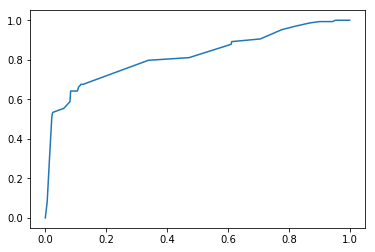

In [25]:
plt.plot(fpr, tpr)

<h2><b><font color=red> Gaussian Naive Bayes Classifier without Negation and Uncertainty </font></b></h2>

---

In [26]:
tr_x_n = train_x.drop(['hadm_id', 'negation_exist', 'uncertainty_exist'], axis = 1)


In [27]:
ts_x_n = test_x.drop(['hadm_id', 'negation_exist', 'uncertainty_exist'], axis = 1)

In [28]:
gnb = GaussianNB()

In [29]:
prY = gnb.fit(tr_x_n, train_y).predict(ts_x_n)

In [30]:
prY_prob = gnb.fit(tr_x_n, train_y).predict_proba(ts_x_n)

In [31]:
confusion_matrix(test_y, prY)

array([[1579,  186],
       [  53,   95]])

In [32]:
fpr, tpr, _ = metrics.roc_curve(np.array(test_y), prY_prob[:,1])

In [33]:
auc = metrics.auc(fpr,tpr)
auc

0.801759053671235

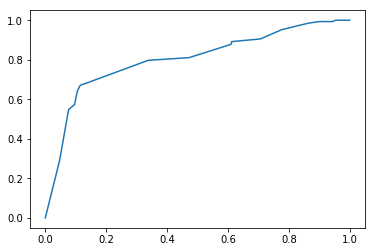

In [34]:
plt.plot(fpr, tpr)

<h2><b><font color=red> Gaussian Naive Bayes Classifier only with Negation </font></b></h2>

---

In [35]:
tr_x_neg = train_x.drop(['hadm_id', 'uncertainty_exist'], axis = 1)


In [36]:
ts_x_neg = test_x.drop(['hadm_id', 'uncertainty_exist'], axis = 1)

In [37]:
gnb = GaussianNB()

In [38]:
prY = gnb.fit(tr_x_neg, train_y).predict(ts_x_neg)

In [39]:
prY_prob = gnb.fit(tr_x_neg, train_y).predict_proba(ts_x_neg)

In [40]:
confusion_matrix(test_y, prY)

array([[1589,  176],
       [  53,   95]])

In [41]:
fpr, tpr, _ = metrics.roc_curve(np.array(test_y), prY_prob[:,1])

In [42]:
auc = metrics.auc(fpr,tpr)
auc

0.8197438940356788

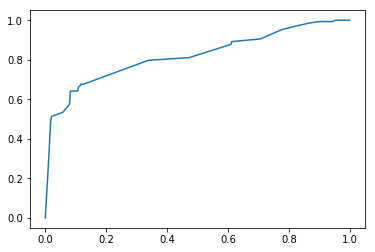

In [43]:
plt.plot(fpr, tpr)

<h2><b><font color=red> Random Forest Classifier with Negayion and Uncertainty: </font></b></h2>

---

In [44]:
rfc= RandomForestClassifier(random_state=110)

In [45]:
prY = rfc.fit(tr_x, train_y).predict(ts_x)

/opt/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [46]:
prY_prob = rfc.fit(tr_x, train_y).predict_proba(ts_x)

In [47]:
confusion_matrix(test_y, prY)

array([[1722,   43],
       [  67,   81]])

In [48]:
fpr, tpr, _ = metrics.roc_curve(np.array(test_y), prY_prob[:,1])

In [49]:
auc = metrics.auc(fpr,tpr)
auc

0.7935322716484188

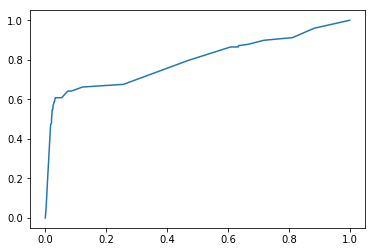

In [50]:
plt.plot(fpr, tpr)

In [51]:
feature_importances = pd.DataFrame(rfc.feature_importances_,
                                   index = tr_x.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)

In [52]:
feature_importances.reset_index(inplace = True)

In [53]:
feature_importances

,index,importance
0,cui_exist,0.434613
1,negation_exist,0.386811
2,seq_number,0.162330
3,uncertainty_exist,0.016246


In [54]:
#feature_importances = feature_importances[0:3]

<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

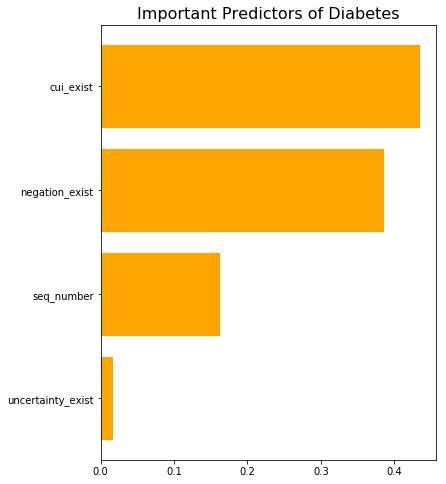

In [55]:
#from pyplot import *

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (6,8), sharex=True, sharey=True)
axes.barh(feature_importances['index'],feature_importances['importance'],  align = 'center', color = "orange")
axes.set_title("Important Predictors of Diabetes", fontsize = 16)
axes.invert_yaxis()
plt.tight_layout

In [56]:
fig.savefig('Importance.png', bbox_inches = 'tight')

<h2><b><font color=red> Random Forest Classifier without Negayion and Uncertainty: </font></b></h2>

---

In [57]:
rfc= RandomForestClassifier(random_state=110)

In [58]:
prY = rfc.fit(tr_x_n, train_y).predict(ts_x_n)

/opt/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [59]:
prY_prob = rfc.fit(tr_x_n, train_y).predict_proba(ts_x_n)

In [60]:
confusion_matrix(test_y, prY)

array([[1765,    0],
       [ 148,    0]])

In [61]:
fpr, tpr, _ = metrics.roc_curve(np.array(test_y), prY_prob[:,1])

In [62]:
auc = metrics.auc(fpr,tpr)
auc

0.7814217900620167

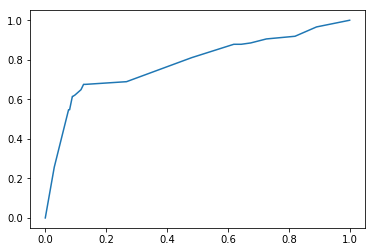

In [63]:
plt.plot(fpr, tpr)

In [64]:
feature_importances = pd.DataFrame(rfc.feature_importances_,
                                   index = tr_x_n.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)

In [65]:
feature_importances.reset_index(inplace = True)

In [66]:
feature_importances

,index,importance
0,cui_exist,0.792037
1,seq_number,0.207963


<h2><b><font color=red> Random Forest Classifier only with Negayion: </font></b></h2>

---

In [67]:
rfc= RandomForestClassifier(random_state=110)

In [68]:
prY = rfc.fit(tr_x_neg, train_y).predict(ts_x_neg)

/opt/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


In [69]:
prY_prob = rfc.fit(tr_x_neg, train_y).predict_proba(ts_x_neg)

In [70]:
confusion_matrix(test_y, prY)

array([[1725,   40],
       [  66,   82]])

In [71]:
fpr, tpr, _ = metrics.roc_curve(np.array(test_y), prY_prob[:,1])

In [72]:
auc = metrics.auc(fpr,tpr)
auc

0.796975729270347

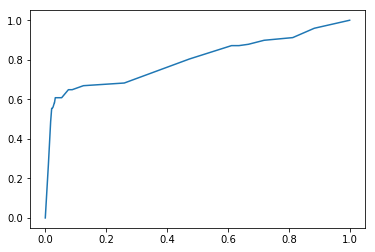

In [73]:
plt.plot(fpr, tpr)

In [74]:
feature_importances = pd.DataFrame(rfc.feature_importances_,
                                   index = tr_x_neg.columns,
                                    columns=['importance']).sort_values('importance', ascending=False)

In [75]:
feature_importances.reset_index(inplace = True)

In [76]:
feature_importances

,index,importance
0,cui_exist,0.601592
1,negation_exist,0.267964
2,seq_number,0.130444
